In [1]:
%config Completer.use_jedi = False

In [7]:
%load_ext autoreload
%autoreload 2
import matplotlib.font_manager as font_manager
import ncempy.io as nio
import joblib
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from scipy.signal import savgol_filter
import math
from sklearn.model_selection import train_test_split
# from Materials_Project_Functions import *
from Analysis_objects_and_functions import PCA_spectra
from Analysis_objects_and_functions import *
from sklearn.metrics import r2_score
import glob
from mp_api.client import MPRester
from sklearn import tree
import pydotplus
# import ncempy.io as nio

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
from mp_api.client import MPRester

<font size="6"> Load Data and Define XAS/EELS Analysis Object

In [10]:
test_rf_obj = eels_rf_setup('final_df_new_test.joblib') # initialize analysis object and add dataset path to it t
test_rf_obj.load_spectra_df() # load dataframe 
test_rf_obj.augment_df_with_mixtures() # run augmentation function that adds mixture spectra to the dataframe 

# load lists containing whether each spectrum is stable/has been synthesized
prop_labeling_stable = joblib.load('prop_labeling_stable.joblib') 
prop_labeling_exp = joblib.load('prop_labeling_exp.joblib')

test_rf_obj.spectra_df['is_stable'] = prop_labeling_stable 
test_rf_obj.spectra_df['is_theoretical'] = prop_labeling_exp # if this is false, the material has been synthesized. This is how 
# the materials project defines this quantity

In [11]:
# uncomment to visualize dataframe 
print(sum(np.asarray(test_rf_obj.spectra_df.iloc[0:3426]['BV Used For Alignment'].value_counts())[0:3])/3426)


0.9319906596614127


In [12]:
subdf = test_rf_obj.spectra_df.iloc[0:3426]

In [13]:
len(subdf.loc[(test_rf_obj.spectra_df['is_stable']==False)&(test_rf_obj.spectra_df['is_theoretical']==True)])

59

<font size="6"> Train Random Foreset Model and Visualize Results - All 3 Components of Figure 2

In [14]:
test_rf_obj.random_forest_train_bond_valance(bv_column='BV Used For Alignment',
                           spectra_to_predict = 'Cumulative_Spectra_TEAM_1_aligned_925_970',
                        energy_col = 'new Scaled Energies use', 
                                             max_features = 'auto')

len training data = 7067
Using column: Cumulative_Spectra_TEAM_1_aligned_925_970 to predict: BV Used For Alignment
model accuracy (R^2) on simulated test data 0.8889127604122083


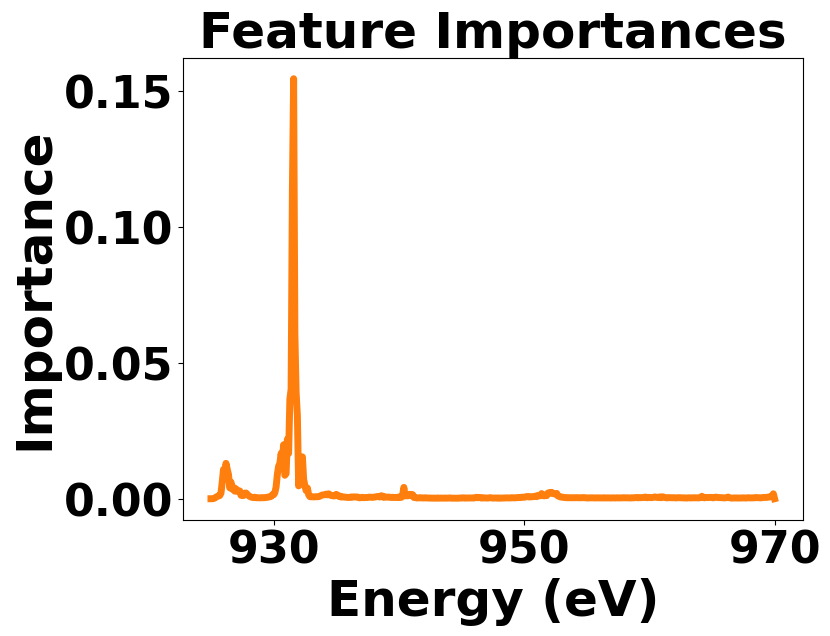

In [15]:
test_rf_obj.show_feature_importances('Cu', savefigure=False)
# visualize feature importances for the RF model 

num spectra = 2356
model accuracy (R^2) on simulated test data 0.8889127604122083


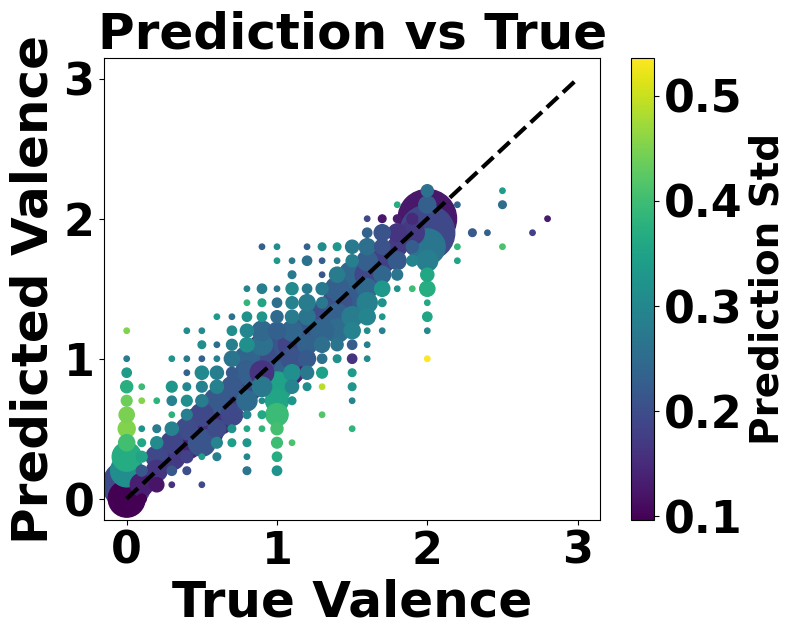

In [16]:
test_rf_obj.show_r2(savefigure=False)
# Show R2 plot for simulated data reserved from training. The top plot shows data colored by the number of points at 
# that position, while the bottom plot is colored by prediction standard deviation

RMSE 0.20825025504909622


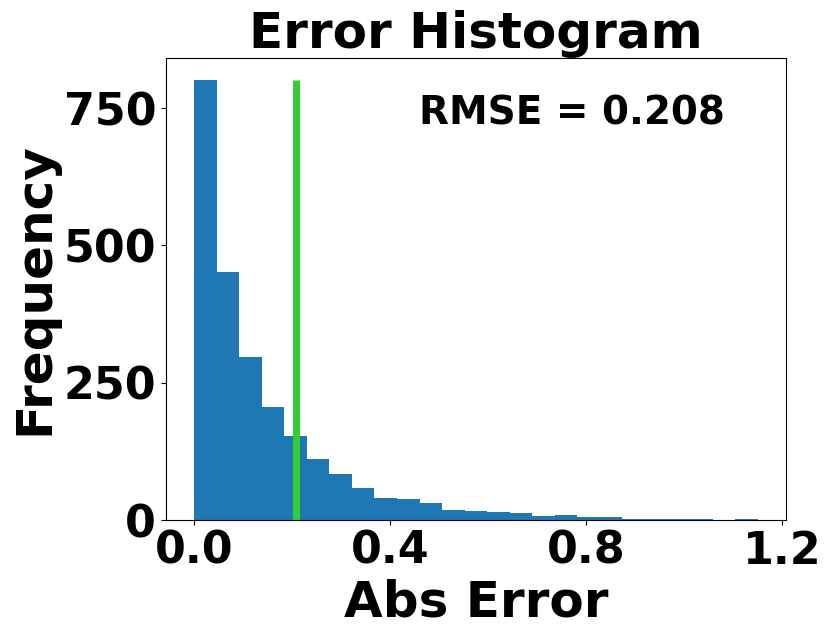

In [17]:
test_rf_obj.show_errors_histogram(nbins=25, savefigure=False)
# show error histogram for simulated data reserved from training. The solid green line is the location of the RMSE 

<font size="6"> Visualize Dataset Distribution and The creation of Mixture Samples. Figure 1 II and III, and Figure S4

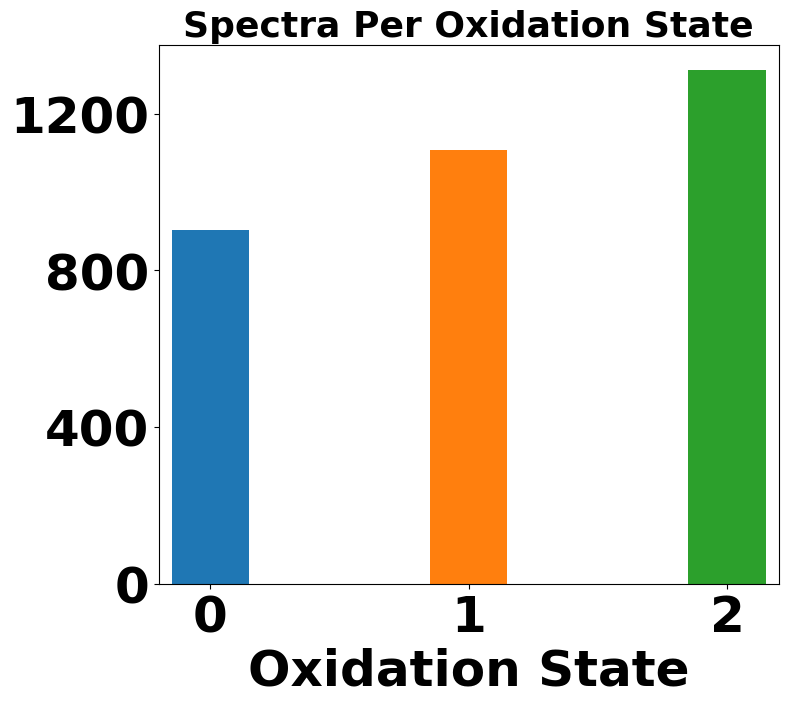

In [18]:
test_rf_obj.visualize_mixture_addition(include_mixtures=False, savefigure=False)

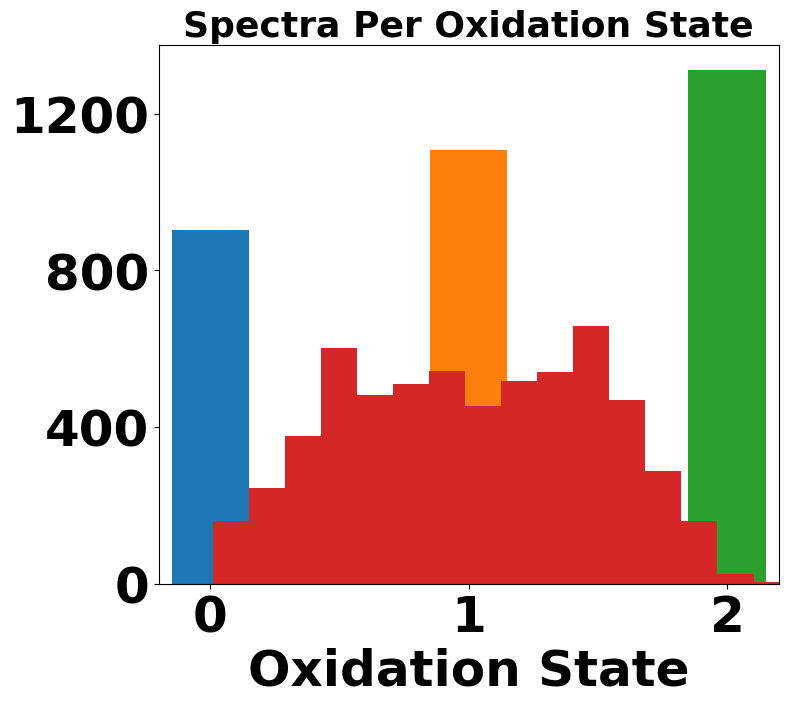

In [19]:
test_rf_obj.visualize_mixture_addition(include_mixtures=True, savefigure=False)

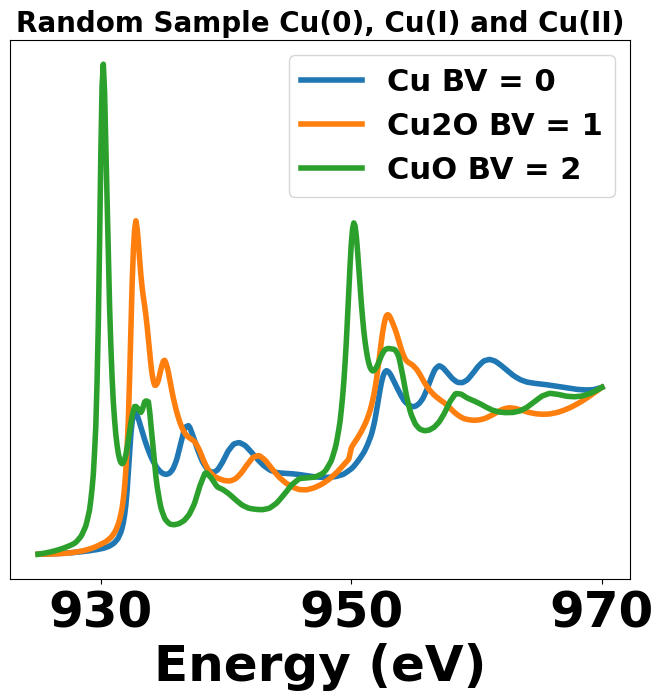

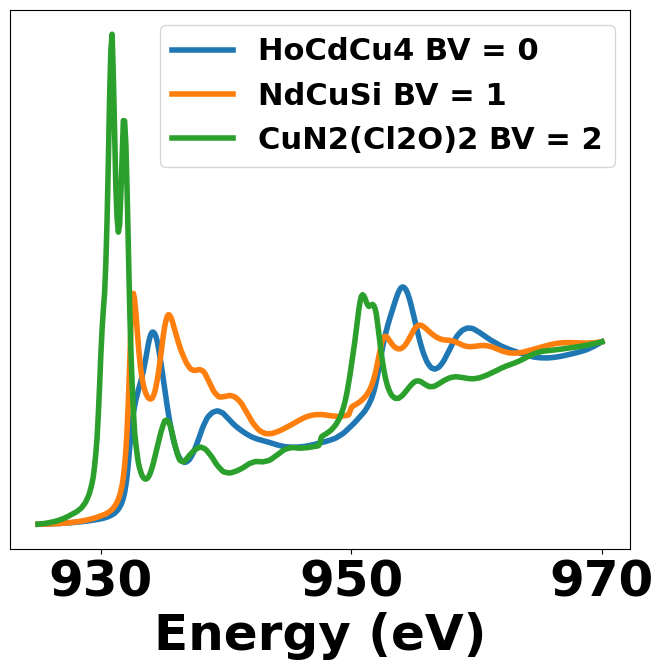

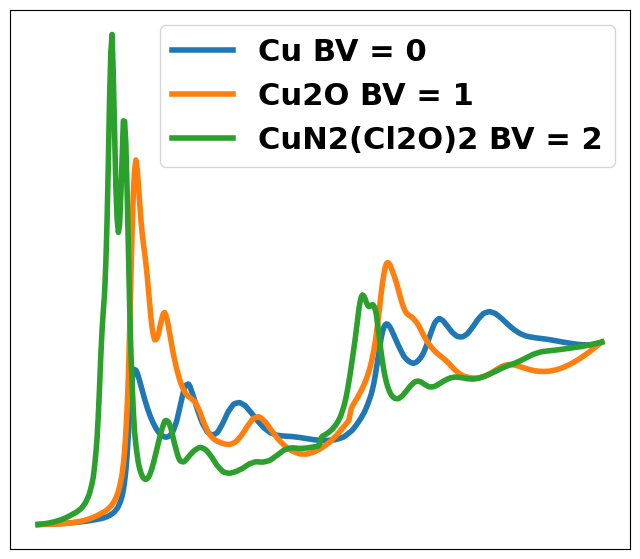

In [20]:
test_rf_obj.visualize_mixture_components('mp-30', 'mp-361', 'mp-704645', include_title=True, include_ticks = True, 
                                         savefigure=False)
test_rf_obj.visualize_mixture_components('mp-12007', 'mp-8120', 'mp-1188453', include_title=False)
test_rf_obj.visualize_mixture_components('mp-30', 'mp-361', 'mp-1188453', include_title=False, include_ticks = False)

False
False
True


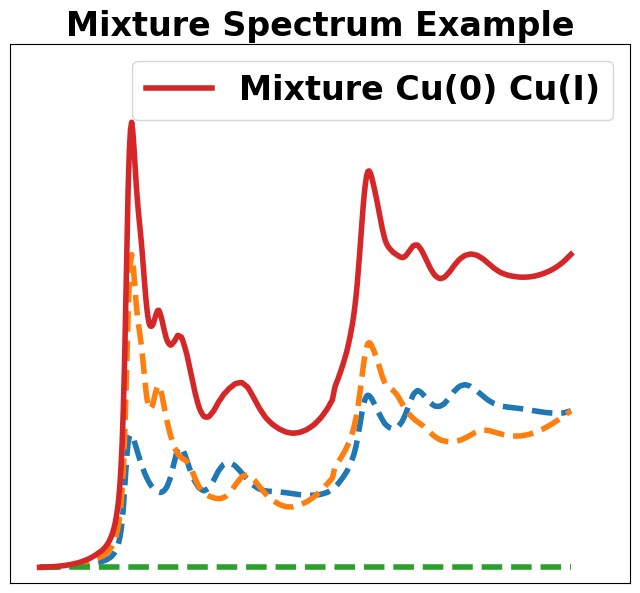

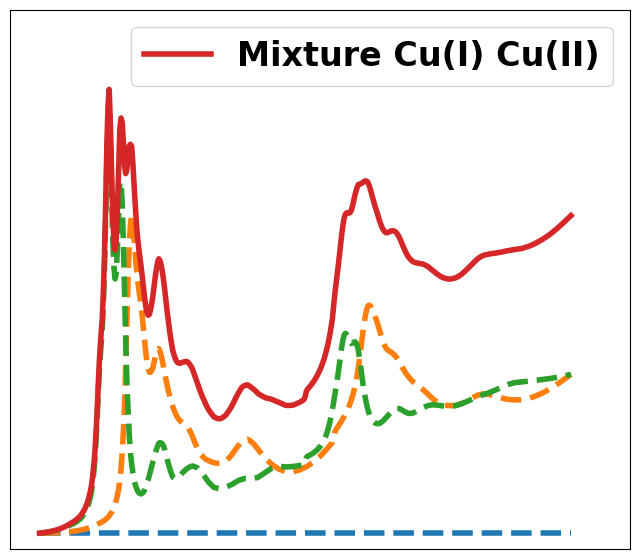

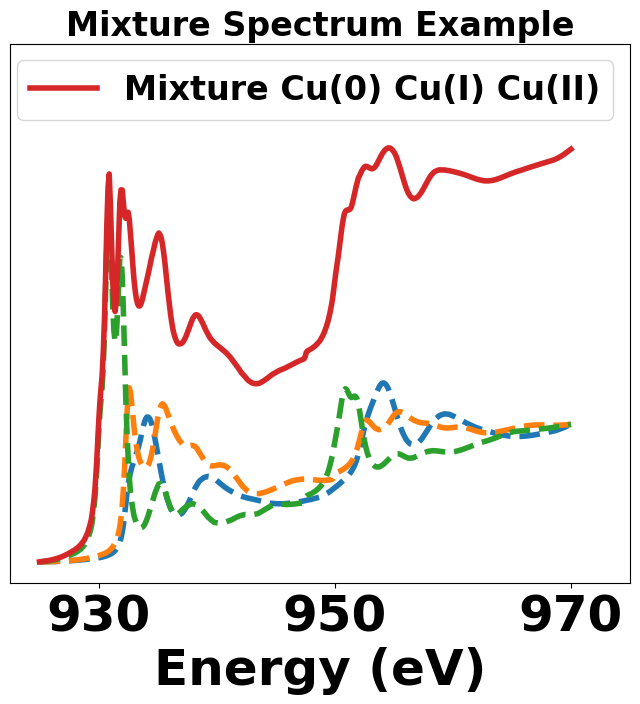

In [21]:
test_rf_obj.visualize_mixtures('mp-30', 'mp-361', 'mp-1188453', 0.5, 0.5, 0.0, include_title = True, savefigure = False)
test_rf_obj.visualize_mixtures('mp-30', 'mp-361', 'mp-1188453', 0.0, 0.5, 0.5, include_title = False, savefigure = False)
test_rf_obj.visualize_mixtures('mp-12007', 'mp-8120', 'mp-1188453', 0.33, 0.33, 0.33, include_ticks = True, include_title = True,
                  savefigure = False)

<font size="6"> Validation on Experimental Samples. Figure 1 IV and Figure 3

Predicting From Cu_deconvolved_spectra\Cu Metal Deconvolved Spectrum.dm4
Energy Axis Shift = 0
Smoothing Parameters = [51, 3]
prediction = 0.31
prediction std = 0.32
 


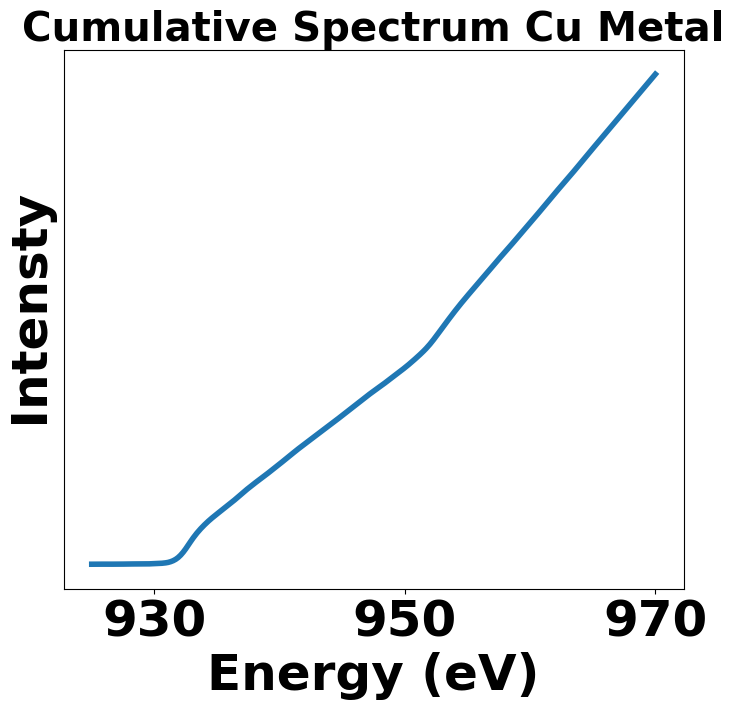

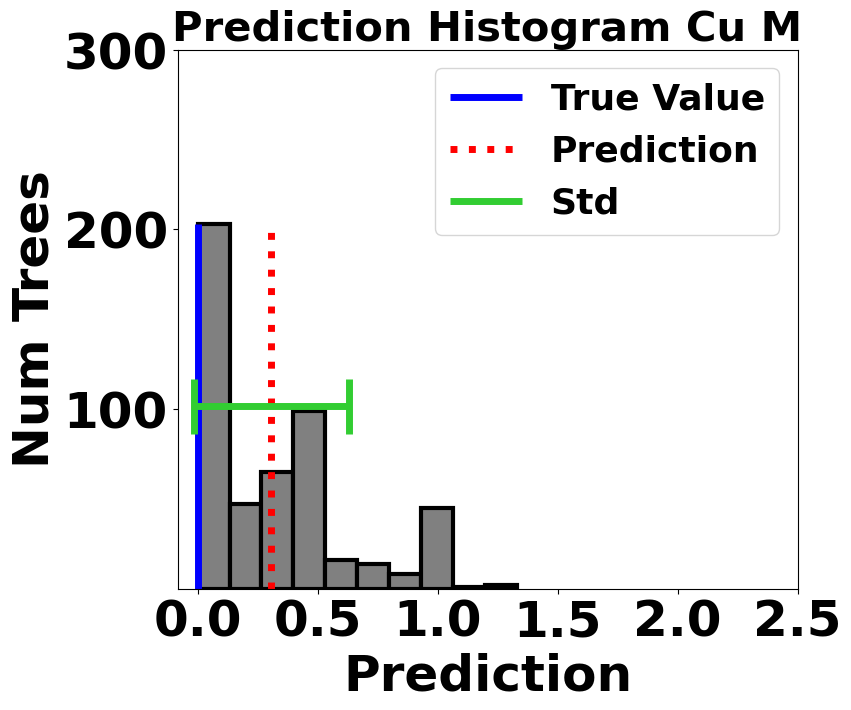

Predicting From Cu_deconvolved_spectra\Cu2O Deconvolved Spectrum.dm4
Energy Axis Shift = 0
Smoothing Parameters = [51, 3]
prediction = 1.08
prediction std = 0.31
 


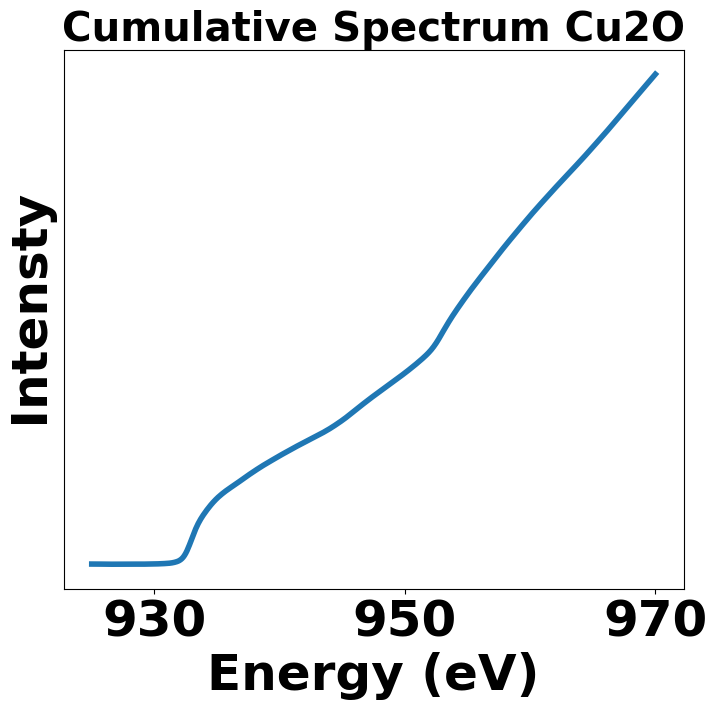

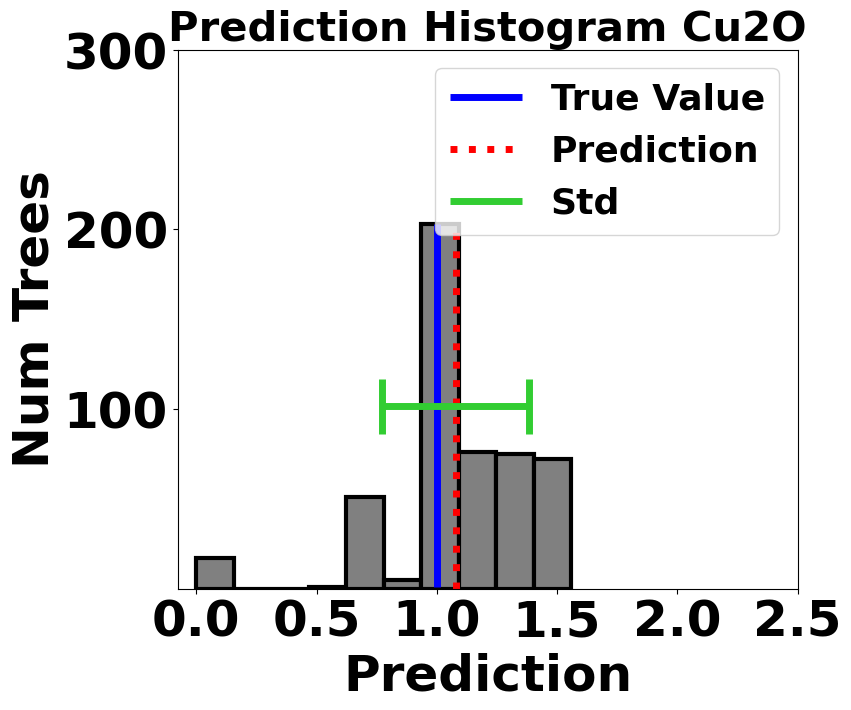

Predicting From Cu_deconvolved_spectra\CuO Deconvolved Spectrum.dm4
Energy Axis Shift = 0
Smoothing Parameters = [51, 3]
prediction = 1.99
prediction std = 0.2
 


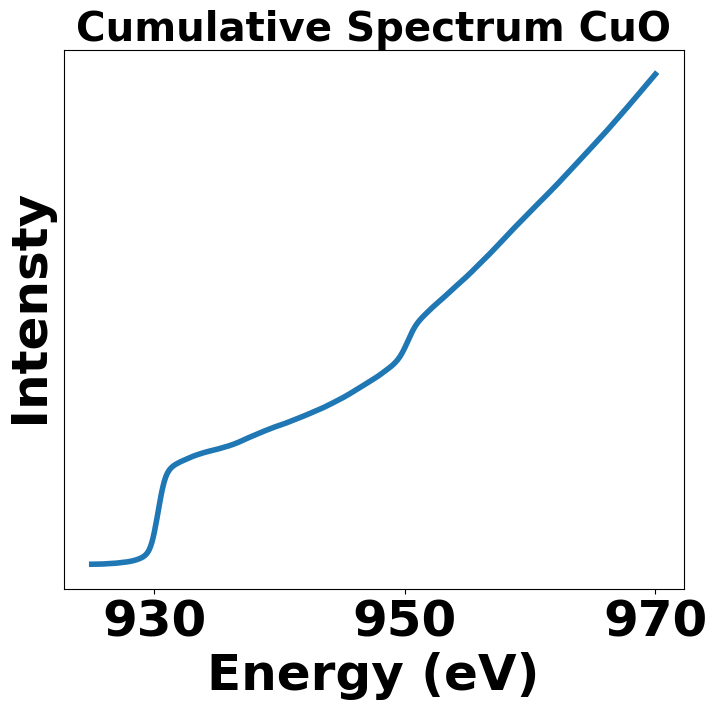

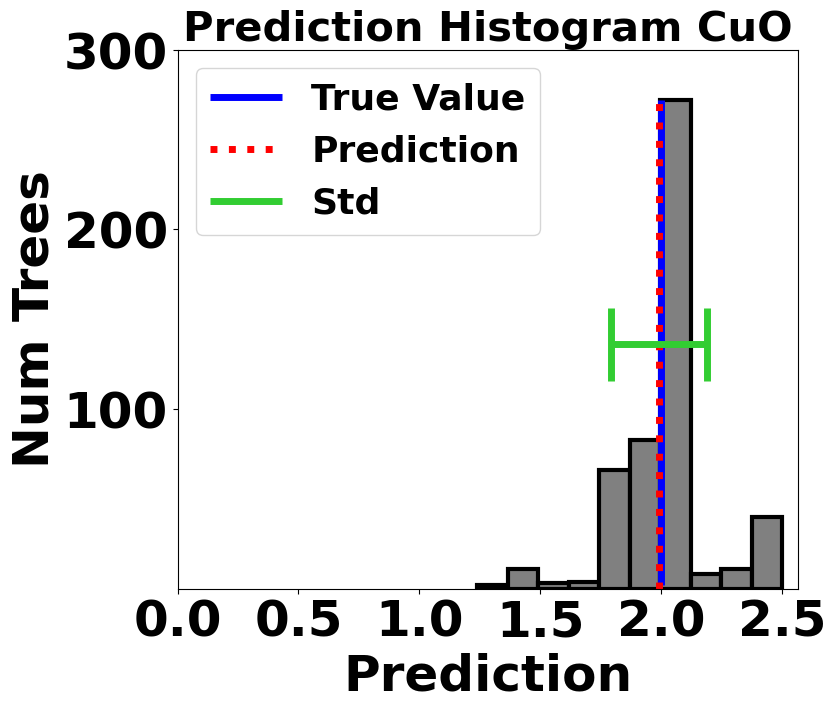

In [24]:
test_rf_obj.predict_experiment_folder('Cu_deconvolved_spectra/', spectra_type = 'TEAM I', 
                                      shifts = [0], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[51,3]], 
                                      show_hist=True, show_inputted_spectrum=True, print_details = True,
                                     savefigure=False)

<font size="6"> Visualize Energy Axis Shift For Experimental Samples. Figure 4

In [25]:
shifts = np.linspace(-1.5,1.5,31)

In [26]:
test_rf_obj.predict_experiment_folder('Cu_deconvolved_spectra/', spectra_type = 'TEAM I', 
                                      shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[51,3]],
                                     print_details = False)

╒══════════════╤══════════════╤══════════════════╤════════════════════════╕
│   Shift (eV) │   Prediction │   Prediction STD │   True Oxidation State │
╞══════════════╪══════════════╪══════════════════╪════════════════════════╡
│         -1.5 │         1.95 │             0.38 │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1.4 │         1.88 │             0.51 │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1.3 │         1.82 │             0.52 │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1.2 │         1.81 │             0.47 │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1.1 │         1.79 │             0.49 │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1

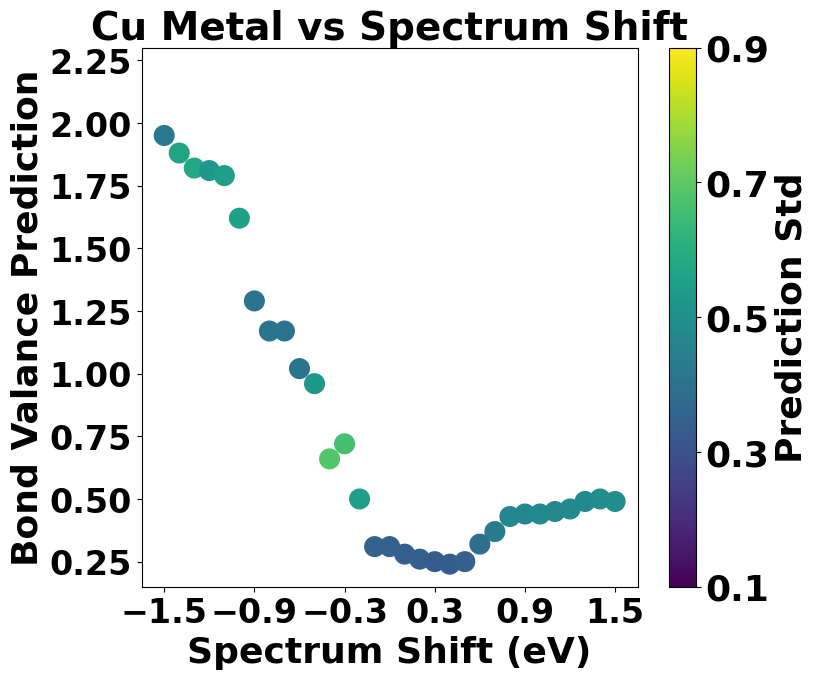

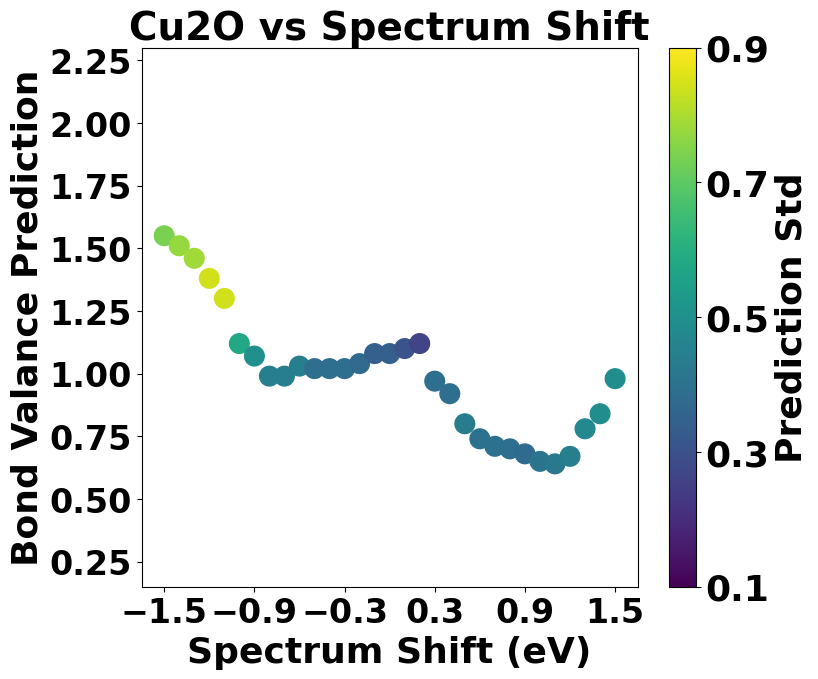

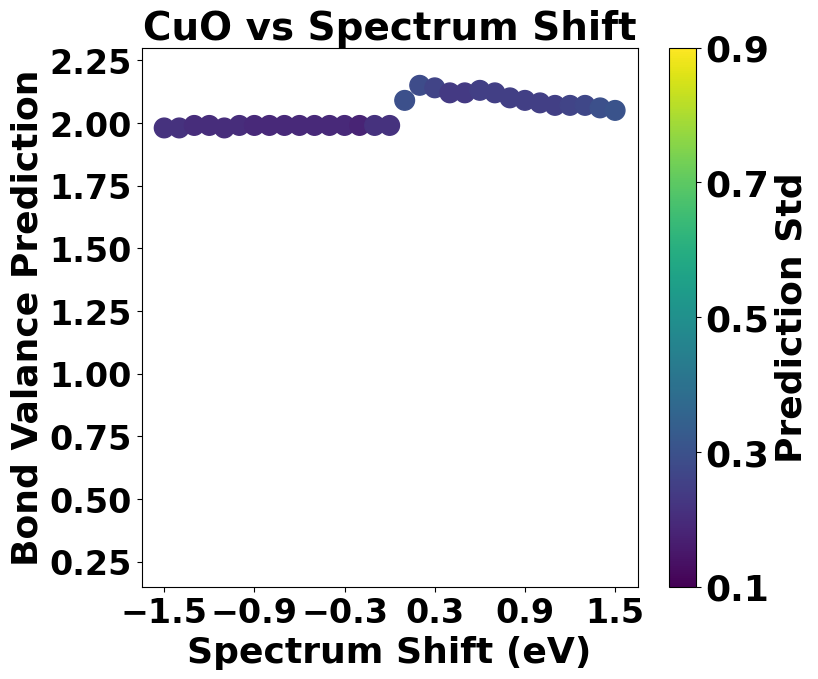

In [28]:
test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = True, savefigure=False)

In [62]:
test_rf_obj.predict_experiment_folder('xas paper/', spectra_type = 'csv', 
                                      shifts = shifts, theory_column = 'TEAM_1_aligned_925_970', smoothings = [[15,3]],
                                     print_details = False, show_hist=False, show_plots=False)

# need to go back and make smoothing parameters automatic based on energy range, and for instances where the energy range
# isn't even, interpolation needs to be done before smoothing

╒══════════════╤══════════════╤══════════════════╤════════════════════════╕
│   Shift (eV) │   Prediction │   Prediction STD │   True Oxidation State │
╞══════════════╪══════════════╪══════════════════╪════════════════════════╡
│         -1.5 │         1.12 │             0.58 │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1.4 │         0.89 │             0.6  │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1.3 │         0.78 │             0.61 │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1.2 │         0.7  │             0.63 │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1.1 │         0.41 │             0.48 │                      0 │
├──────────────┼──────────────┼──────────────────┼────────────────────────┤
│         -1

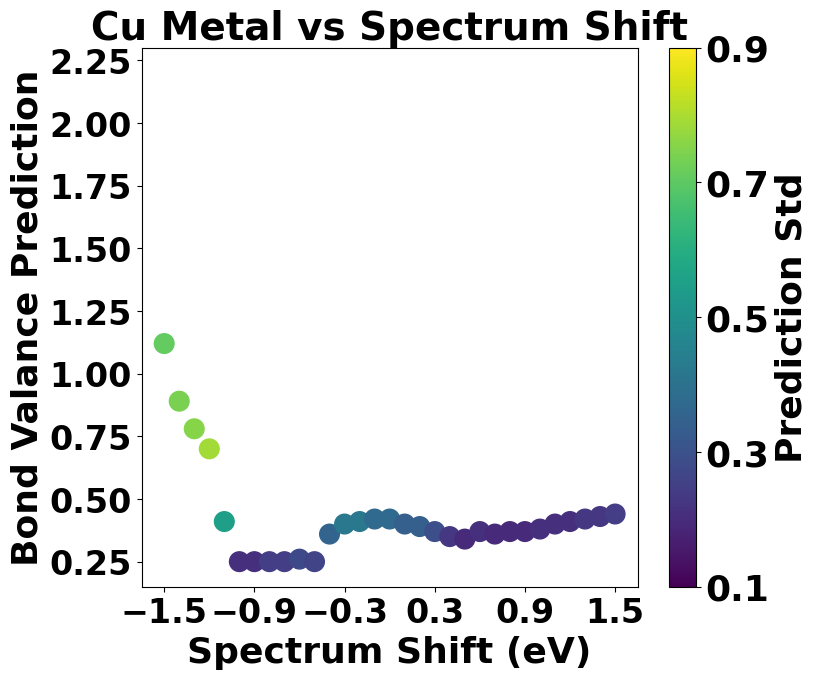

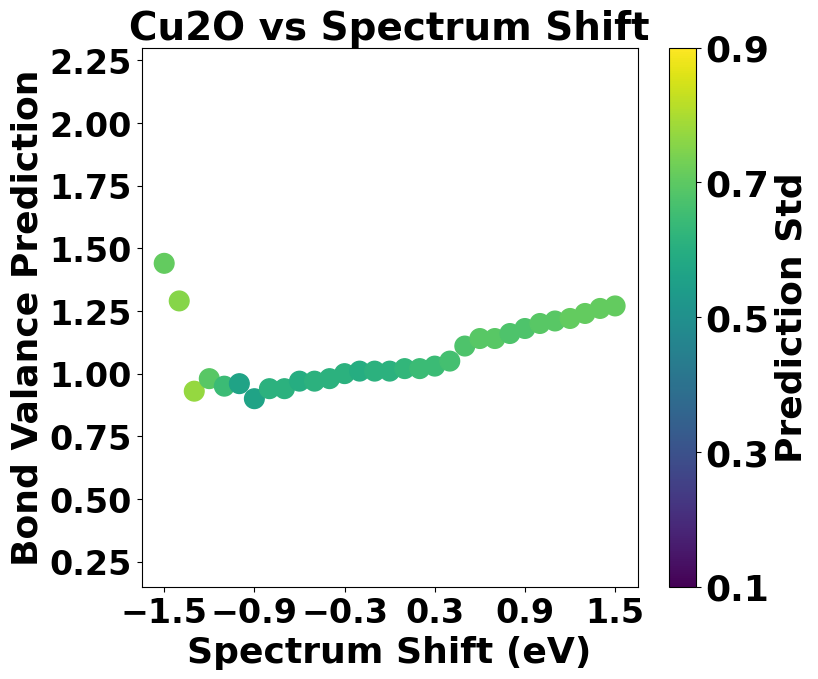

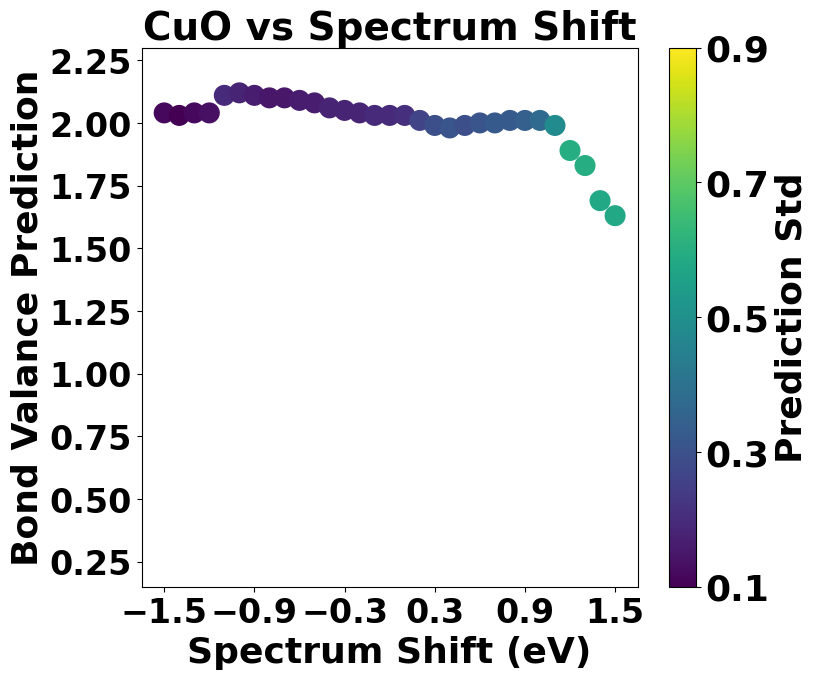

In [63]:
test_rf_obj.visualize_shift(material = 'All', show_stds = False, show_table = True, savefigure=False)

<font size="6"> Predict Experimental Mixtures. Figure 5

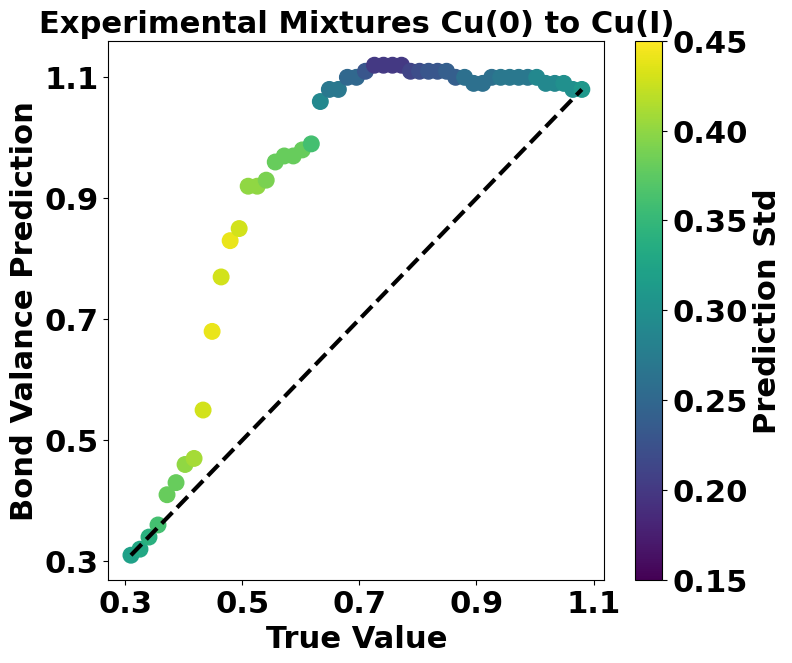

In [32]:
test_rf_obj.experimental_mixed_valent(catagory = '0-1', colorbar_range = [0.15, 0.45], savefigure = False)

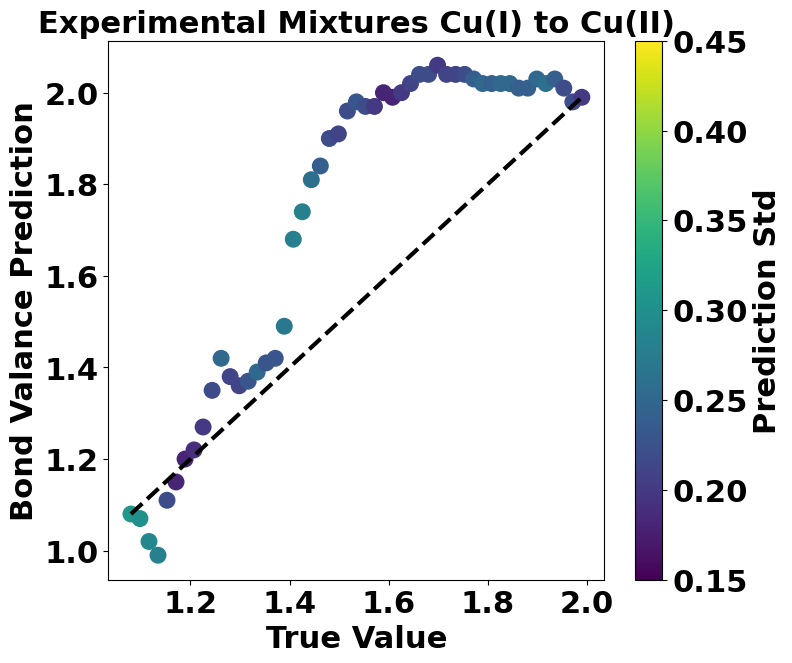

In [33]:
test_rf_obj.experimental_mixed_valent(catagory = '1-2', colorbar_range = [0.15, 0.45], savefigure = False)

<font size="6"> Augment Test Set With Noise and Predict Noisy Spectra. Figure 6

In [35]:
test_rf_obj.add_interp_spec_to_ERROR_df([0.03], False,925)

0.03


In [31]:
# test_rf_obj.full_noise_setup('Interpolated_spec_0.03', 'Interpolated_spec_energies_0.03', 0.03, 51, filename='full_noise_df_poisson_03_new.joblib')

In [36]:
poisson_noise_df_03 = joblib.load('full_noise_df_poisson_03.joblib')

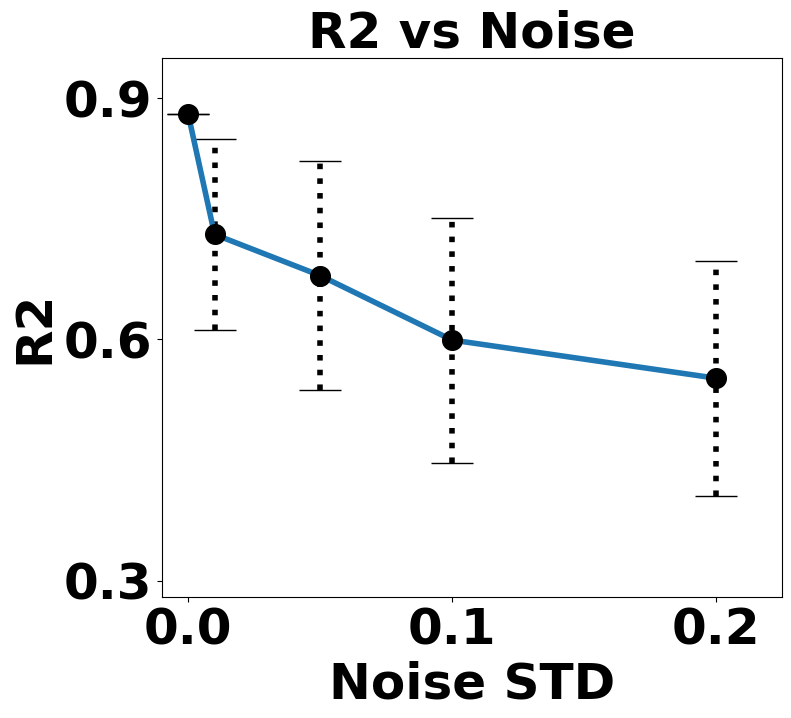

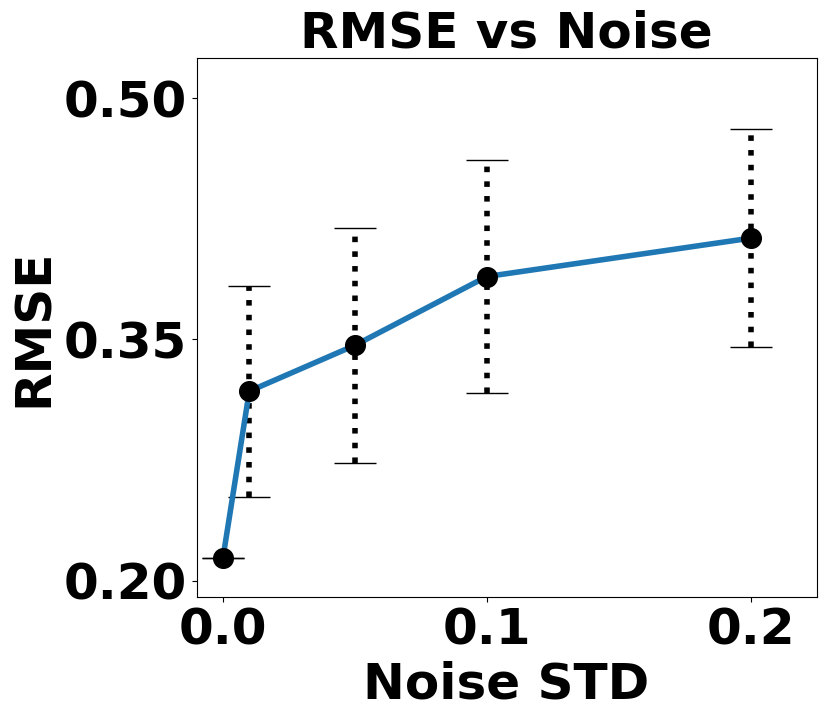

In [37]:
visualize_full_noise_test_set([poisson_noise_df_03], [0.03], savefigure=False)

<font size="6"> Comparison between literature XAS and simulated XAS spectra for Cu metal, Cu2O and CuO. Figure S1

In [66]:
Cu_metal_path = "xas paper/Cu Metal XAS.csv"
Cu2O_path = "xas paper/Cu2O XAS.csv"
CuO_path = "xas paper/CuO XAS.csv"

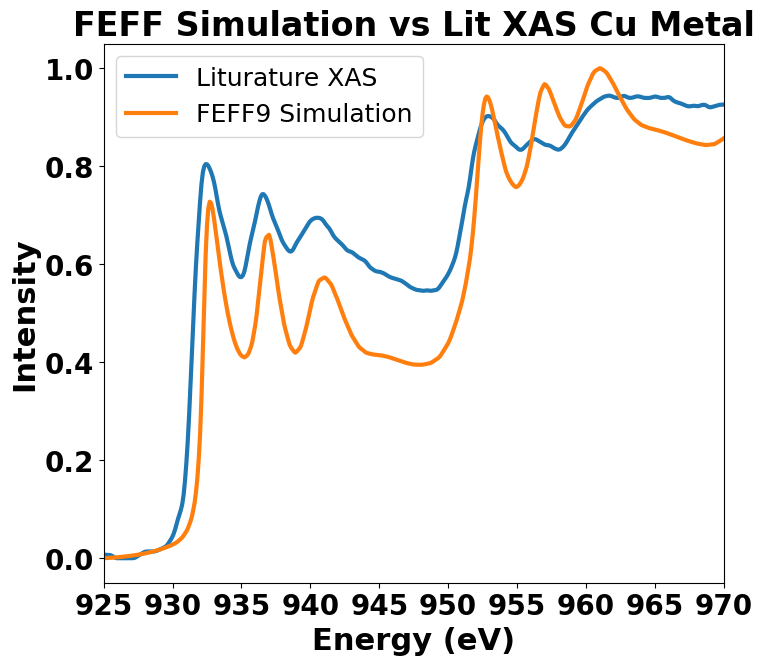

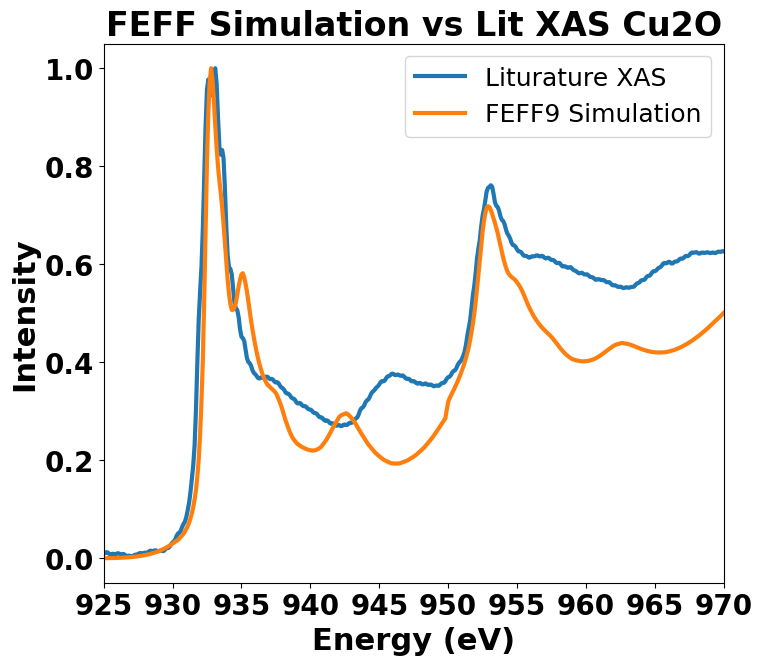

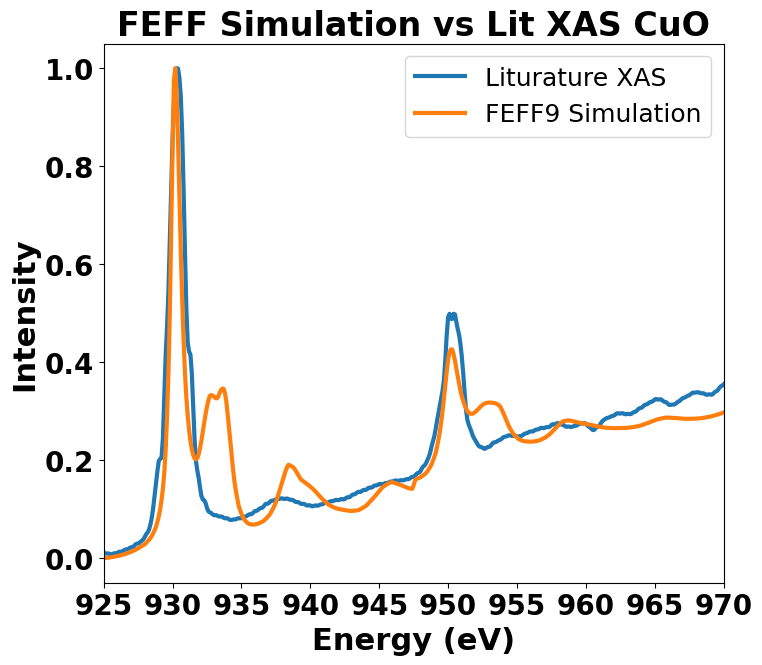

In [67]:
test_rf_obj.compare_simulation_to_experiment(show_feff = True, feff_shift = 0, material = 'Cu metal',
                           compare_to_lit = True, exp_spectrum = Cu_metal_path, lit_shift = 1.2, xlims = [925,970],
                            title = 'FEFF Simulation vs Lit XAS Cu Metal', show_experiment = False)


test_rf_obj.compare_simulation_to_experiment(show_feff = True, feff_shift = 0, material = 'Cu2O',
                           compare_to_lit = True, exp_spectrum = Cu2O_path, lit_shift = 1.2, xlims = [925,970],
                            title = 'FEFF Simulation vs Lit XAS Cu2O', show_experiment = False)


test_rf_obj.compare_simulation_to_experiment(show_feff = True, feff_shift = 0,
                           compare_to_lit = True, exp_spectrum = CuO_path, lit_shift = 1.2, xlims = [925,970],
                            title = 'FEFF Simulation vs Lit XAS CuO', show_experiment = False, material = 'CuO')

<font size="6"> Illustration of L2 and L3 Combination Into L2,3. Figure S2

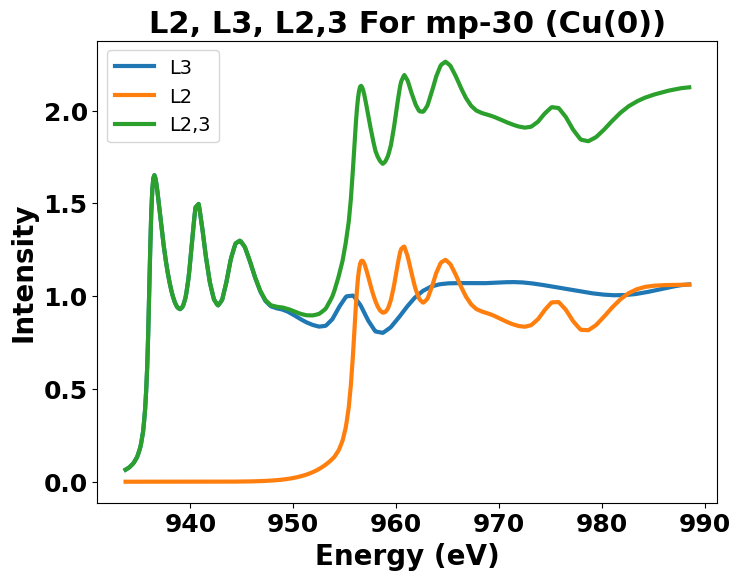

In [135]:
l2 = np.loadtxt('C:/Users/smgls/Materials_database/Stable_and_exp_Cu/Stable_and_exp_Cu/Stable_Cu_L2/mp-30/FEFF/000_Cu/xmu.dat',usecols=[0,3])
l3 = np.loadtxt('C:/Users/smgls/Materials_database/Stable_and_exp_Cu/Stable_and_exp_Cu/Stable_Cu_L3//mp-30/FEFF/000_Cu/xmu.dat',usecols=[0,3])

l2_3 = build_L2_3(l3, l2)

<font size="6"> Illustration of The Generation of The Standardized Pre Edge Region Ensuring All Spectra Start at the same point and at Zero Intensity. Figure S3

interp min = 933.8


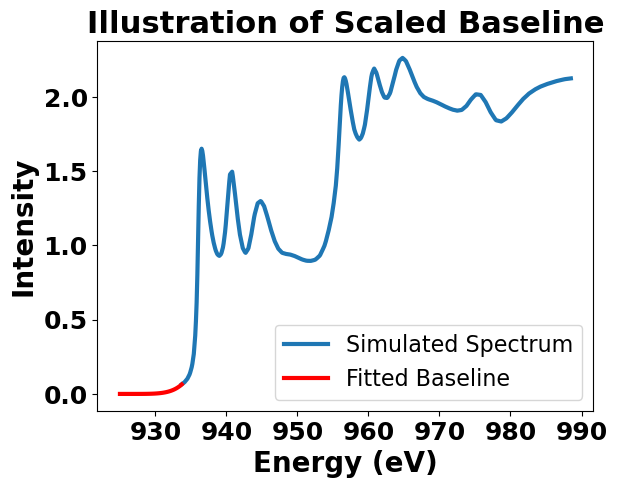

In [141]:
with open('scaled_baseline_example.pkl', 'rb') as f:
    ex_df = pickle.load(f)

ex_df = scale_spectra_flex(final_df.loc[final_df.mp_id == 'mp-30'], zero_energy = 925, show_plot=True)

<font size="6"> R2 Plot of integer valence spectra used to build the mixture dataset. Figure S5

Accuracy = 0.9751936864449045
RMSE = 0.1284148037774664
num spectra = 541
model accuracy (R^2) on simulated test data 0.8889127604122083
RMSE 0.1284148037774664


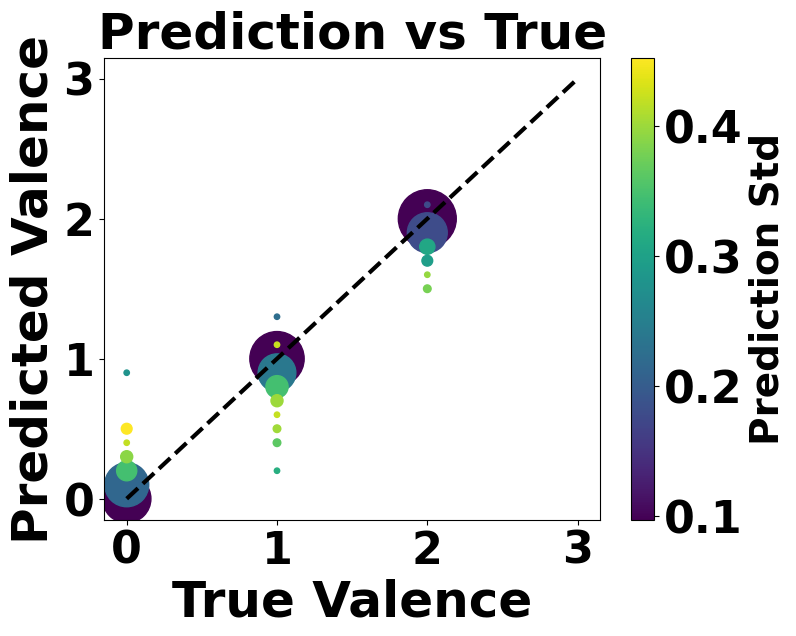

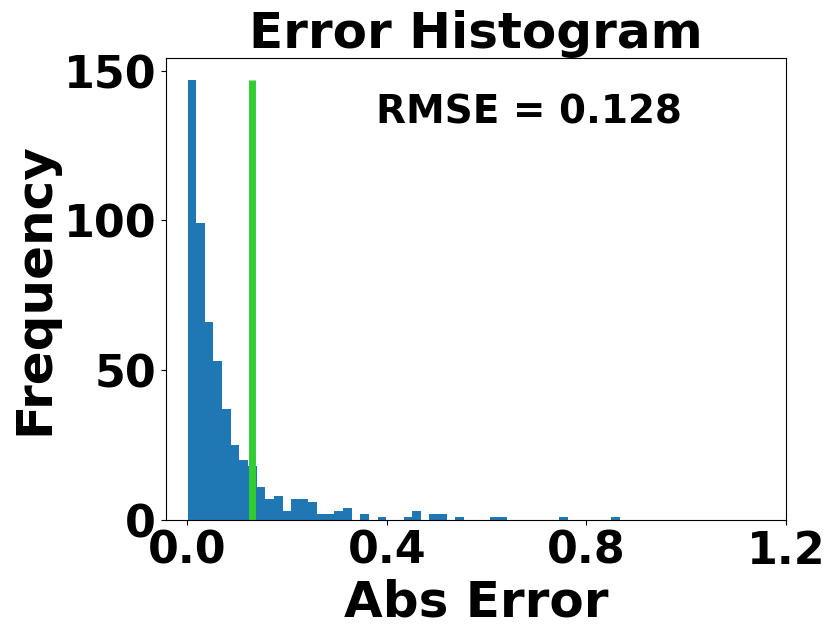

In [68]:
test_rf_obj.show_mixture_samples_accuracy()

<font size="6"> Standard Deviation Thresholds. Figure S6

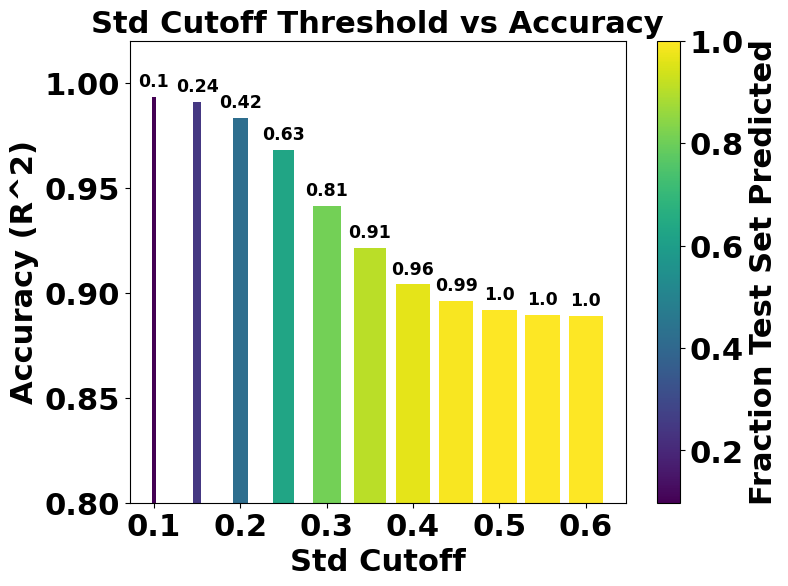

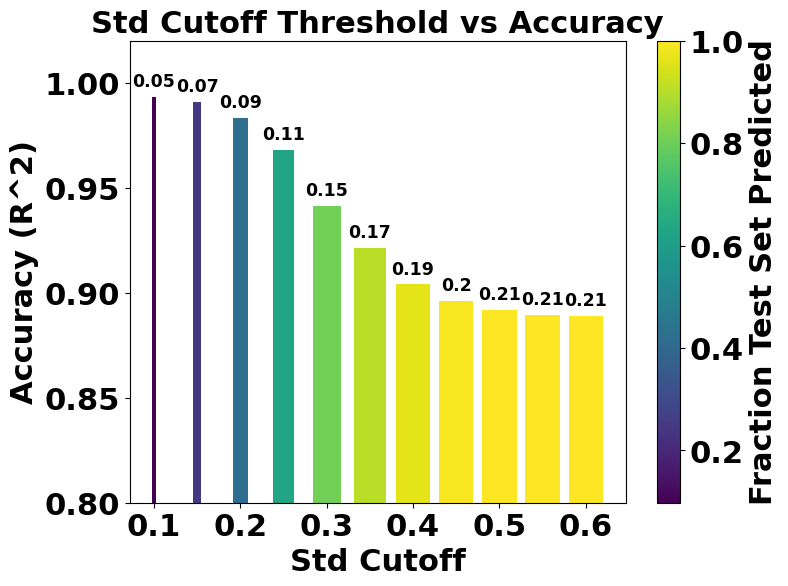

In [69]:
thresholds = np.arange(0.1, 0.65, 0.05)
test_rf_obj.visualize_all_thresholds(thresholds, ylims = [0.8, 1.02], text_fontsize = 12.5, show_type = 'percentage_predicted', 
                                    color_scheme = 'viridis', yticks_to_use = [0.8, 0.85, 0.9, 0.95, 1.0])
test_rf_obj.visualize_all_thresholds(thresholds, ylims = [0.8, 1.02], text_fontsize = 12.5, show_type = 'RMSE', 
                                    color_scheme = 'viridis', yticks_to_use = [0.8, 0.85, 0.9, 0.95, 1.0])

<font size="6"> Full Experimental Workflow. Figure S7

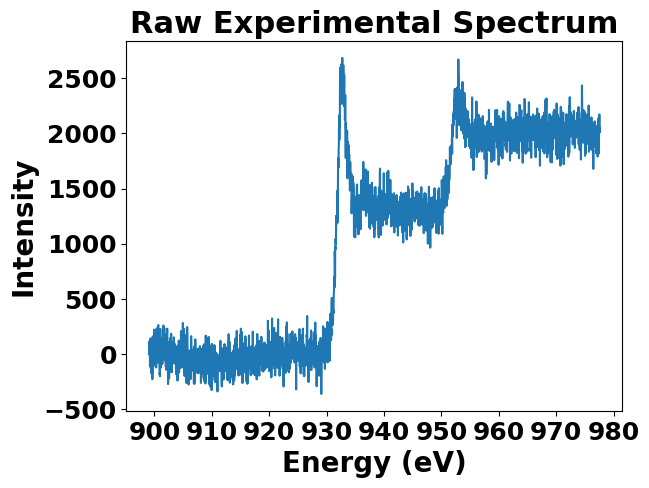

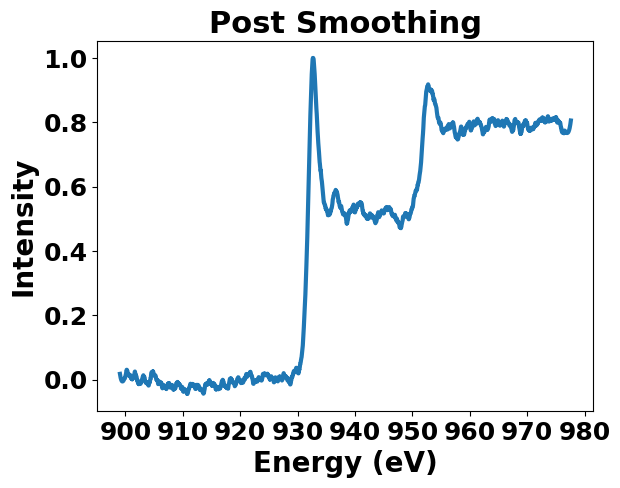

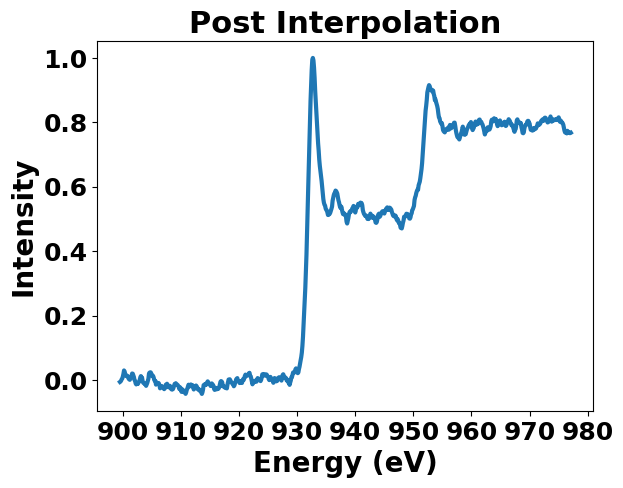

prediction = 0.31
prediction std = 0.32
 


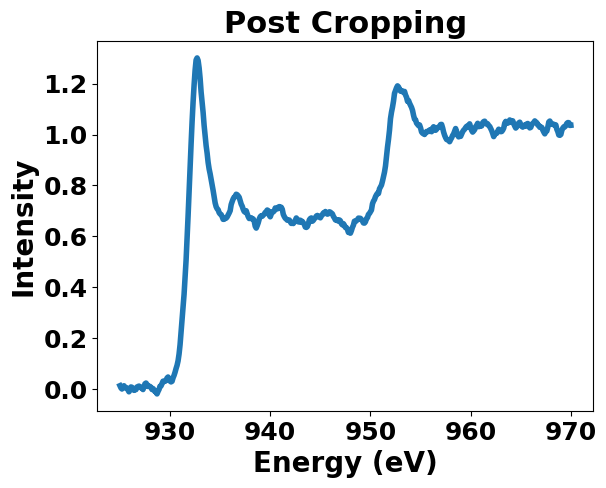

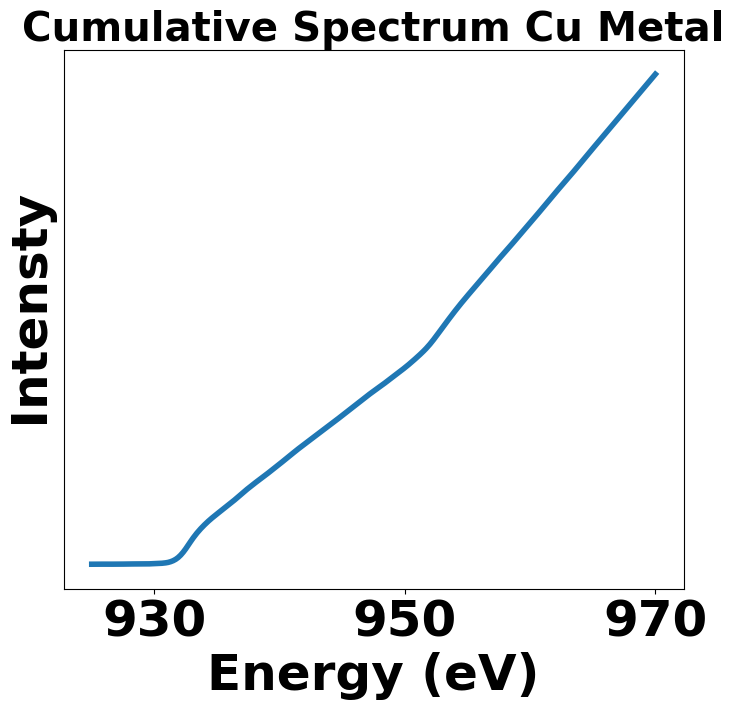

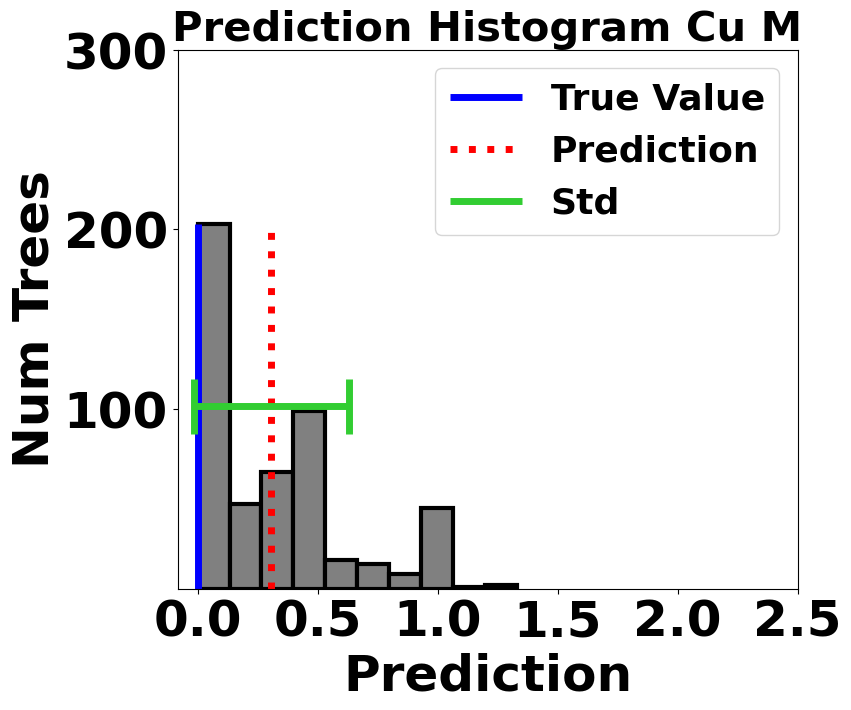

In [70]:
test_rf_obj.predict_experiment_random_forest('C:/Users/smgls/Materials_database/Cu_deconvolved_spectra/Cu Metal Deconvolved Spectrum.dm4',
                                             1640, 'Cu Metal', smoothing='inputted single', exp_spectrum_type='TEAM I',
                                            smoothing_parms=[51,3], points_to_average=10, cumulative_spectrum=True,
                                            spectrum_energy_shift=0.0, theory_column='TEAM_1_aligned_925_970', 
                                            energies_range=[925,970], show_hist=True, show_plots=True, show_inputted_spectrum = True,
                                            savefigure=False)

<font size="6"> Experimental EELS vs Literature XAS Cu Metal and Cu2O. Figure S8

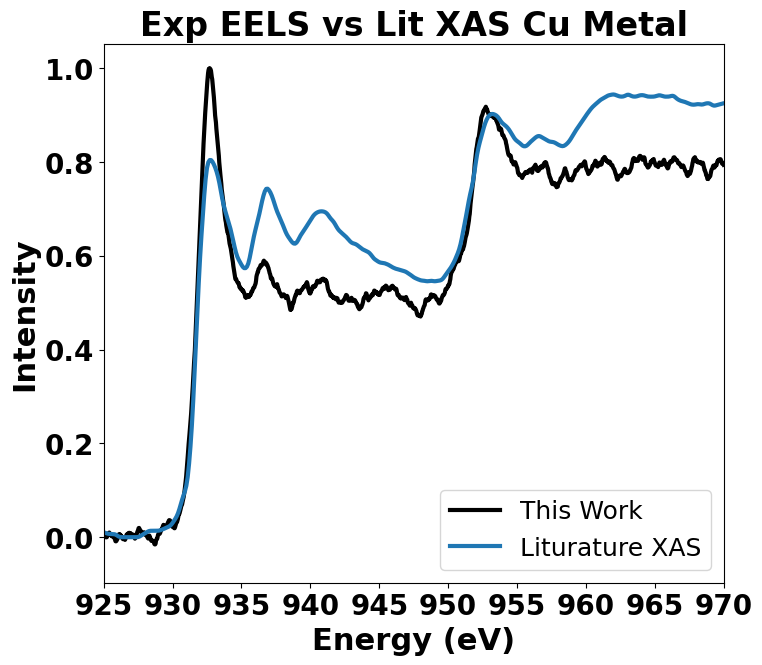

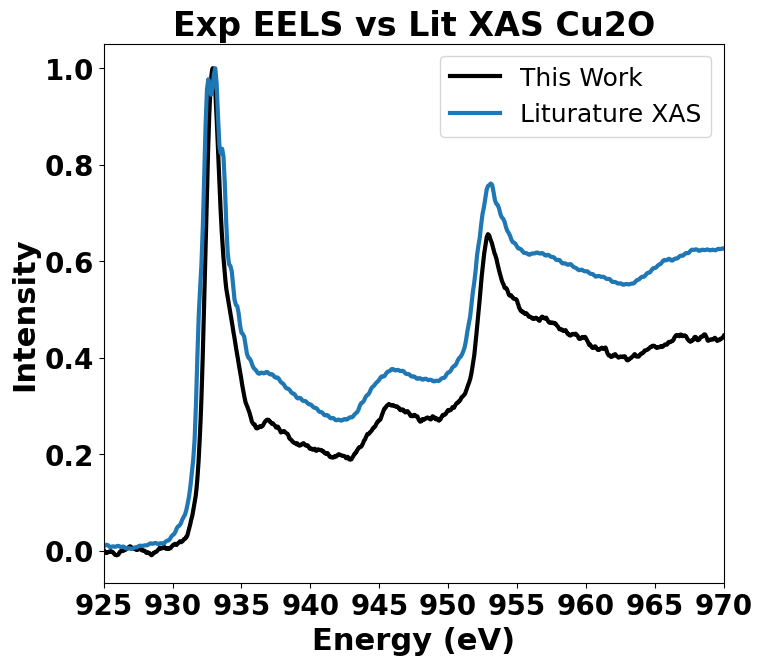

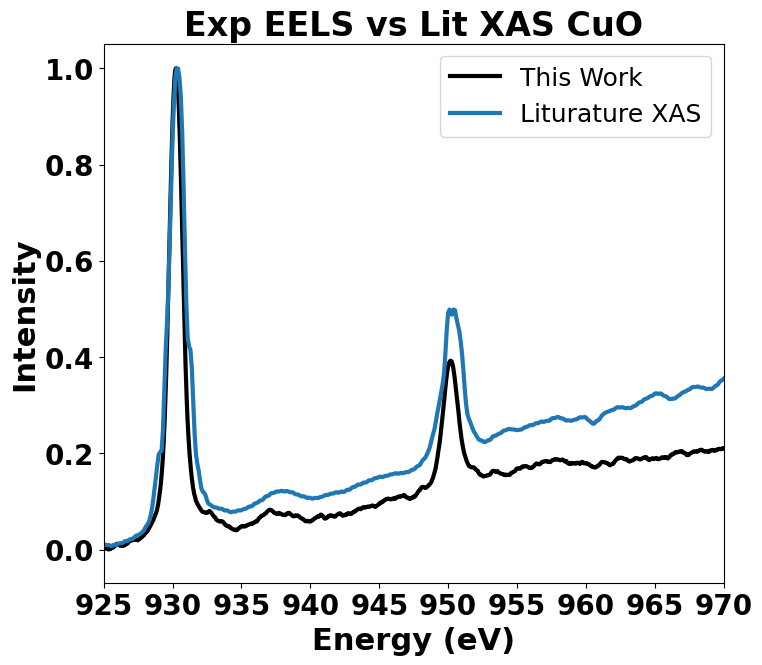

In [61]:
test_rf_obj.compare_simulation_to_experiment(show_feff = False, feff_shift = 0, material = 'Cu metal',
                           compare_to_lit = True, exp_spectrum = Cu_metal_path, lit_shift = 0.9, xlims = [925,970],
                            title = 'Exp EELS vs Lit XAS Cu Metal', show_experiment = True)


test_rf_obj.compare_simulation_to_experiment(show_feff = False, feff_shift = 0, material = 'Cu2O',
                           compare_to_lit = True, exp_spectrum = Cu2O_path, lit_shift = 1.2, xlims = [925,970],
                            title = 'Exp EELS vs Lit XAS Cu2O', show_experiment = True)

test_rf_obj.compare_simulation_to_experiment(show_feff = False, feff_shift = 0, material = 'CuO',
                           compare_to_lit = True, exp_spectrum = CuO_path, lit_shift = 1.2, xlims = [925,970],
                            title = 'Exp EELS vs Lit XAS CuO', show_experiment = True)

<font size="6"> Simulated Mixture Spectra, Mixtures of Cu metal, Cu2O and CuO. Figure S9

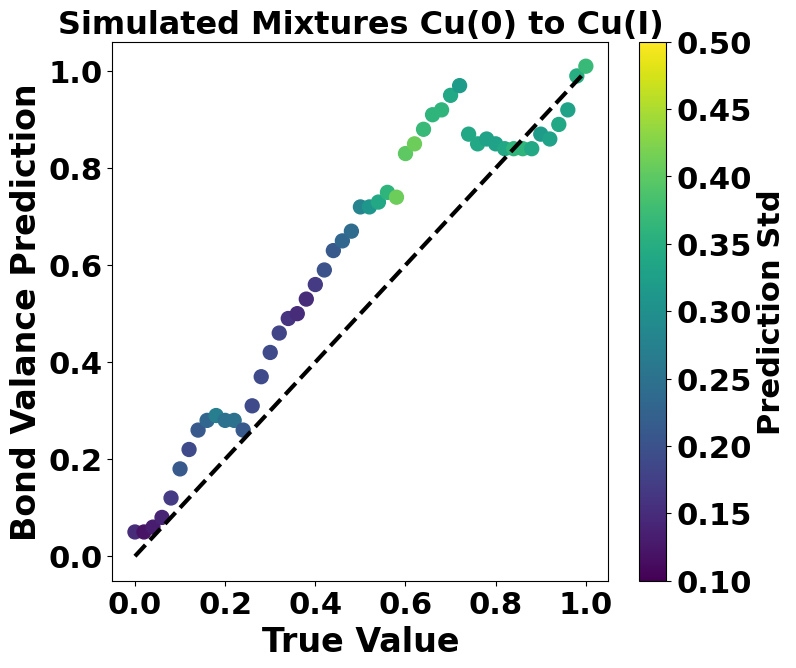

In [71]:
test_rf_obj.simulated_mixed_valent(catagory = '0-1', savefigure=False)

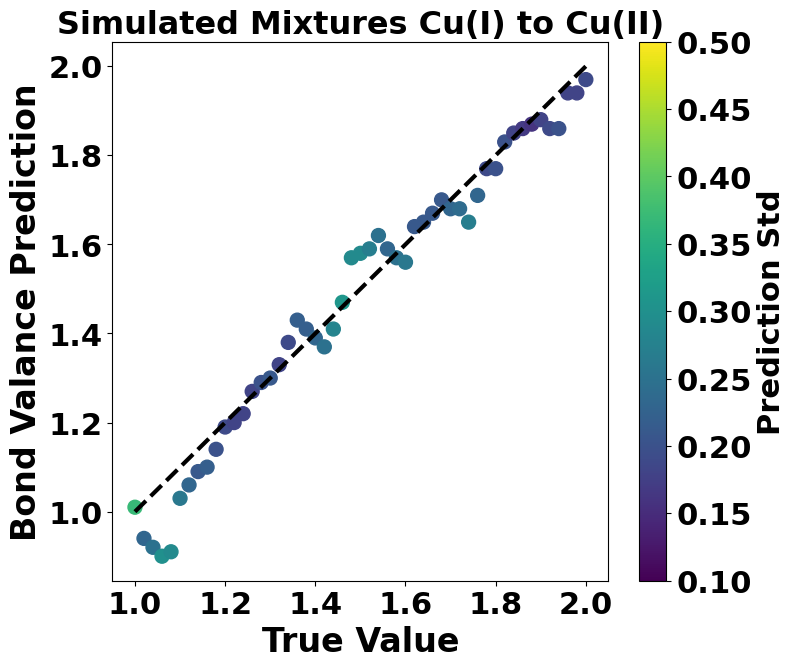

In [72]:
test_rf_obj.simulated_mixed_valent(catagory = '1-2', savefigure=False)

<font size="6"> Impact of Smoothing on Experimental EELS Spectra Predictions. Figure S10

In [73]:
smoothings = [[5,3], [21,3], [35,3], [51,3], [75,3], [101,3], [125,3], [151,3]]

In [74]:
test_rf_obj.predict_experiment_folder('C:/Users/smgls/Materials_database/Cu_deconvolved_spectra/', spectra_type = 'TEAM I', 
                                      shifts = [0], theory_column = 'TEAM_1_aligned_925_970', smoothings = smoothings, 
                                      show_hist=False, show_inputted_spectrum=False, savefigure=False)

╒═════════════════════════╤══════════════╤══════════════════╤════════════════════════╕
│   Smoothing Window (eV) │   Prediction │   Prediction STD │   True Oxidation State │
╞═════════════════════════╪══════════════╪══════════════════╪════════════════════════╡
│                    0.15 │         0.64 │             0.49 │                      0 │
├─────────────────────────┼──────────────┼──────────────────┼────────────────────────┤
│                    0.63 │         0.36 │             0.39 │                      0 │
├─────────────────────────┼──────────────┼──────────────────┼────────────────────────┤
│                    1.05 │         0.31 │             0.33 │                      0 │
├─────────────────────────┼──────────────┼──────────────────┼────────────────────────┤
│                    1.53 │         0.31 │             0.32 │                      0 │
├─────────────────────────┼──────────────┼──────────────────┼────────────────────────┤
│                    2.25 │         0.31 │ 

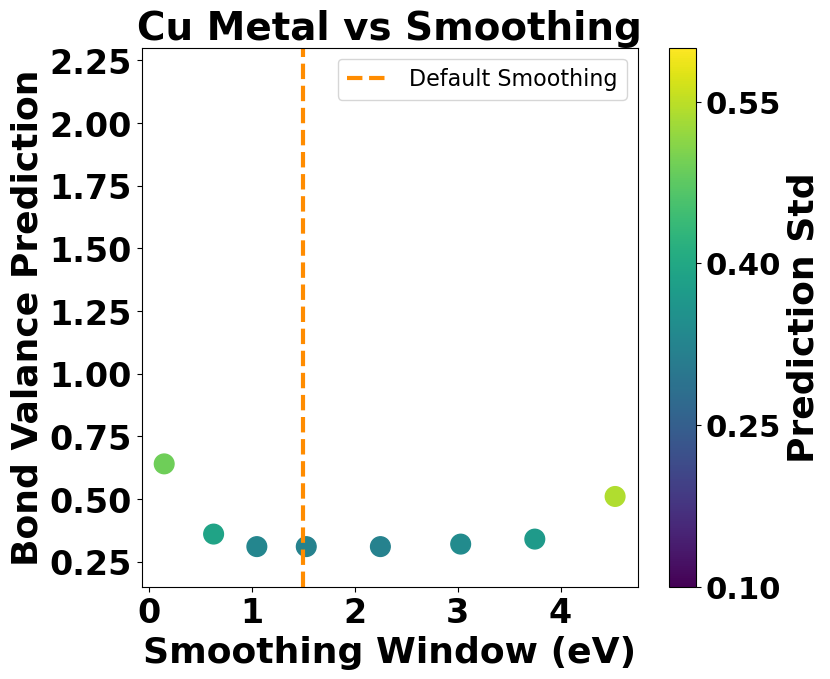

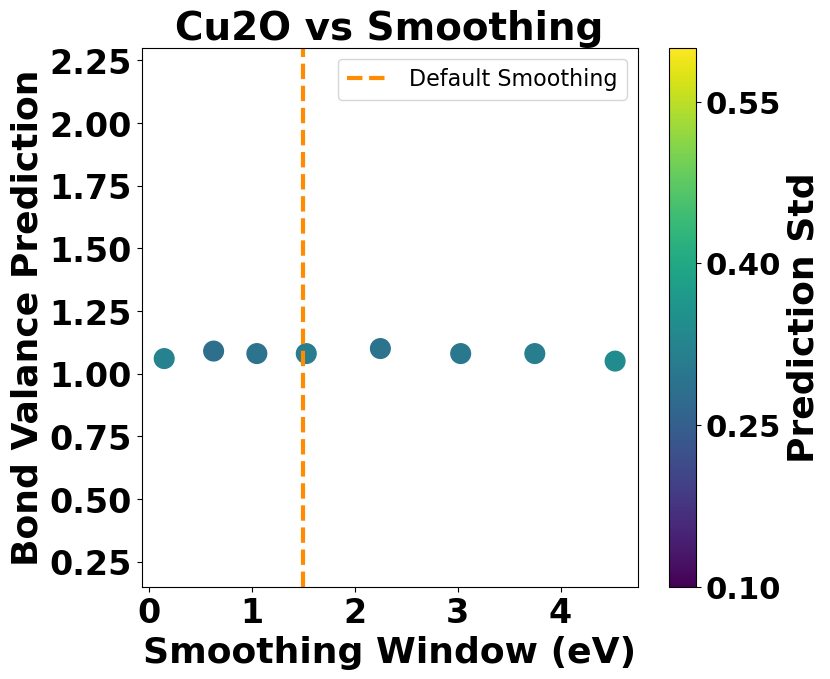

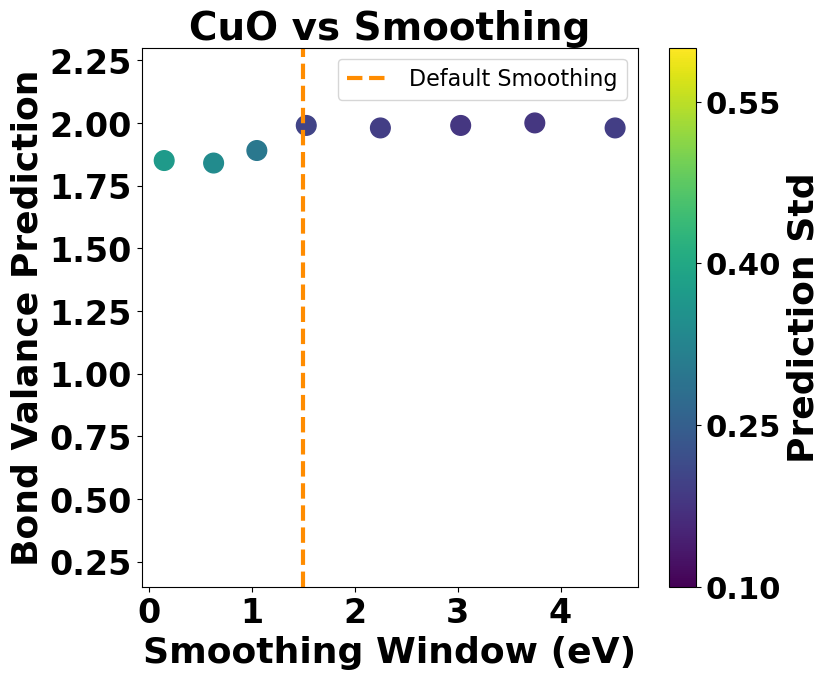

In [75]:
test_rf_obj.visualize_smoothings(show_table=True, savefigure=False)

In [43]:
pd.DataFrame(test_rf_obj.mixture_ids, columns = ['mp_id']).value_counts()

mp_id     
mp-1078469    6
mp-1101077    5
mp-984726     5
mp-30599      4
mp-1103929    4
             ..
mp-13589      1
mp-13400      1
mp-12984      1
mp-12860      1
mp-999135     1
Length: 541, dtype: int64

In [38]:
len(mixture_ids)

541

In [32]:
count = 0
for i in range(0, len(test_rf_obj.spectra_df)):
    mp_id = test_rf_obj.spectra_df.iloc[i]['mpid_string']
    if type(mp_id) == list:
        count += 1

In [33]:
count

5999

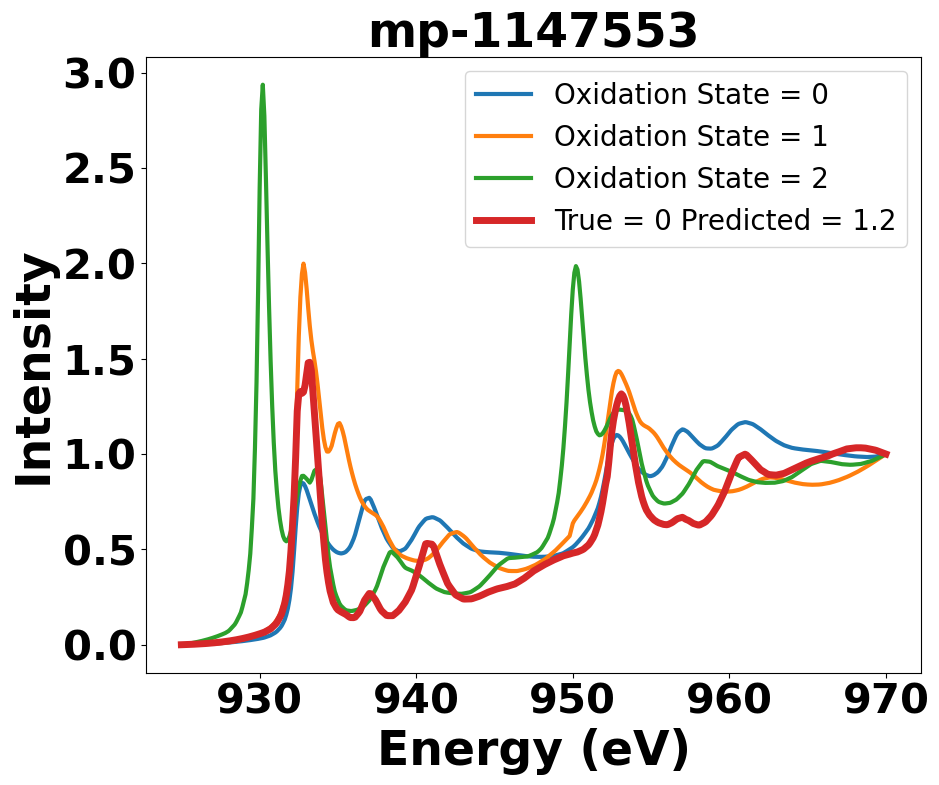

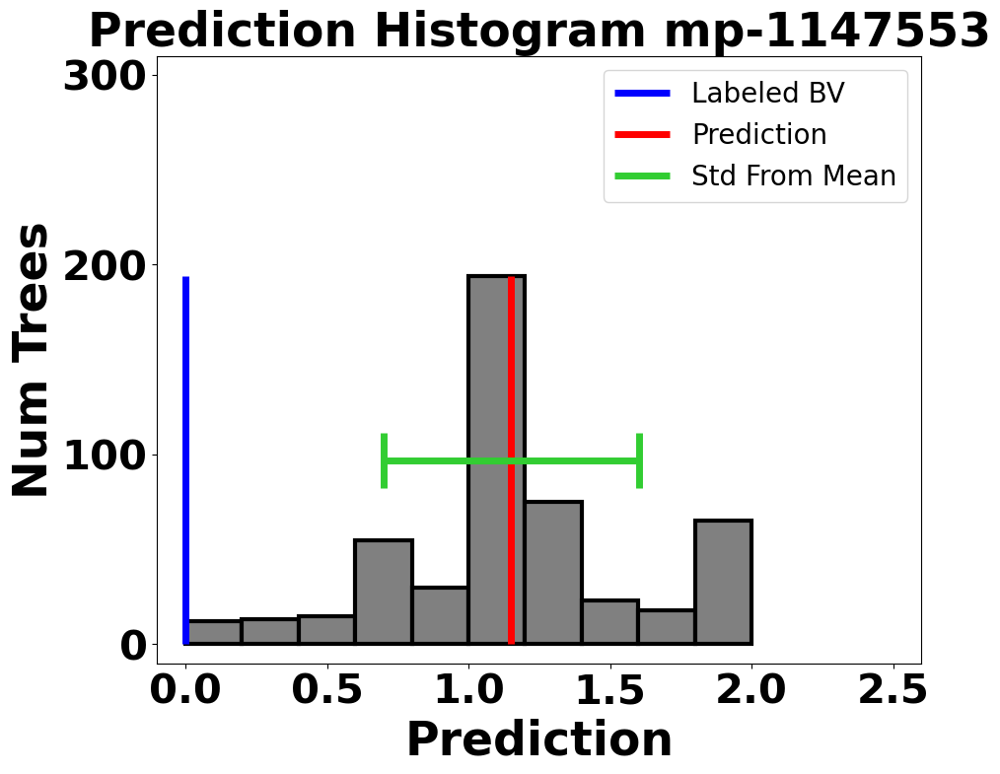

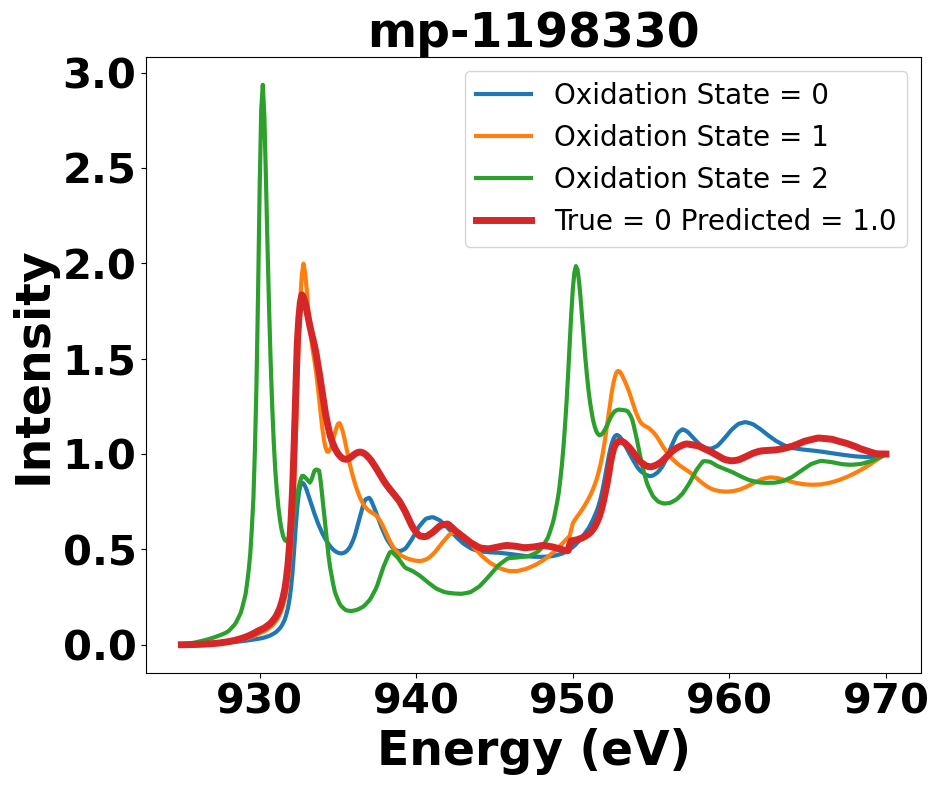

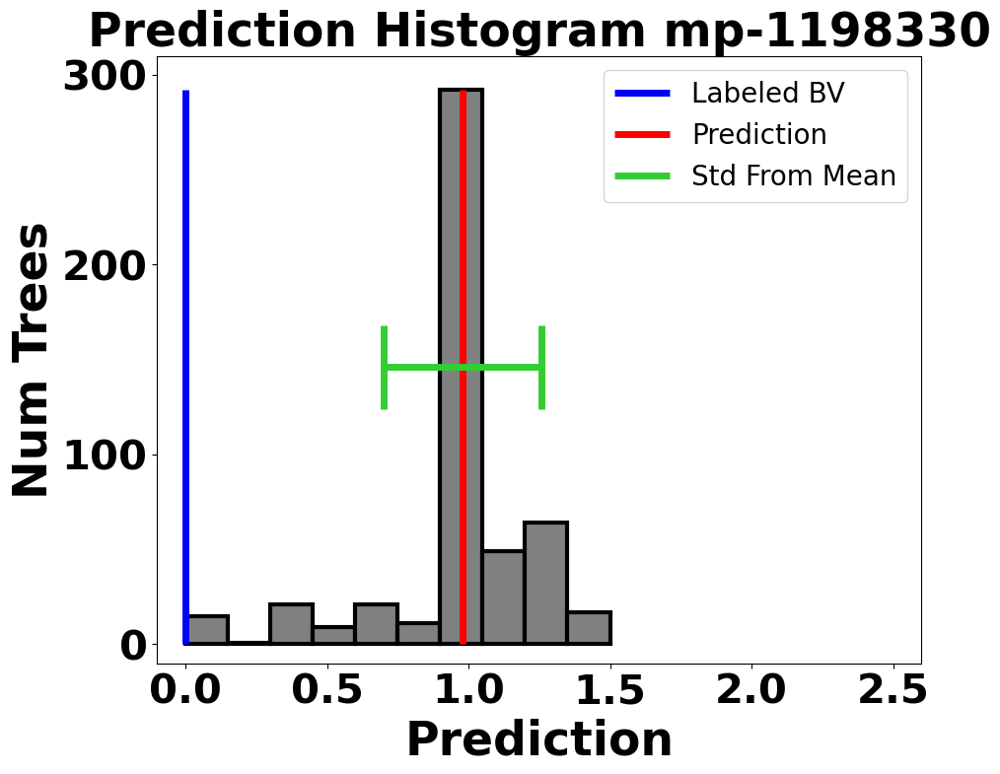

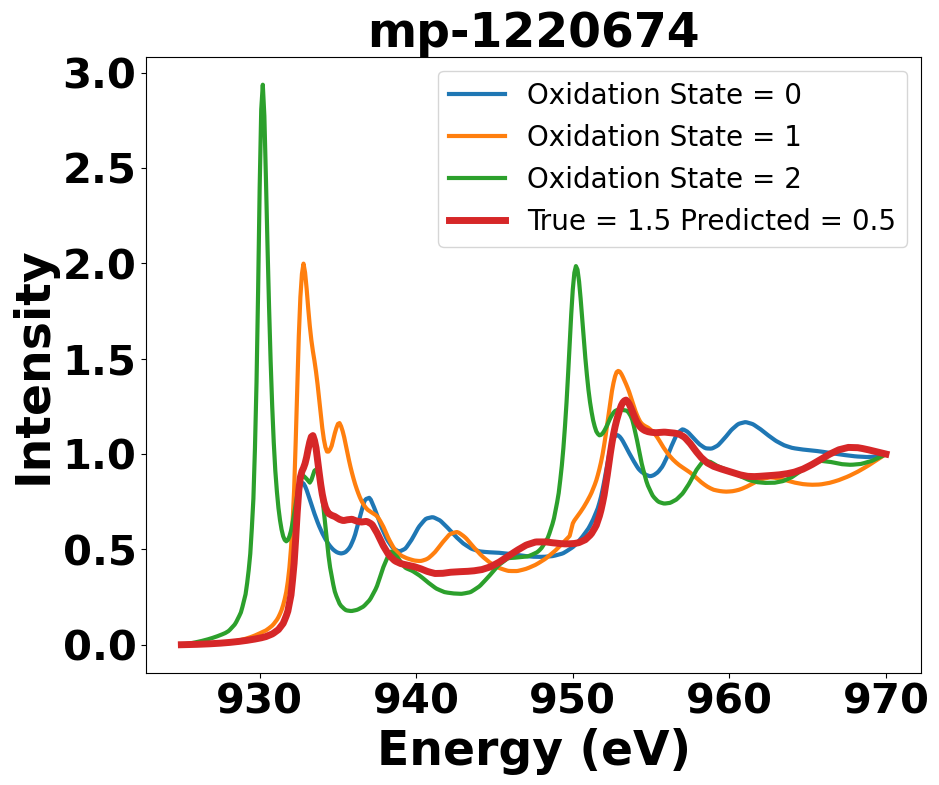

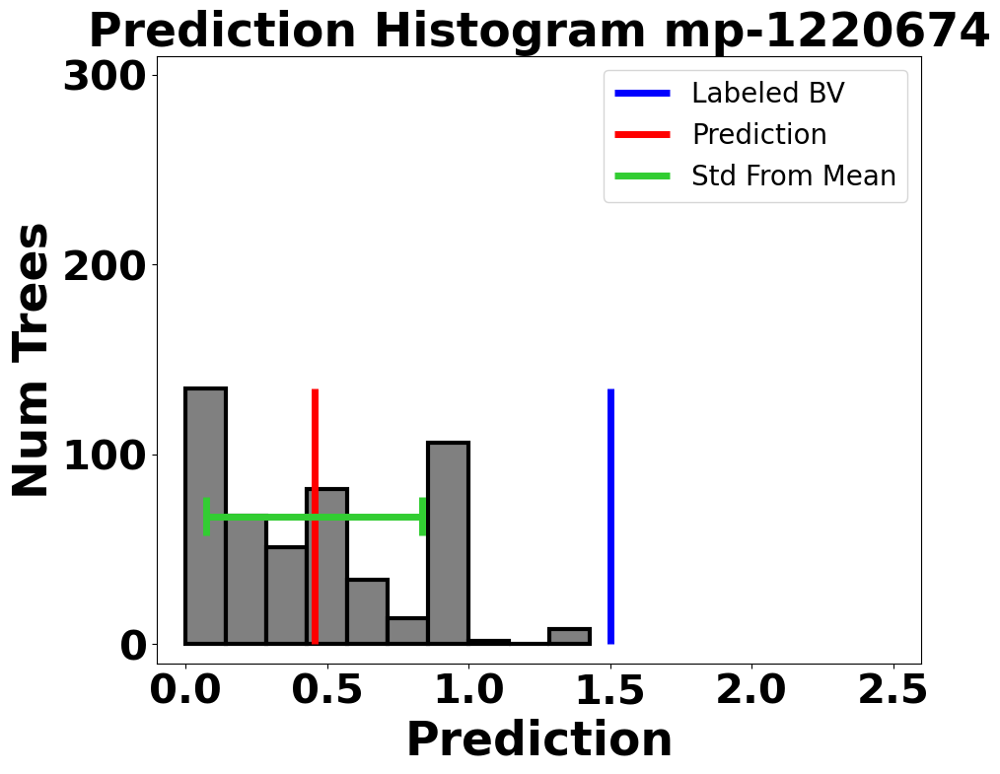

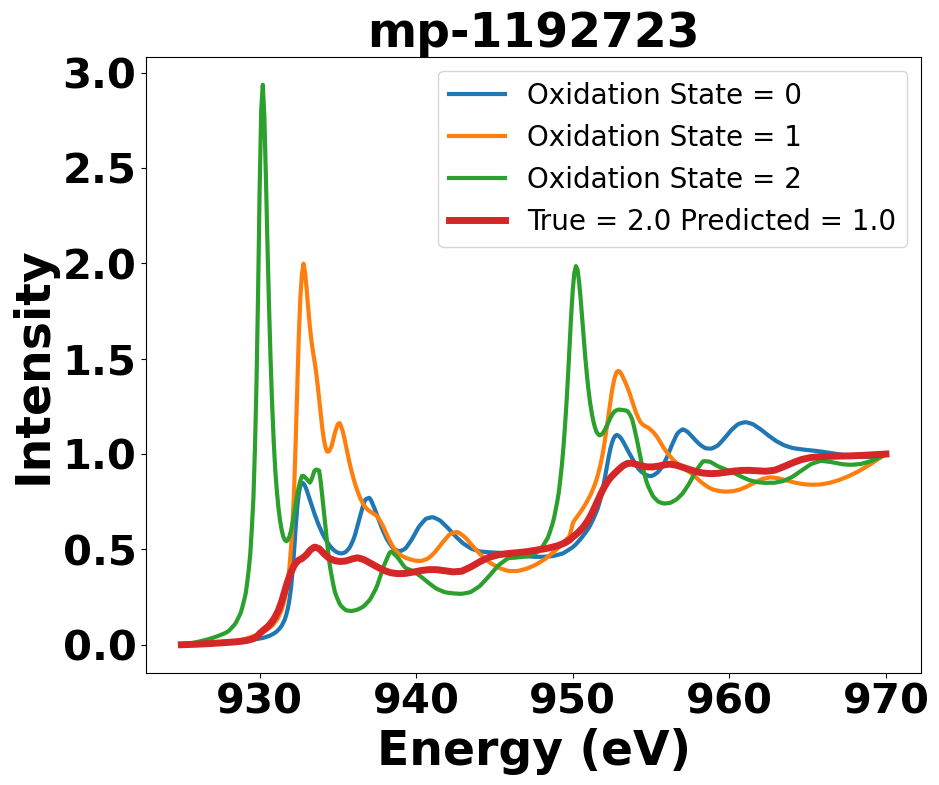

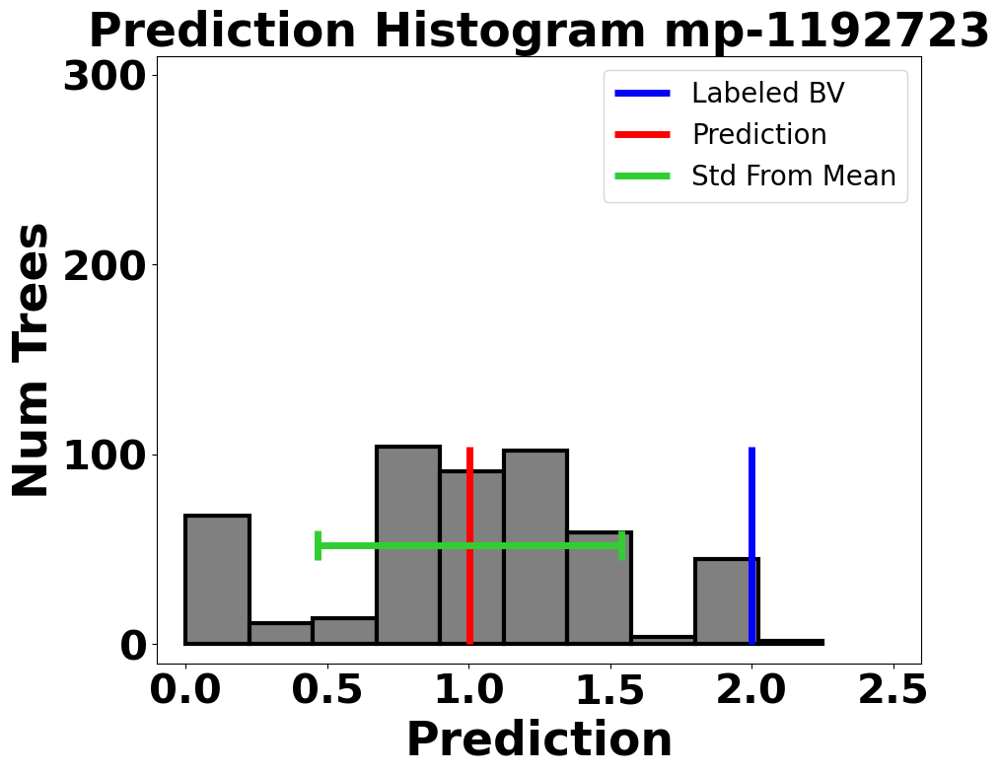

In [30]:
for entry in [1312, 1115, 1494, 1106]:
    visualize_predictions(test_rf_obj.rf_error_df, [entry])

In [8]:
mixture_spectra_true_vals = np.asarray(test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df['mpid_string'].isin(mixture_ids)]['BV Used For Alignment'])

In [9]:
mixture_spectra_new = []
for spec in mixture_spectra:
    mixture_spectra_new.append(np.asarray(spec))

NameError: name 'mixture_spectra' is not defined

In [10]:
mixture_df_slice.drop('level_0', axis = 1, inplace = True)

NameError: name 'mixture_df_slice' is not defined

In [16]:
mixture_df_slice = test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df['mpid_string'].isin(mixture_ids)]
error_df_mixtures = test_rf_obj.predict_set_of_spectra(mixture_df_slice)

Accuracy = 0.9751936864449045
RMSE = 0.1284148037774664


num spectra = 541
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


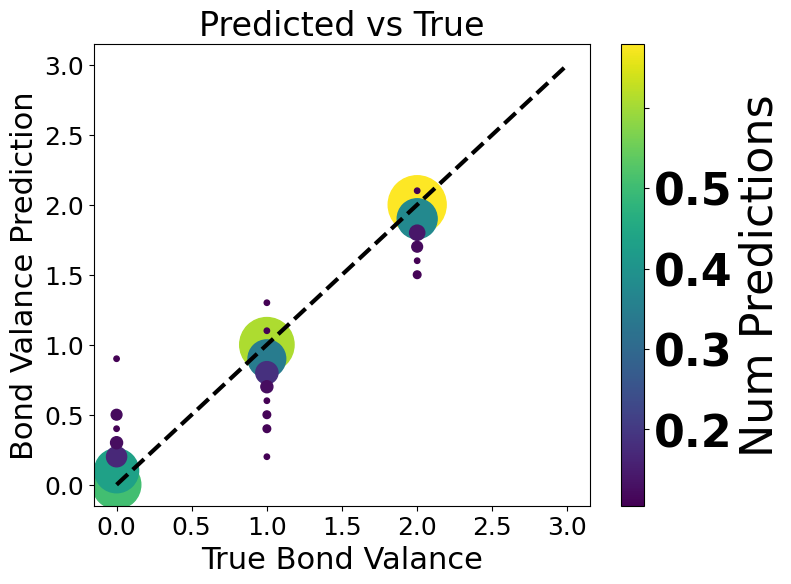

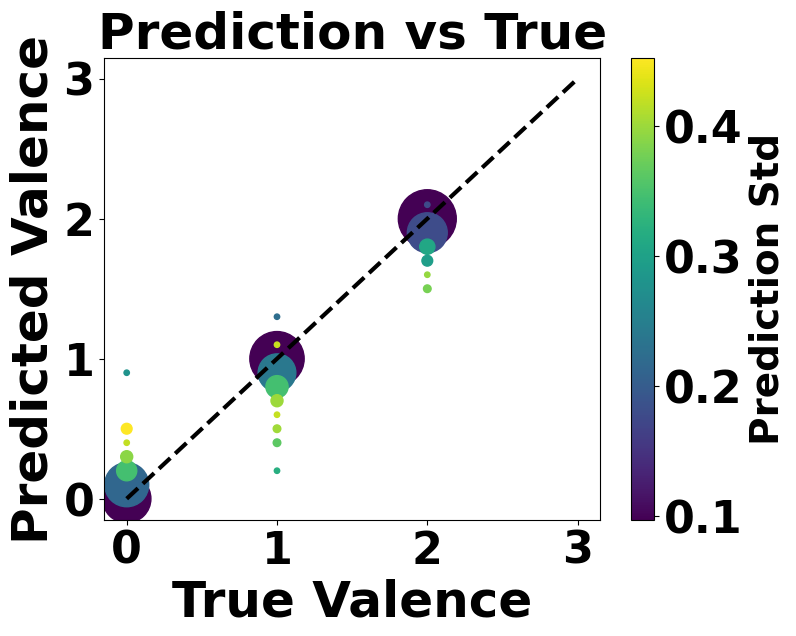

In [17]:
test_rf_obj.show_r2(error_df = error_df_mixtures)

RMSE 0.1284148037774664


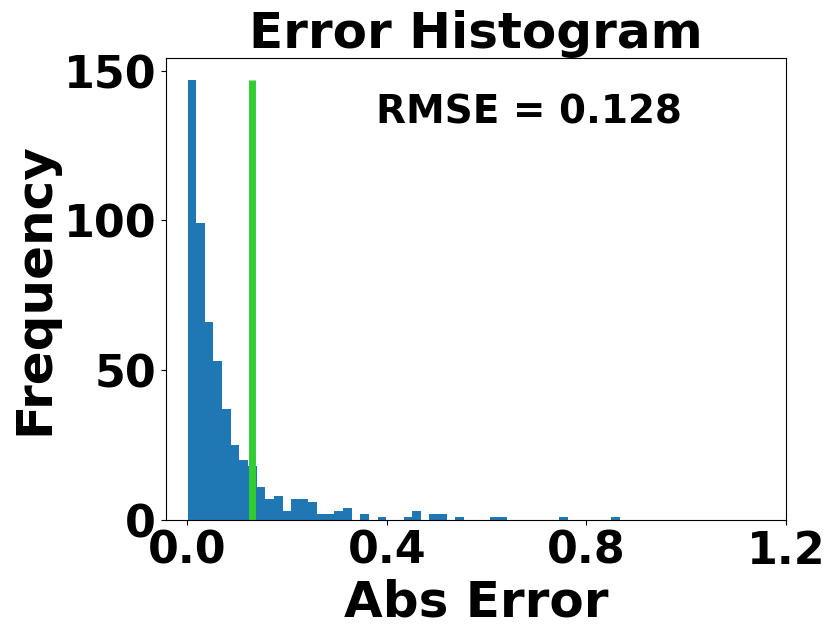

In [19]:
test_rf_obj.show_errors_histogram(error_df = error_df_mixtures, yticks = [0,50,100,150])

In [20]:
unstable_and_no_exp = []
stable_and_experimental = []
stable_and_no_exp = []
unstable_and_experimental = []

for i in range(0, len(test_rf_obj.rf_error_df)):
    stable_flag = None
    theoretical_flag = None
    
    row = test_rf_obj.rf_error_df.iloc[i]
    is_stable = row.is_stable
    
    if type(is_stable) == list:
        if True in is_stable:
            stable_flag = True
        else:
            stable_flag = False
            
    else:
        if is_stable == True:
            stable_flag = True
        else:
            stable_flag = False
            
    is_theoretical = row.is_theoretical
    
    if type(is_theoretical) == list:
        if True in is_theoretical:
            theoretical_flag = True
        else:
            theoretical_flag = False
            
    else:
        if is_theoretical == True:
            theoretical_flag = True
        else:
            theoretical_flag = False
            
    if theoretical_flag == True:
        if stable_flag == False:
            unstable_and_no_exp.append(i)
            
    if theoretical_flag == True:
        if stable_flag == True:
            stable_and_no_exp.append(i)

    if theoretical_flag == False:
        if stable_flag == True:
            stable_and_experimental.append(i)

    if theoretical_flag == False:
        if stable_flag == False:
            unstable_and_experimental.append(i)

,Labels Test,Labels Test Rounded,Predictions,Predictions Rounded,Errors,Errors Rounded,Predictions Std,Full Predictions,Materials Ids,Pretty Formula,Energies,Spectrum,XAS Spectrum,is_stable,is_theoretical
87,1.0,1.0,0.26764,0.3,0.73236,0.7,0.367702,"[0.0, 1.0, 0.59, 0.63, 0.0, 0.63, 0.0, 1.0, 0....",mp-1007924,CrCu2Si,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.559426960367104e-07, 1.7095461389...","[0.0, 0.00018556960878064095, 0.00038506439801...",False,True
203,0.95,0.9,1.5208,1.5,0.5708,0.6,0.255243,"[1.39, 1.54, 1.58, 1.39, 1.39, 1.57, 1.51, 1.5...","[mp-17801, mp-545369, mp-554973]","[Hf2CuGe4, CuBiTeO, TlCuF3]","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.2787717976165673e-06, 7.026869973...","[0.0, 0.0008724494093795337, 0.001818658624423...","[False, False, False]","[False, False, True]"
288,1.04,1.0,1.16506,1.2,0.12506,0.1,0.206394,"[0.92, 1.04, 1.47, 1.15, 1.15, 1.43, 1.49, 0.9...","[mp-1105864, mp-557274, mp-19902]","[Cu11PdN4, Cu4Si2NiS7, UCuAs2]","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 7.529857793314498e-07, 2.3133857424...","[0.0, 0.00025219238052707284, 0.00052276951558...","[False, False, False]","[True, False, False]"
333,2.25,2.2,1.71078,1.7,0.53922,0.5,0.353175,"[2.0, 1.39, 2.0, 1.39, 2.0, 2.0, 2.0, 2.0, 1.8...",mp-6789,Ba2Y(CuO2)4,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 4.627270425984617e-06, 1.4197438543...","[0.0, 0.0015832843642605452, 0.003274564948370...",False,True
377,1.0,1.0,0.82096,0.8,0.17904,0.2,0.385313,"[0.92, 1.5, 0.37, 1.01, 1.0, 0.0, 0.49, 1.05, ...",mp-1078576,Cu3N,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.1257872383814232e-07, 6.626683786...","[0.0, 6.132109145479192e-05, 0.000129834201600...",False,True
434,0.91,0.9,1.00806,1.0,0.09806,0.1,0.127064,"[1.25, 1.0, 1.0, 1.0, 1.25, 1.0, 1.0, 1.0, 1.0...","[mp-17801, mp-545369, mp-554973]","[Hf2CuGe4, CuBiTeO, TlCuF3]","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 4.3229065148480745e-07, 1.323471407...","[0.0, 0.00011960050167684847, 0.00024654897416...","[False, False, False]","[False, False, True]"
501,0,0,0.86644,0.9,0.86644,0.9,0.279518,"[1.0, 0.0, 0.84, 1.0, 1.0, 0.59, 1.2, 0.44, 1....",mp-1105864,Cu11PdN4,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.9627438133351647e-07, 9.244071284...","[0.0, 0.00010885770697124732, 0.00023078975042...",False,True
713,2.0,2.0,1.95784,2.0,0.04216,0.0,0.126364,"[2.0, 2.0, 2.0, 2.0, 2.0, 1.93, 2.0, 2.0, 2.0,...",mp-6312,Sr2CuCO5,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.1654978517264216e-06, 6.638519998...","[0.0, 0.0006335015782562176, 0.001308552020524...",False,True
748,1.11,1.1,0.9109,0.9,0.1991,0.2,0.469379,"[1.14, 0.78, 2.0, 0.71, 0.24, 1.12, 0.75, 0.4,...",mp-1229080,Ce5Cu19P12,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 1.0941822403817328e-06, 3.342872962...","[0.0, 0.0003331472512031403, 0.000684662120351...",False,True
810,1.0,1.0,1.07594,1.1,0.07594,0.1,0.259717,"[1.49, 0.58, 0.86, 1.26, 0.83, 1.18, 0.58, 0.8...","[mp-1095504, mp-1008922, mp-557258]","[HfCuGe, CuN, Tl4Cu4(P2O7)3]","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 7.97865798155994e-07, 2.45901118606...","[0.0, 0.00024335603852699772, 0.00050667047513...","[False, False, False]","[False, True, False]"


Accuracy = 0.6706002511986581
RMSE = 0.32772914479549586
num spectra = 31
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


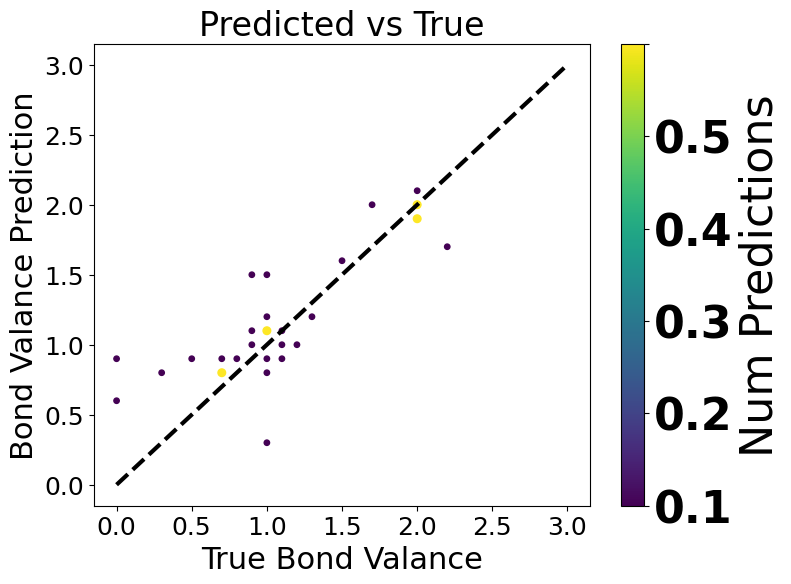

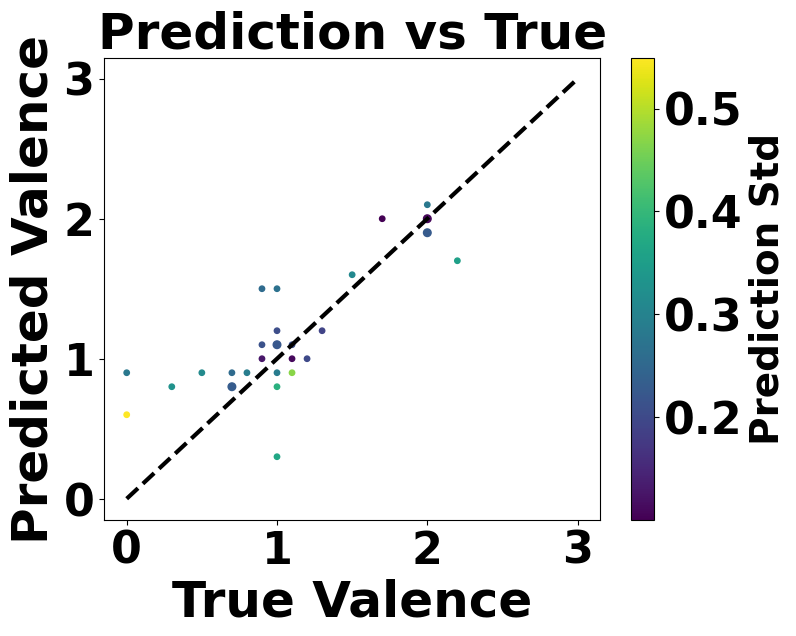

In [24]:
error_df_weird_ones = test_rf_obj.predict_set_of_spectra(test_rf_obj.rf_error_df.iloc[unstable_and_no_exp], using_error_df=True)
test_rf_obj.show_r2(error_df = error_df_weird_ones)

Accuracy = 0.8732775469793854
RMSE = 0.2056173600168675
num spectra = 784
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


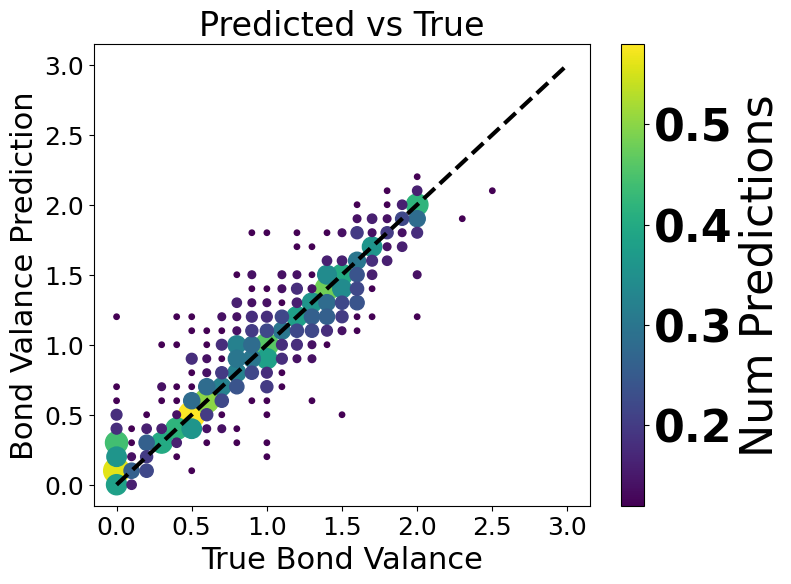

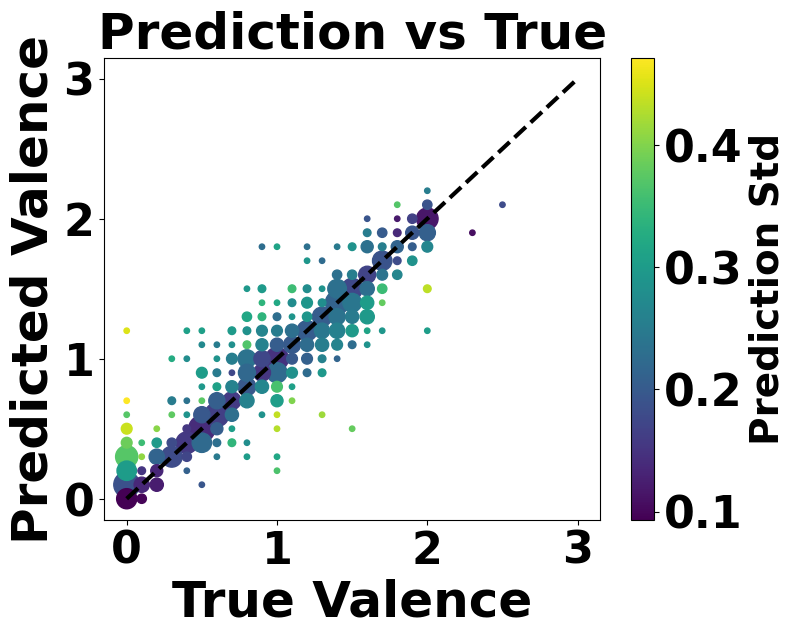

In [25]:
df_stable_and_no_exp = test_rf_obj.predict_set_of_spectra(test_rf_obj.rf_error_df.iloc[stable_and_no_exp], using_error_df=True)
test_rf_obj.show_r2(error_df = df_stable_and_no_exp)

Accuracy = 0.8856937664157329
RMSE = 0.1973687760427355
num spectra = 1014
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


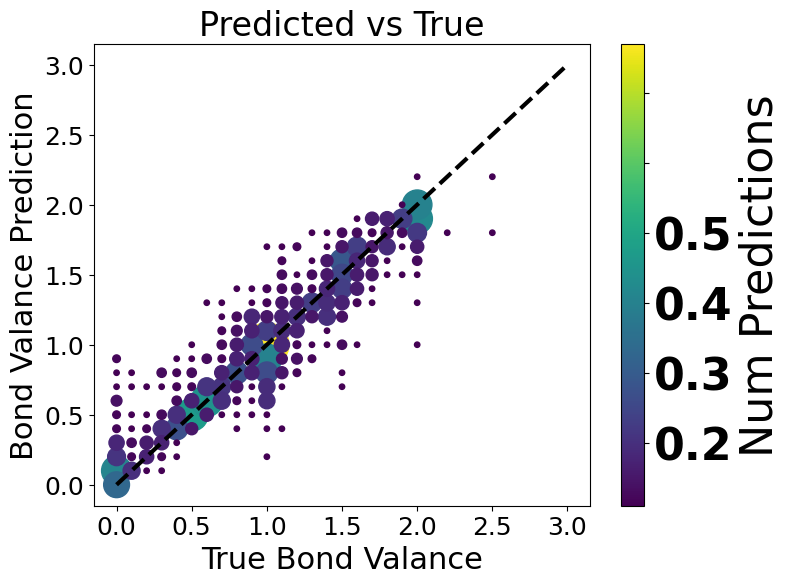

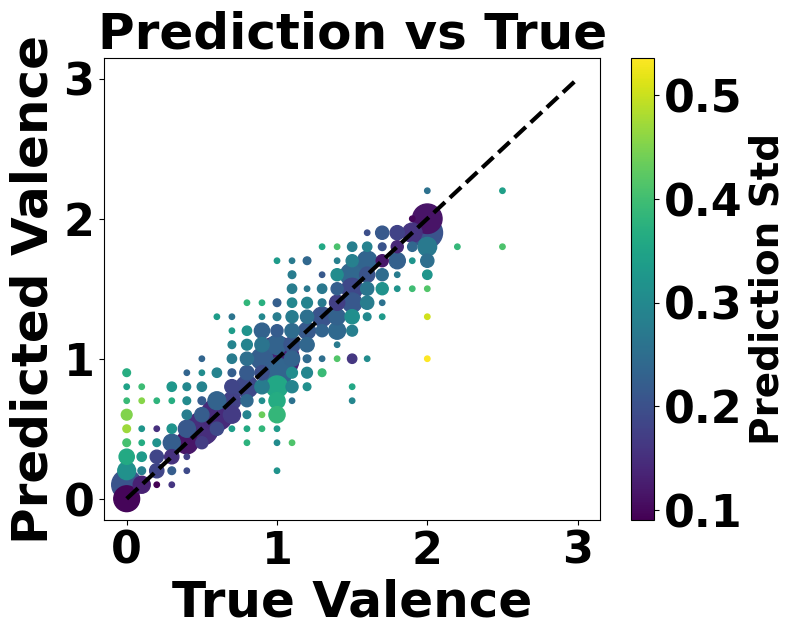

In [26]:
df_stable_and_experimental = test_rf_obj.predict_set_of_spectra(test_rf_obj.rf_error_df.iloc[stable_and_experimental], using_error_df=True)
test_rf_obj.show_r2(error_df = df_stable_and_experimental)

Accuracy = 0.9041033087079648
RMSE = 0.22296802690608114
num spectra = 527
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


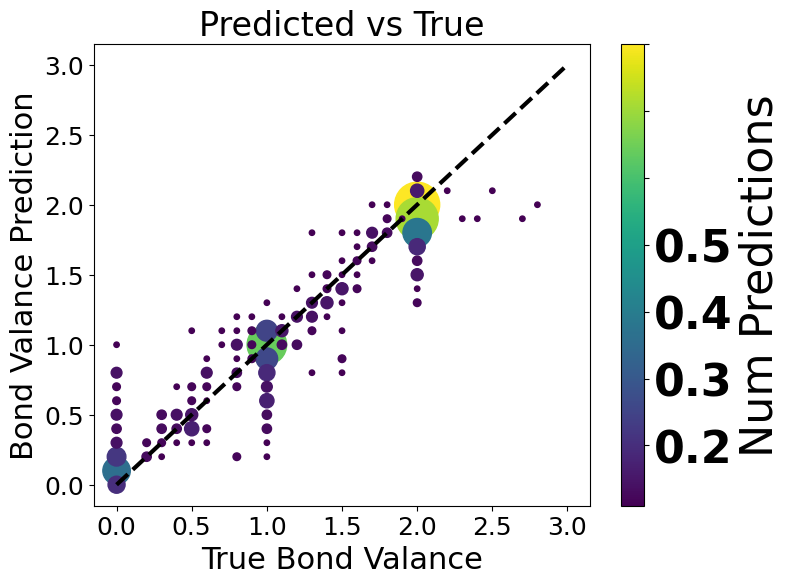

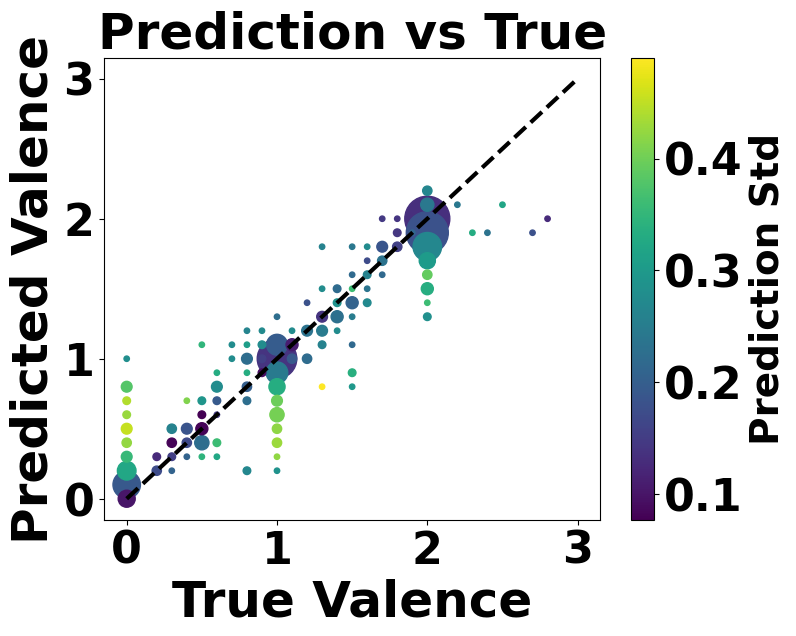

In [27]:
df_unstable_and_experimental = test_rf_obj.predict_set_of_spectra(test_rf_obj.rf_error_df.iloc[unstable_and_experimental], using_error_df=True)
test_rf_obj.show_r2(error_df = df_unstable_and_experimental)

Accuracy = 0.7054199405604863
RMSE = 0.3658442151039158
num spectra = 16
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


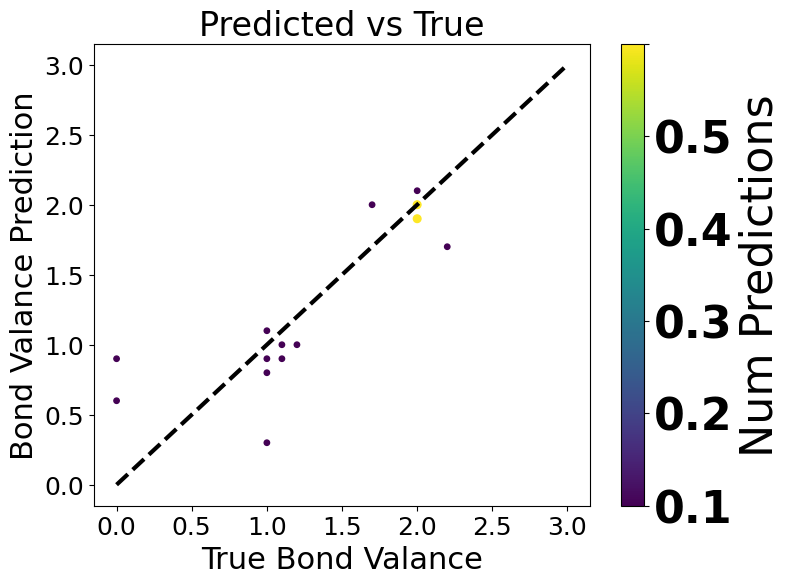

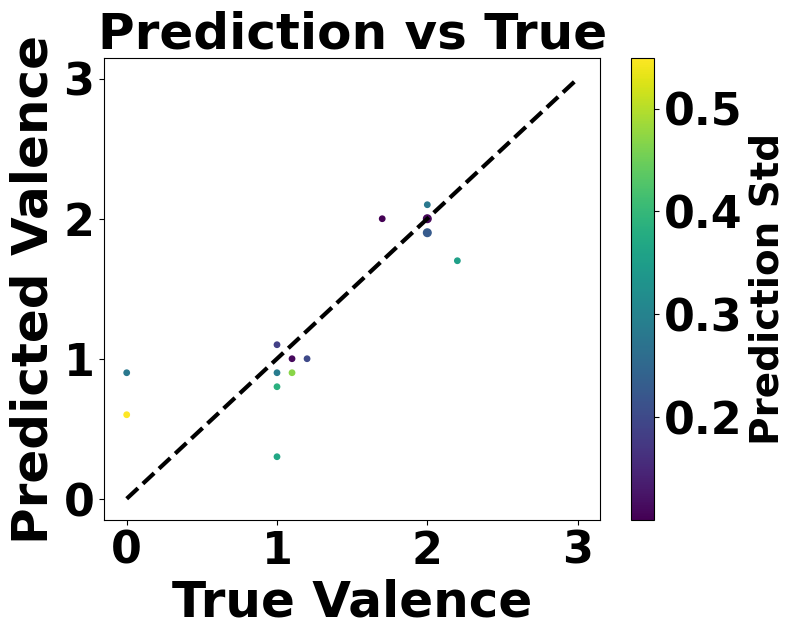

In [28]:
unstable_slice = test_rf_obj.rf_error_df.loc[test_rf_obj.rf_error_df['is_stable'] == False]
unstable_and_no_exp = unstable_slice.loc[unstable_slice['is_theoretical'] == True] 
error_df_weird_ones = test_rf_obj.predict_set_of_spectra(unstable_and_no_exp, using_error_df=True)
test_rf_obj.show_r2(error_df = error_df_weird_ones)

Accuracy = 0.8981972749462135
RMSE = 0.24164527034951813
num spectra = 384
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


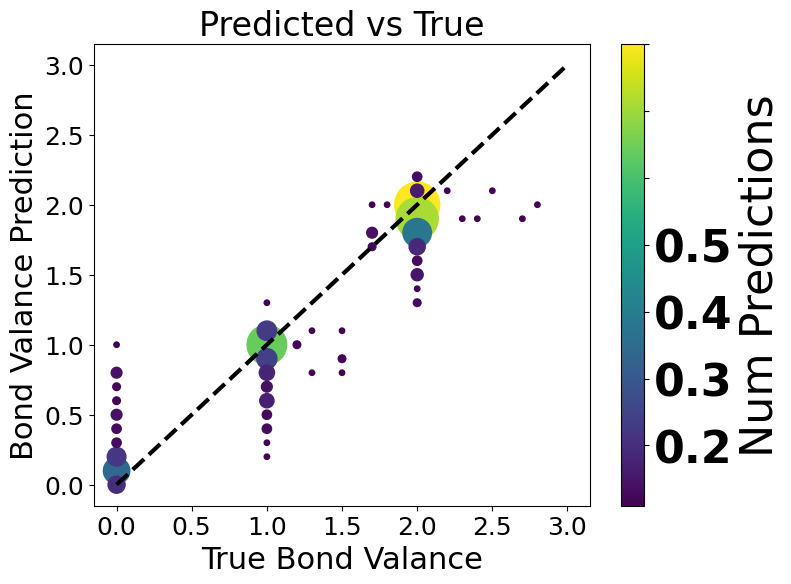

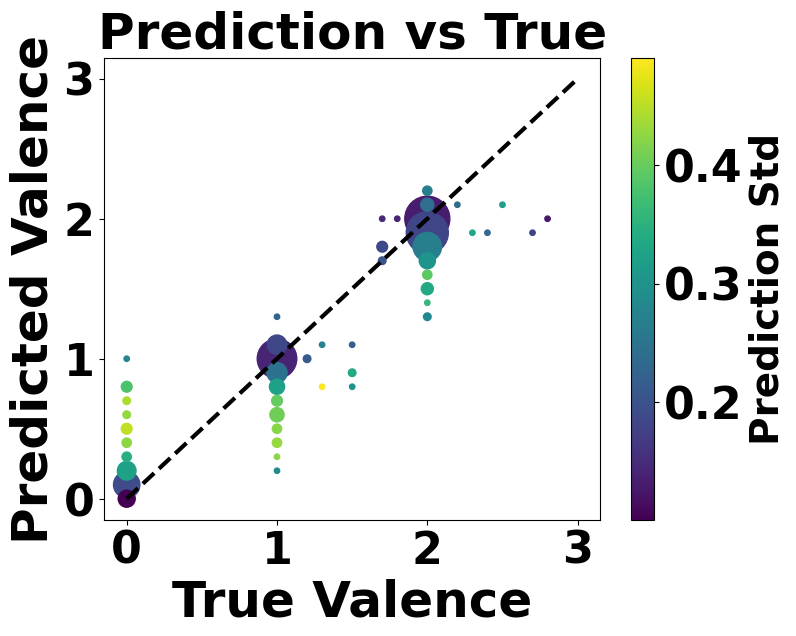

In [29]:
unstable_slice = test_rf_obj.rf_error_df.loc[test_rf_obj.rf_error_df['is_stable'] == False]
unstable_and_exp = unstable_slice.loc[unstable_slice['is_theoretical'] == False] 
error_df_unstable_and_exp = test_rf_obj.predict_set_of_spectra(unstable_and_exp, using_error_df=True)
test_rf_obj.show_r2(error_df = error_df_unstable_and_exp)

Accuracy = 0.8985139743122595
RMSE = 0.2432671141861235
num spectra = 288
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


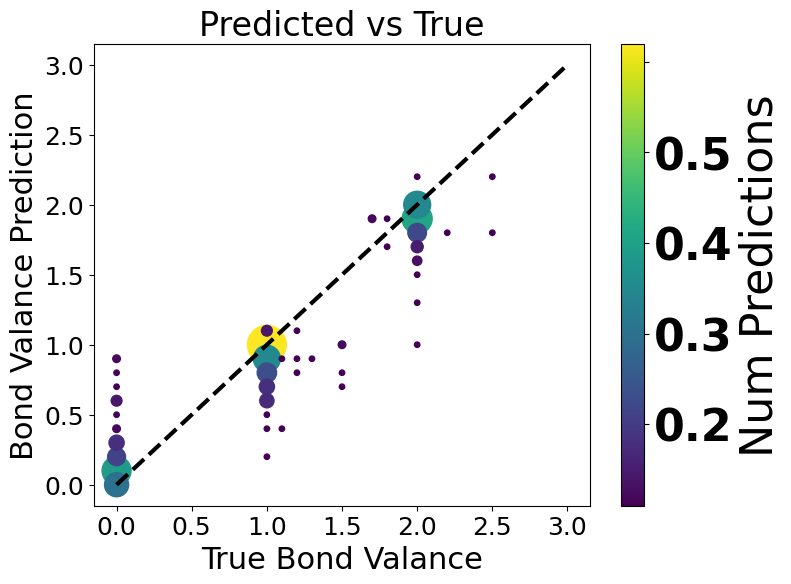

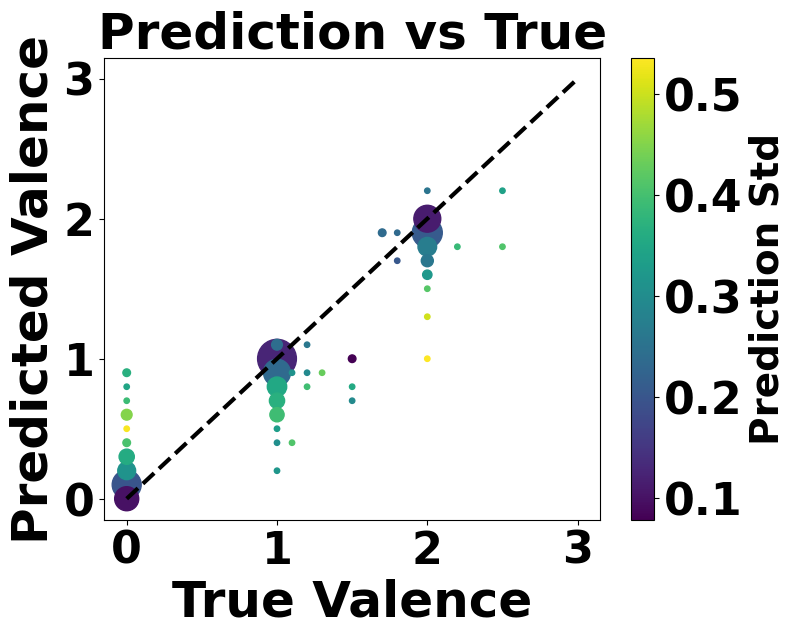

In [33]:
stable_slice = test_rf_obj.rf_error_df.loc[test_rf_obj.rf_error_df['is_stable'] == True]
stable_and_exp = stable_slice.loc[stable_slice['is_theoretical'] == False] 
error_df_stable_and_exp = test_rf_obj.predict_set_of_spectra(stable_and_exp, using_error_df=True)
test_rf_obj.show_r2(error_df = error_df_stable_and_exp)

Accuracy = 0.8708421232966361
RMSE = 0.30355425727239727
num spectra = 122
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


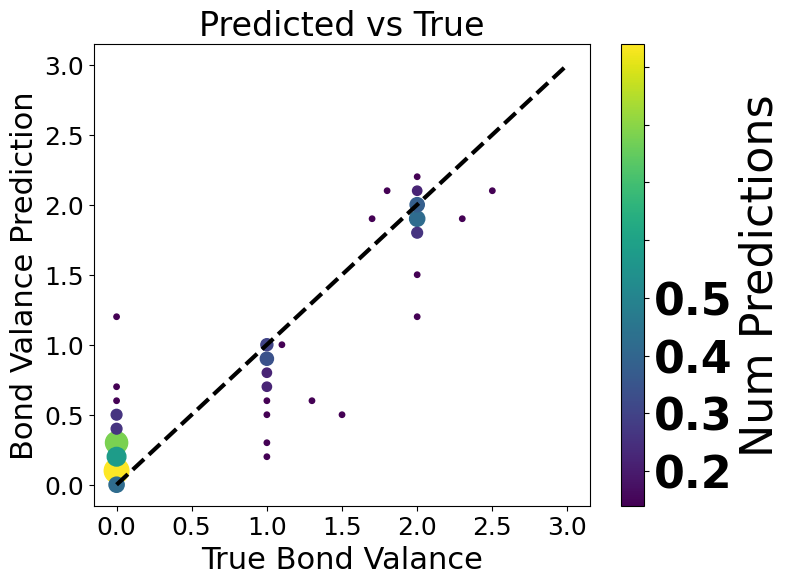

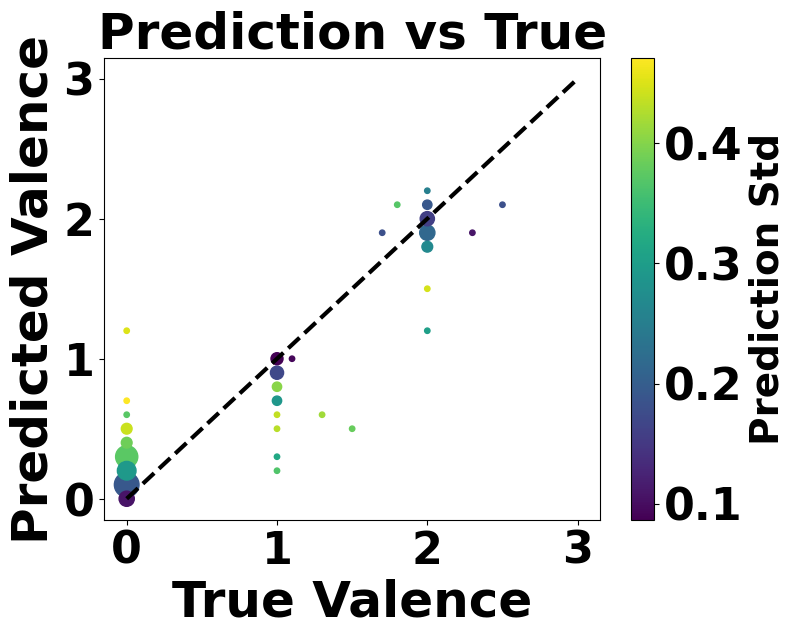

In [34]:
stable_slice = test_rf_obj.rf_error_df.loc[test_rf_obj.rf_error_df['is_stable'] == True]
stable_and_not_exp = stable_slice.loc[stable_slice['is_theoretical'] == True] 
error_df_stable_and_not_exp = test_rf_obj.predict_set_of_spectra(stable_and_not_exp, using_error_df=True)
test_rf_obj.show_r2(error_df = error_df_stable_and_not_exp)

num spectra = 2356
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


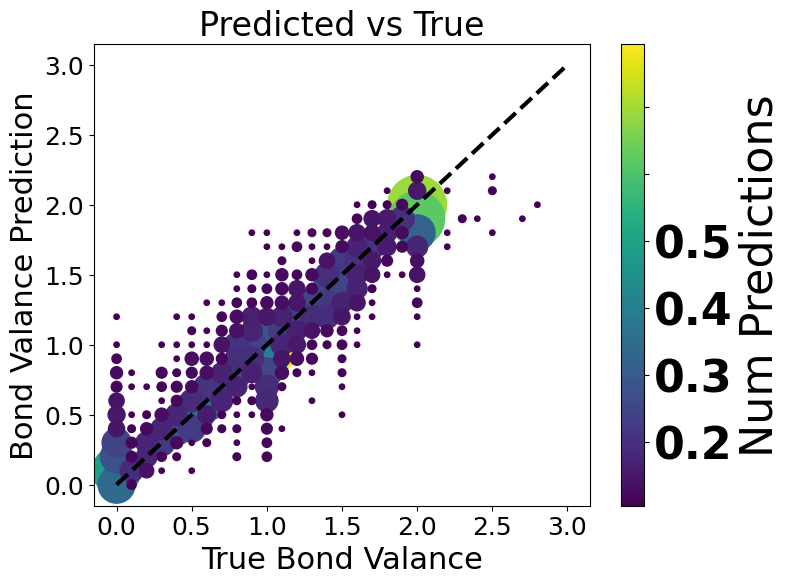

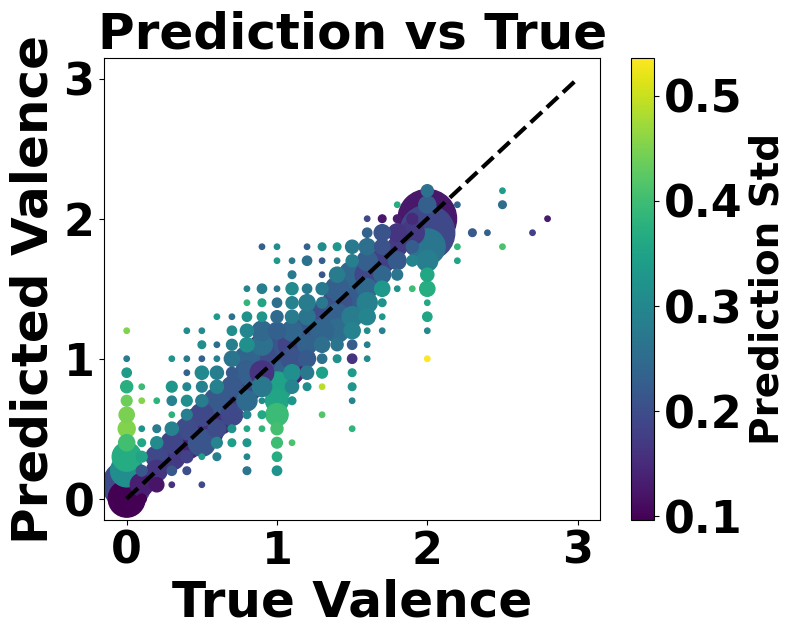

In [81]:
# unstable_and_but_exp = unstable_slice.loc[unstable_slice['is_theoretical'] == False] 
# error_df_unstable_and_but_exp = test_rf_obj.predict_set_of_spectra(unstable_and_but_exp)
test_rf_obj.show_r2(error_df = test_rf_obj.rf_error_df)

In [41]:
with MPRester("CEvsr9tiYxi6MaxfRnSU7V9FCaIAcAZh") as mpr:
    prop_labeling_exp = []
    prop_labeling_stable = []
    for i in range(0, len(test_rf_obj.spectra_df)):
    # for i in range(4000,4001):
        print(mat_id)
        row = test_rf_obj.spectra_df.iloc[i]
        mat_id = row.mpid_string
        if type(mat_id) == list:
            prop_list_exp = []
            prop_list_stable = []
            for mat in mat_id:
                doc = mpr.summary.search(material_ids=[mat], fields=["material_id", 'theoretical', 'is_stable'])
                prop_list_exp.append(doc[0].theoretical)
                prop_list_stable.append(doc[0].is_stable)
            prop_labeling_exp.append(prop_list_exp)
            prop_labeling_stable.append(prop_list_stable)       

        else:
            doc = mpr.summary.search(material_ids=[mat_id], fields=["material_id", 'theoretical', 'is_stable'])
            prop_labeling_exp.append(doc[0].theoretical)
            prop_labeling_stable.append(doc[0].is_stable)

    

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10092


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018685


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018723


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018724


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018741


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018798


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018900


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1019275


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10335


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1034


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10428


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1067210


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1068


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1069723


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1071618


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1071623


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1071839


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1071877


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072011


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072398


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072653


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072756


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072823


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072824


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072944


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077001


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077023


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077108


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077175


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077262


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077341


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077348


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077372


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077377


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077463


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077744


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078387


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078420


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078469


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078587


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078672


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078706


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078909


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079017


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079070


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079193


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079204


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079351


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079383


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079457


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079468


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079602


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079782


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079797


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080022


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080057


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080074


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080173


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080650


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080696


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080708


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080722


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080743


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1084809


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1084813


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1087471


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10886


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1091416


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1092251


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095027


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095106


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095168


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095504


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095537


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095679


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10966


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1101077


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1101786


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1101915


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102046


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102243


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102345


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102607


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103053


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103118


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103166


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103249


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103291


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103352


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103426


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103457


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103484


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103519


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103557


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103650


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103698


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103827


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103905


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103973


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104057


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104173


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104198


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104488


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104535


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104542


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104732


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104755


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104843


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104990


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105109


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105161


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105163


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105220


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105229


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105256


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105298


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105463


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105650


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105845


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11638


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11760


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11771


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1178771


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11791


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1180676


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181578


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181628


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181656


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181705


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181826


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1182273


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1182304


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1182677


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1182885


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11833


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11882


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188223


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188402


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188558


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188561


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188600


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188802


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188871


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189056


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189352


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189362


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189416


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189555


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189666


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189755


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190022


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190137


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190173


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190393


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190440


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190474


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190573


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190630


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190666


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190783


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190785


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190990


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191076


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191086


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191092


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191148


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191238


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191323


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191350


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191383


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191497


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191505


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191650


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191679


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191912


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191913


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192124


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192205


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192264


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192275


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192282


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192355


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192472


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192531


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192555


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192625


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192713


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192779


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192806


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192807


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192830


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192934


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192989


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193079


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193217


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193249


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193268


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193439


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193512


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193540


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193551


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193617


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193632


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193701


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193718


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193752


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193941


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194041


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194267


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194283


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194436


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194694


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194708


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194779


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194948


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194983


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195036


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195153


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195165


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195300


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195498


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195739


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195928


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196031


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196039


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196135


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196166


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196185


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196187


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196314


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196322


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196376


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196587


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196599


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196682


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196726


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197183


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197302


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197502


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197546


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197678


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197738


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197753


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197779


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197914


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197943


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198006


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198047


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198264


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198265


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198405


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198524


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198701


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198809


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198838


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198851


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198901


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199050


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199099


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199182


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199298


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199313


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199396


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199484


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199734


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199822


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199882


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199970


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199983


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200069


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200133


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200177


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200279


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200315


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200529


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200663


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200668


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200769


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200772


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200812


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200865


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201135


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201149


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201234


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201317


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201389


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201390


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201409


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201607


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201655


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201664


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201761


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201766


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201854


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202064


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202099


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202152


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202250


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202347


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202466


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202524


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202570


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202588


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202646


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202851


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203110


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203192


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203611


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203696


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203708


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203872


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203931


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203941


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204058


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204064


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204374


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204438


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204474


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204573


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204584


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204591


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204931


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205239


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205250


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205359


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12087


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12118


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12145


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12161


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12185


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12268


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1232413


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1233


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1238498


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1239022


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1239037


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12457


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12546


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12586


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12777


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12794


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12801


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12854


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13045


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13089


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13138


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13287


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13480


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13486


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13589


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14089


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14735


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14824


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14862


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15252


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15335


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15336


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15481


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15895


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15900


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16056


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16115


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16179


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16320


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16366


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16435


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16494


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16496


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16565


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16775


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17119


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17145


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17194


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17262


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17268


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17336


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17388


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17598


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17687


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17691


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17699


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17738


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17801


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17878


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17916


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18124


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18126


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18279


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18444


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18490


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18540


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18576


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1861


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18637


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18713


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1945


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1966


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19735


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19834


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19946


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19968


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19983


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2002


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20083


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20087


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20140


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20203


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20212


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20307


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20324


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20370


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20437


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20476


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20491


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20977


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2103


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21141


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21148


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21360


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21376


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21388


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21458


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21475


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21500


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21560


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21568


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21617


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21684


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21708


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21827


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21861


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21865


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21868


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21964


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22037


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2210


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22196


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22215


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22221


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22237


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22271


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22297


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22301


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22305


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22392


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22407


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22414


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22550


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22601


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22673


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22680


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22685


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22719


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22761


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22810


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22863


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22914


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22917


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22941


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22960


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23095


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23133


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23212


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23227


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2323


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23508


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23733


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23795


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23857


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24038


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24093


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24103


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24164


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24197


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24228


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24559


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27124


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27249


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27548


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27550


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27589


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27719


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28317


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28491


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28656


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28743


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2882


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2918


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29225


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29450


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29476


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29507


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29643


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2977


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29823


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29828


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30449


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30450


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30451


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30471


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30504


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30578


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30582


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30583


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30589


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30590


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30593


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30594


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30597


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30599


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30603


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30696


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30698


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30699


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-31145


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-31510


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3179


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3255


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3421


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3648


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-36480


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3702


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3736


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4158


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4210


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4320


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4367


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4473


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4552


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4643


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4647


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4711


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4826


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-488


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504536


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504580


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504711


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504862


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504927


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504978


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505105


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505131


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505151


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505194


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505215


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505268


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505310


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505404


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505421


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505576


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505589


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505611


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505785


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505804


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505811


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510056


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510148


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510292


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510539


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510570


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510608


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510642


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510657


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5169


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5178


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-540665


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-540812


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-540858


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-540999


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541087


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541136


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541147


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541324


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541330


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541332


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541622


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541923


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541991


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542176


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542197


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542426


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5425


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542750


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542806


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542807


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542934


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542944


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-545369


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-546449


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-546790


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-551135


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-551219


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-552089


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554075


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554117


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554177


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554184


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554200


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554272


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554298


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554335


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554343


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554352


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554419


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554440


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554511


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554562


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5546


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554627


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554781


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554812


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554874


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555093


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555139


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555369


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555515


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555519


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555570


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555729


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555827


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555856


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555937


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555984


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556002


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556036


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556045


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556238


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556402


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556575


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556582


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556590


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556604


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556635


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556640


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556714


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556733


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556753


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556755


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556822


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556926


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557084


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557123


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557136


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557249


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557274


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557339


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557341


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557373


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557510


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557552


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557929


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557936


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557980


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558144


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558338


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558364


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558472


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558486


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558696


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559094


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559209


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559307


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559415


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560100


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560165


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560273


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560285


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560291


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560345


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560368


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560533


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560776


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560805


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561012


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561081


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561308


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-562090


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-565843


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-566937


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567201


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567366


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567840


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567932


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568224


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568315


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568354


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568495


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568497


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568524


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568532


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568598


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568816


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569292


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569339


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569526


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5696


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569687


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569691


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569715


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569834


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570393


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570702


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570765


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571034


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571054


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571074


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571268


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571386


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571468


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-572929


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-573024


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-573069


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-573877


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-574507


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-579718


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-580364


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581212


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581303


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581641


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581786


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-582681


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-583800


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5866


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5938


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-600172


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-600604


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6013


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-601952


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6036


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-604273


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-604996


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-605172


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-605196


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-607080


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6127


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-614489


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-614964


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-616166


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-616610


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-617247


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6181


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-618788


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-618991


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-620033


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-620325


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622026


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622108


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622110


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622570


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622576


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622636


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6252


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-628568


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6297


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-635456


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-635469


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-636198


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-636240


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-636256


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-636978


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-638086


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-639675


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-639719


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-639756


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640899


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640925


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-641710


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-642


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-642157


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-642804


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-642811


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-643052


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-643203


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-643378


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-643743


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-643934


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-645435


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-645504


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-646039


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-646125


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-646750


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-647606


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-649774


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6498


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-649944


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-650741


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-651682


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-651706


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6537


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-653925


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-654109


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-654900


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-655377


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669354


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669361


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-672285


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-672295


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-672345


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-677105


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-679991


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6802


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680211


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680639


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6829


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-683906


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-683950


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6885


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-690769


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-696200


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-697008


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-697994


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698276


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698313


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698361


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698396


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698413


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-699474


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-703398


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-703515


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-703531


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-704617


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-704645


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-704745


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-705439


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-705524


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-706287


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-706670


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707052


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707169


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707170


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707201


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707464


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707852


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707879


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-709325


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-712


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-720299


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-720337


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-720417


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-720876


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-721072


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-721604


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-721789


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-721943


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-722280


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-722867


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-723175


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-733590


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-752783


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-753954


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-756758


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-774723


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-774726


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-838


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-845


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-861595


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862687


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8800


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8806


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8927


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9248


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9660


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-998


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-999135


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1001780


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1005792


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1008511


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1017556


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018029


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018149


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018705


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018713


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018714


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018784


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018893


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1023132


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10244


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1024954


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1024957


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1024987


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1024991


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1024994


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025013


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025021


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025116


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025122


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025128


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025134


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025136


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025265


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025340


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025402


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025532


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10288


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10336


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1038


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10381


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10533


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10598


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1068891


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1069287


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1069357


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1069375


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1069443


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1069825


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1070573


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1070869


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1071051


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1071645


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1071835


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1071904


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072033


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072041


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072264


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10746


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10749


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1076933


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077154


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077165


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077167


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077209


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077290


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077293


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077351


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077428


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077453


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077498


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077518


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077741


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077750


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077752


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077802


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077929


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078005


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078292


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078460


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078489


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078543


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078544


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078592


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078630


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078692


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078729


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078738


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078853


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078857


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078916


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078920


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078982


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079261


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079357


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079361


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079498


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079508


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079779


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079868


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079890


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080085


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080116


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080149


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080384


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080443


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080560


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080588


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080594


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080612


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080624


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080814


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10834


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1087483


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1087547


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10876


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10877


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10887


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10950


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095111


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10952


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095201


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095273


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095403


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095575


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095591


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095660


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1096867


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1096897


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10973


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10991


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10992


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1100809


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1101476


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1101850


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1101867


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11019


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102015


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102042


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102297


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102382


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102518


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102536


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11029


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103123


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103415


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103511


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103929


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104000


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104253


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104269


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104741


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104798


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104848


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104923


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104954


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104960


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105138


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105186


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105187


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105893


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105955


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1106051


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1106301


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1106310


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11086


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11114


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11115


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1113297


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1113598


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1120730


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11293


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11359


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11360


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11361


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11363


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11366


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1140


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1147551


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1147553


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1147650


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1147653


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1147679


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1147709


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1147715


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11604


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11700


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11701


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1172870


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1177695


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11790


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11792


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11793


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1179530


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1179864


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1180119


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1183114


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1183120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1183810


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1183995


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1184092


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1184119


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1184202


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1184422


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1184522


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1184609


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1184891


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11852


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1185442


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1185452


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1185457


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1185508


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1185509


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1186452


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1186453


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1186462


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1186667


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1187436


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1187455


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1187459


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1187538


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1187606


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1187800


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188077


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188159


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188172


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188208


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188264


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188268


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188441


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188531


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189588


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189612


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189828


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189879


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190072


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190117


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190199


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190446


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190515


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190539


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190656


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191054


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191305


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191406


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191419


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191858


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191985


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192085


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11923


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11925


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192662


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192715


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192723


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192782


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192935


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192952


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193200


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193533


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193693


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193845


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194036


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194170


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194230


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194241


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194443


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194546


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194744


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194809


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195070


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195143


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195291


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195655


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195676


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195710


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195821


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196390


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197621


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197658


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198036


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198048


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198565


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198918


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199290


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199735


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12007


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12009


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200988


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201069


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201167


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201654


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203307


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203834


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203883


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205497


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205563


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205577


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205581


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205707


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205745


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205861


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205864


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205902


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205970


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205987


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206020


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206022


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206095


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206169


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206262


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206278


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206421


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206430


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206438


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206453


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206555


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206691


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206800


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206870


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206905


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1206944


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1207003


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1207068


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1207193


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1207399


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1207410


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1207422


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1207590


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1207636


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1207797


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208066


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208222


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208239


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208242


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208292


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208323


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208325


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208445


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208521


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12086


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1208916


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209000


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209018


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209206


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209376


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209738


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209760


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209796


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209832


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209940


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209951


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1209963


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1210067


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1210068


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1210079


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1210159


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1210224


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1210695


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1211261


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1211368


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1211416


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1211431


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1211434


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1211474


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1211692


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1211723


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1212343


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1212455


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1212597


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1212638


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1212660


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1212752


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1212837


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1212937


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213055


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213198


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213222


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213273


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213285


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213290


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213317


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213368


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213613


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1213889


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214035


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214036


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214241


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214324


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214381


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214402


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214501


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214524


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214552


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214577


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214585


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214695


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214697


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214709


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214720


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214866


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214887


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1214933


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215318


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215338


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215370


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215380


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215494


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215514


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215553


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215563


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215637


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215639


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215672


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215705


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215719


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215808


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215887


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1215905


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216017


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216020


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216081


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216128


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216156


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216184


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216210


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216319


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216363


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216441


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216515


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216524


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216599


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216740


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216745


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216850


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1216911


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217046


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217139


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217232


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217294


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217570


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217605


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217627


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217677


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217694


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217701


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217715


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217740


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217839


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217848


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217849


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217925


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1217996


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1218032


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1218053


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1218096


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1218223


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1218849


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1218982


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1218991


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219014


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219064


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219105


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219195


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219222


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219296


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219337


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219343


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219397


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219423


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219557


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219603


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219852


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219923


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219942


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219977


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1219996


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220000


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220168


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220173


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220196


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220204


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220386


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220403


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220452


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220484


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220615


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1220674


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1221084


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1221565


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1221609


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1221692


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1221747


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1221951


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222023


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222062


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222158


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222187


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222208


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222284


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222325


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222329


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222365


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222411


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222454


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222572


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222617


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222673


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222744


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222853


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222898


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222916


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222919


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222942


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1222960


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223074


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223089


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223147


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223228


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223301


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223339


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223366


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223765


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223820


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223908


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223921


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1223929


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224004


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224006


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224037


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224046


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224059


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224113


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224178


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224210


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224445


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224525


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224550


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224607


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224756


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1224851


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225017


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225036


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225070


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225071


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225072


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225152


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225153


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225157


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225307


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225325


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225327


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225340


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225396


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225514


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225549


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225592


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225597


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225628


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225663


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225665


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225724


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225822


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225826


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225836


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225882


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225890


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225911


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225926


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225966


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225976


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225979


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1225986


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226046


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226070


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226116


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226198


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226247


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226299


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226384


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226509


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226605


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226625


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226644


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226656


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226676


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226688


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226702


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226848


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226887


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226908


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226991


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1226999


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1227648


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228013


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228084


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228096


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228148


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228194


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228217


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228257


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228350


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228360


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228373


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228402


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228434


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228503


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228560


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228920


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228942


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228960


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228961


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228975


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228980


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1228984


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1229021


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1229027


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1229080


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1229131


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1232290


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1232302


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1232332


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1232423


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12444


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12453


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1246246


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12550


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12562


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12608


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12614


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12732


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12759


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12791


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12802


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12834


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12947


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12984


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13171


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13172


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13200


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13202


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13203


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13218


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13220


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13221


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13222


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13223


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13225


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13226


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13227


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13240


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13361


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13392


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13400


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13401


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13413


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1368


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1377


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13967


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14116


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14205


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14455


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14786


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14969


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15039


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15147


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15222


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15223


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1527


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15387


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15987


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1607


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16497


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16498


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16543


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16638


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16668


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16684


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16750


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16751


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16753


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16867


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17224


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17660


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17856


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17929


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18267


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1837


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18685


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1882


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-193


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1937


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1955


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1971


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19724


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19782


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19955


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2000


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20003


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20010


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20024


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20157


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20173


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20219


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20290


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2031


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20502


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2051


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20637


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2066


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20663


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20665


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20774


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2078


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20844


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20865


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21067


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21436


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21478


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21533


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21578


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21609


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21612


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21670


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21855


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21985


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22066


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22188


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22229


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22261


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22277


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22295


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22306


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22485


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2258


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22683


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22696


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-227


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22725


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22740


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22913


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22953


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23017


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23032


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23065


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23085


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23102


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23219


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2334


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24196


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2462


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2481


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2500


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2613


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2643


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2698


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27234


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2726


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27321


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27336


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27424


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27804


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27961


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2797


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27999


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2801


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28034


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28273


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28467


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28556


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28687


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28692


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28741


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2877


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28789


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29069


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29136


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29199


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29362


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29403


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29440


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3015


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30178


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30195


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3034


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30428


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30439


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30472


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30579


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30580


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30581


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30584


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30585


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30586


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30587


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30591


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30595


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30598


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30600


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30910


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-31194


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-31273


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-31423


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-31469


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3177


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3345


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3390


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-34126


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3456


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3522


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-35267


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3557


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-35841


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3642


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3650


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3676


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3683


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3739


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3748


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3852


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3879


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3925


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3950


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3951


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3995


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3997


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4093


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4441


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4521


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4689


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4771


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4835


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4840


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4841


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4861


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4886


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4901


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4903


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4911


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504476


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504650


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505042


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505171


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505172


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505292


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505312


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505322


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505558


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505769


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510011


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510370


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510418


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510528


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510566


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510567


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510596


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510625


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510643


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5111


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-522


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5267


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-530144


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5305


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-532007


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541037


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541407


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541587


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542132


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542860


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542881


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542933


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5452


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-545481


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-546295


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-546898


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5486


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-551456


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-552537


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-553303


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-553310


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554421


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554430


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554492


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554724


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554726


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554882


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555081


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555113


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555871


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555884


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555893


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555978


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556333


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556522


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556536


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556782


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556787


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556868


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556975


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557020


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557171


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557447


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557728


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557871


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558012


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558042


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558063


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558303


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558375


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558415


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558650


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558663


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558740


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558944


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558980


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559474


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559633


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559944


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560014


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560300


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560501


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560502


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560675


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561173


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561179


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561248


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561495


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561512


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5621


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-562230


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-565597


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567428


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567502


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567538


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567644


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567690


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567753


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567808


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567983


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568017


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568046


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568189


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568191


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568397


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568474


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568519


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568638


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568778


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568954


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568974


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569168


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569557


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569603


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569617


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569661


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570136


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5702


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570226


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570621


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570700


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570710


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570757


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570769


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570817


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570879


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571015


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571184


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571223


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571306


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571347


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571486


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-573073


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-573114


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5737


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-574369


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-574448


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5756


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5787


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5792


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-580136


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-580357


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581419


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581696


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581831


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581942


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-582024


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-582421


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-582423


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5831


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-585949


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-593


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5970


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-600125


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-601286


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-607409


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-607477


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-614455


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-615789


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-616501


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6182


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-623134


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6244


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-628637


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-628643


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-630820


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6323


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-636253


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-636264


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-637204


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-638252


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640324


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640889


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640926


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6412


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-642315


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-643409


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-643793


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-644280


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-644311


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6449


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-653840


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-653930


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6599


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6691


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-672258


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-675120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-675349


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-676854


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-677164


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-679930


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680813


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-684621


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-694913


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-699498


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7129


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7151


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-721471


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7248


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7353


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-740764


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7469


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-753031


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-753552


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-754068


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-754322


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-754674


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-755401


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-757299


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-758265


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-766217


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-772099


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-772788


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-772813


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7911


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7930


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8017


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8125


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8219


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8432


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8607


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-861883


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-861901


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-861926


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-861971


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862256


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862338


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862485


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862657


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862658


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862683


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862763


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862772


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862786


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862823


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862838


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862900


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862906


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862916


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862944


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863664


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863665


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863668


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863669


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863670


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863671


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863676


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863677


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-864623


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-864661


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-864717


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-864792


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-864897


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-864946


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865220


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865306


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865308


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865317


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865319


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865402


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865470


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865547


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865588


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865595


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865734


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865829


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865830


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865845


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865847


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865854


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865864


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865869


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865930


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865990


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-866094


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-866100


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867117


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867122


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867188


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867272


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867273


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867283


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867306


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867312


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8676


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867628


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867794


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867802


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867863


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867896


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-867917


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8851


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8972


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9295


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9387


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-972042


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-973019


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-973662


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-973951


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-977368


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-977567


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-979045


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-979433


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-980084


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-980665


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9814


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-984726


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-985806


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-987


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9898


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9929


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-996975


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-996978


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-997012


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-997034


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7422


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3638


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18033


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570040


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23431


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-623030


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6980


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15613


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558794


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22432


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6203


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189564


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203607


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-641534


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17874


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190834


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190671


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541754


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23287


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13906


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16566


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28737


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707413


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8608


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-652224


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2004


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555425


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22592


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542333


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13695


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15553


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-553942


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-690658


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-643471


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9439


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192050


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12843


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-624191


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-614981


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-582767


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568801


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30070


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13128


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6815


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-733866


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197383


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557043


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-696152


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199324


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510328


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560466


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14885


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102385


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15186


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555332


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541430


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078430


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203235


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10489


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025447


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542332


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9581


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542185


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1006321


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16884


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-862802


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181537


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16254


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193267


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-720263


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8837


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191830


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505311


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-646720


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14090


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707485


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22612


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192020


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080702


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558193


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542733


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505104


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558647


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559558


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189806


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680433


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193717


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194301


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12860


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3241


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4520


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5566


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542314


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203092


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24362


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505262


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102311


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203923


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-616439


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30019


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16560


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560845


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21390


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1087496


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-675626


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-672253


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13352


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6168


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9238


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191242


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559644


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505349


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-849086


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201576


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21713


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181591


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200641


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554014


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20859


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554775


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569531


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20674


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22618


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-672708


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559044


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197335


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196454


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198893


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17243


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8159


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-973553


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-979972


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-699636


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20588


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29917


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17711


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104894


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204475


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554614


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9075


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17252


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22648


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8911


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561318


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191344


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193279


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11605


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30069


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078741


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103275


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6496


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5684


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10062


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194240


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28752


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-649472


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6779


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-977428


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1087540


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23875


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567621


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554238


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561468


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199380


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7785


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-683957


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561243


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1059259


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195675


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622210


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15748


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1180294


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192137


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8976


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198030


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203217


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077811


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14549


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17281


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554606


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23055


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191456


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103953


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197282


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204893


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202476


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30133


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559180


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504573


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559038


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21727


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28717


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190224


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196858


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197453


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-721317


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558434


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195752


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190563


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-745163


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181782


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195405


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555459


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195387


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15219


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202203


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3237


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17174


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559895


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556962


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-620364


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17323


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11658


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558998


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-722906


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197751


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23370


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570354


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-662567


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200513


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202966


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202812


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556842


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23955


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22895


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7775


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-361


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560561


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2865


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-600167


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20826


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16052


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079012


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9003


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192382


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9344


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-566150


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202551


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5841


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192764


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192362


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189135


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21779


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554553


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16988


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560136


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192549


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555345


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192826


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17947


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1178150


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16321


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504867


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-550722


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1180871


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196579


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10495


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3102


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078111


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1101781


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12455


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-572778


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188453


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194046


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3839


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557905


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29343


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-641576


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1210824


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5238


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570594


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6583


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17734


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-614565


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6088


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558286


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188951


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1087238


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542101


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-697492


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-740757


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21770


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560766


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8388


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698414


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20897


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556725


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1933


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20205


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189702


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4280


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-608358


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13694


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103514


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510729


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6610


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4979


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22625


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194684


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555656


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567657


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-652548


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-654359


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8198


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-687096


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1009020


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7152


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559927


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22374


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8096


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569015


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7466


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561861


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698375


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5699


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1178694


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199348


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542482


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15220


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-624299


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192231


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504587


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21209


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13349


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10994


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201121


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10634


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103369


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23119


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1069055


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19953


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202743


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105851


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196623


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-672709


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640381


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21963


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7247


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1825


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555044


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7463


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8121


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669347


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505315


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15065


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21451


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-634716


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20824


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557258


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20751


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079332


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9868


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4636


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9815


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7877


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192171


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198333


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201631


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-623012


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542802


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193833


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-721035


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18006


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195736


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10441


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555953


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-607291


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21344


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191302


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-733650


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190344


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23116


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199337


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1007922


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-608162


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-695966


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505094


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196216


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-616220


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16445


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4181


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22472


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7237


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680461


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7786


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-582585


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1064456


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-699550


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200516


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505508


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196438


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072037


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20239


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5948


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542765


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19863


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15614


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7540


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189208


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025467


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-572465


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556951


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-766026


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23306


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-579536


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192520


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30196


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-603934


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204774


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198520


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-552488


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622211


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-697660


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078441


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27383


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-652196


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541201


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1072589


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078405


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558708


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191835


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-696931


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510474


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14970


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181499


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22420


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198842


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188547


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201955


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28235


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-697969


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202278


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4701


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707509


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554973


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-699483


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28661


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680171


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204488


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18303


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-550306


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4386


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505031


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193763


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15322


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-722963


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-667803


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078472


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17625


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560493


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105890


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-709019


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5700


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554401


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4870


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018053


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7050


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196158


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1091413


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188322


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8119


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202297


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080469


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188666


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189165


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558139


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28270


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505173


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9107


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197653


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9397


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21015


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-553972


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3199


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188206


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-653450


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7639


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202454


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199425


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19928


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-359


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556595


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181633


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079385


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196410


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204427


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28995


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197797


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203515


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194007


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17344


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8122


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568857


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201449


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558231


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11602


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560049


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14581


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11145


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20900


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558907


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557595


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7049


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863429


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078498


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6376


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105594


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28356


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188827


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202558


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505090


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561174


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194919


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680135


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559817


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17954


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571305


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19888


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189617


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20188


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103235


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202614


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193070


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21728


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079671


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103918


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4081


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-695830


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080109


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571638


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640073


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23567


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581370


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20041


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6598


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-579463


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555814


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505424


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-551283


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4860


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19732


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8090


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204000


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510036


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21160


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198907


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554658


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28584


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078511


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10685


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195955


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-639659


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554291


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7352


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190208


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-553914


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105527


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197254


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622105


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198285


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080799


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17599


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195601


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510475


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6205


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698171


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-721086


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581733


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22489


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30534


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560007


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-991652


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199896


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204432


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559343


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-679985


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5083


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22688


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505321


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21373


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1070242


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30592


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105348


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554879


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080126


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541325


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6571


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561033


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559620


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-632759


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197083


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10914


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-696778


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559727


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541202


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-866635


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21356


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204253


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21025


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189719


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8123


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4468


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22067


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20331


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103775


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195349


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557517


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190652


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18190


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5766


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200181


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181551


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193545


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22413


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21228


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28006


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22053


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16786


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195138


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12365


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-601396


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21611


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190646


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105938


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21859


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4305


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13339


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-722515


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5934


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6710


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191431


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9495


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30208


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5910


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5365


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078646


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581778


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080131


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191152


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560551


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105827


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195565


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28896


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6790


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191467


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-582882


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17465


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20683


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197804


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568998


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570706


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199156


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560425


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669425


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6309


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205413


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-740737


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13872


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22515


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559899


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12855


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190889


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570045


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-616471


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-765091


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559681


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196734


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203055


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504753


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5869


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4105


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20505


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7112


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194512


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3412


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9317


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7433


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5346


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570564


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569204


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555818


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14825


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200376


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555517


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559141


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14623


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22292


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9855


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7194


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205488


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188128


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079564


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28807


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8016


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567720


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556538


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199530


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3574


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557574


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510589


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6616


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568811


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9763


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23129


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201134


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20509


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9503


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-975640


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504588


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-545467


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22543


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8790


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-683917


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4043


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6166


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095661


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105196


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14785


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190351


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202008


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558055


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15684


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559159


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3762


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105457


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-546226


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554590


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10350


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-753181


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12070


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103664


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079294


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-721415


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13306


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707973


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555821


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555595


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568659


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20072


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557935


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559099


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554071


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205378


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-545706


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23143


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567097


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541149


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20677


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22736


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-642316


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191807


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557998


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198506


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202875


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10748


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556074


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21552


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079688


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22400


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19722


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-621619


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556781


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-636476


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15988


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20936


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568779


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20322


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560238


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5256


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20107


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17486


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203203


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-672265


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13348


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10824


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18089


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11143


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-600449


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557143


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20525


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078922


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1069520


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198812


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-978092


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200105


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14012


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-619067


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640894


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195160


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554150


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-624928


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103265


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569952


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-641487


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-761


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556303


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102920


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556252


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28073


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1008923


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559551


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22010


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1179980


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6562


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205271


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12728


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28888


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-730473


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15221


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102425


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201552


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198068


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504746


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29396


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10379


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559339


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707987


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-636383


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10835


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568800


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556177


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11147


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28488


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569710


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504747


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-757878


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078081


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556982


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11924


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105830


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559811


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555509


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-553966


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6879


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-696795


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12322


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-574367


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-572313


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080538


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9425


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-980195


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23481


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12008


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103757


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102432


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-738675


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201127


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554777


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21527


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30999


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-690725


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-552934


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190579


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-624307


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-615682


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203798


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21259


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199239


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5514


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23353


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22623


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-704317


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-31237


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203632


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-633403


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7435


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9194


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-605120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4728


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-601257


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-563041


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-623862


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199816


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14931


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20484


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570909


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191920


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28376


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-632802


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2280


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6595


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078269


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-615754


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203507


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105167


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5127


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29557


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197716


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27450


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-697072


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4362


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20474


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640053


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1024988


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505562


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196772


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11144


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27677


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-606617


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11613


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559813


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560271


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557618


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105144


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560865


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199172


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18672


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-696290


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1080723


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200375


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196262


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-759393


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9600


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571189


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7434


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181649


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1182377


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558431


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16118


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11769


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10498


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9202


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561024


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5000


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865972


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22773


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-27226


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079541


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22085


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-696360


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3435


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29049


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7298


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6820


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1106295


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197218


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6969


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10245


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203102


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16559


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6704


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20930


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22982


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6312


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561182


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581749


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1106233


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181662


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203302


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7470


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205241


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079944


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698318


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505244


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505223


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-977414


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12954


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192367


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561312


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15896


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104157


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3988


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-553890


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7473


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22803


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-617283


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204081


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1056079


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198573


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6408


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15742


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-653337


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203208


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556030


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17192


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194211


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191782


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554040


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189126


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17747


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105864


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-998890


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569346


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198564


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105578


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28020


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9389


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560611


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188790


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505618


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1169


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189310


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21652


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669542


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-583424


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10985


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194491


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-601195


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104602


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12557


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202691


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24242


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559978


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194161


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18240


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192822


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-608366


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5081


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-708015


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204490


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105842


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13189


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571541


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-973410


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567472


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-722275


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200788


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-980769


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-572625


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-30596


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-734045


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24522


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5725


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-651268


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192074


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104573


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199963


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16057


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205334


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4924


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1181491


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505436


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-683899


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-578628


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21457


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23686


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103016


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20766


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554163


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1106325


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17265


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3098


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190935


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560453


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1692


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189200


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196912


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-624909


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025510


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5511


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680446


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559047


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-865018


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103309


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555855


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104904


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105236


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025500


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28568


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-2917


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510654


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17272


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-697523


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504884


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10091


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1025519


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6698


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-581276


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7439


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21763


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-578931


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505808


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9390


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567271


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-561499


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-619545


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669550


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14025


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22202


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12806


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-649627


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-600154


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16116


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191604


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198545


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1106088


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-983565


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-570081


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200251


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21354


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23516


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200185


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-640885


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504871


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555267


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24429


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22171


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7436


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20020


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-28660


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10519


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554497


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-974729


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9453


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12265


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23731


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4014


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505198


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505110


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-980066


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18079


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-647164


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9304


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504928


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7467


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21730


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196830


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510459


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078576


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17395


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200514


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13900


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-644277


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16564


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9318


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569532


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202343


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554624


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18162


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1008922


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11770


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20255


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203898


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12029


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6972


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4242


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5454


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7474


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-866097


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1101887


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11834


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6189


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198566


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194729


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-583429


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5862


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203008


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542554


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669419


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-558199


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-709921


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707285


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21784


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199501


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19949


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195388


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504531


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5029


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5456


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195095


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8066


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-615420


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195054


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6027


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4539


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556202


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191611


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203070


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1200198


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15686


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-662543


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-705846


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-642448


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194904


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505515


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-613927


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669391


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078698


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22522


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196467


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7374


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10967


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9195


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669427


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680388


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560796


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10437


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-547517


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20545


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-572903


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188383


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22449


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-644883


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510569


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192045


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-773133


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-549487


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14694


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095653


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1007924


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-572807


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1103821


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1104648


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-985


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-722243


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554160


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195044


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19902


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-551613


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-606644


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-567768


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190996


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201464


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555681


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7634


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-698401


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1478


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1193978


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204270


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-5014


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-653586


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15998


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-607182


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15685


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18259


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192663


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13696


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1067556


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542302


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-927


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-705486


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17063


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079103


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4409


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541323


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079516


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-699707


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-542553


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195946


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-683928


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-672238


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191652


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-17322


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-548609


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1189905


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21364


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19813


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9420


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1190203


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-649957


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078918


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6602


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510226


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201220


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569136


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29211


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192412


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-3934


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1205410


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202117


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079292


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1078762


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201155


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541327


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707247


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-571440


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15986


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8220


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29457


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560187


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194986


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1194777


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-545359


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-4255


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-991676


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1101801


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568082


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-21129


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-654374


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-608239


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102554


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6287


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6278


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195252


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555901


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24156


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-18595


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8120


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-653811


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018800


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15985


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-669330


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192902


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-974307


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22039


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12364


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-642737


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095367


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195164


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541773


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202669


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-707874


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555599


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197759


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1197774


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6467


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504966


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-695887


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505448


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557225


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-549580


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559757


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-14266


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9247


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-541331


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1196333


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-628617


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9117


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510547


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11603


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-600207


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29091


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8287


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102721


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6118


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-622199


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559826


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-699540


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-505815


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198330


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12266


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-23434


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29449


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1095038


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1188468


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191524


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9421


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-16421


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-863763


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22716


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202993


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191495


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-559918


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554109


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12454


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1105189


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557946


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11606


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-20401


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6789


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22811


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19943


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-22666


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1018791


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510281


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1008867


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24145


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-15277


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1204687


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1198480


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-24013


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192702


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10442


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1195764


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-720380


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13982


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191203


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-553943


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-697156


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-8446


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-565590


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-556574


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079209


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1182662


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1203158


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1006615


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9372


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1201527


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1199575


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-680690


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-555358


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-662575


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191142


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554994


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-543047


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-504567


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1079213


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569129


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-19848


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1102095


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1192107


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-11142


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-29300


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-568611


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-9158


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-557970


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191849


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-12023


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1077392


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-510471


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-7680


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1191603


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-10993


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-1202137


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-13829


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-554097


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-569764


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-560601


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-6090


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

mp-545525


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-864897', 'mp-10985', 'mp-1198047']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183995', 'mp-570706', 'mp-573069']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1104848', 'mp-16321', 'mp-1079457']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193845', 'mp-635469', 'mp-10950']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078738', 'mp-555113', 'mp-556177']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1179530', 'mp-8121', 'mp-510642']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-227', 'mp-1078922', 'mp-707201']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12546', 'mp-1225724', 'mp-545706']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095591', 'mp-1222284', 'mp-1192779']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-571074', 'mp-1199172', 'mp-1200865']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1018900', 'mp-616610', 'mp-707879']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20010', 'mp-644280', 'mp-738675']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1191305', 'mp-28717', 'mp-16564']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-4367', 'mp-651268', 'mp-1200315']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865930', 'mp-1198564', 'mp-10062']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12118', 'mp-1197797', 'mp-1195739']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-31469', 'mp-568598', 'mp-554777']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1188159', 'mp-555978', 'mp-1203217']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865864', 'mp-999135', 'mp-561318']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1105864', 'mp-557274', 'mp-19902']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30593', 'mp-13589', 'mp-30196']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193217', 'mp-570136', 'mp-583424']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-17801', 'mp-545369', 'mp-554973']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1070573', 'mp-10749', 'mp-12266']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192952', 'mp-973019', 'mp-21209']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1206555', 'mp-569617', 'mp-1103821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-20844', 'mp-12557', 'mp-510589']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1078672', 'mp-1215905', 'mp-558708']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1077023', 'mp-1005792', 'mp-557084']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-7248', 'mp-7470', 'mp-12860']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192935', 'mp-554879', 'mp-722243']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205707', 'mp-558980', 'mp-1202851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-863676', 'mp-6595', 'mp-560007']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080173', 'mp-698276', 'mp-560136']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1184092', 'mp-4473', 'mp-707509']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1071618', 'mp-570136', 'mp-1078111']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-13045', 'mp-558231', 'mp-1201664']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-621619', 'mp-1201409', 'mp-541202']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1193200', 'mp-7152', 'mp-10993']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192382', 'mp-1091416', 'mp-19732']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-867794', 'mp-13695', 'mp-1203872']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-22188', 'mp-1228984', 'mp-556842']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080022', 'mp-555267', 'mp-699474']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30439', 'mp-1215905', 'mp-510547']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568974', 'mp-1177695', 'mp-510226']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862916', 'mp-1078922', 'mp-654374']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-19983', 'mp-9387', 'mp-1201552']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1208066', 'mp-1194779', 'mp-5029']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1225036', 'mp-554291', 'mp-721072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1025136', 'mp-1191419', 'mp-541087']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1192989', 'mp-554879', 'mp-1198480']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1223765', 'mp-10437', 'mp-1103369']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194241', 'mp-11701', 'mp-555821']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-10887', 'mp-1103275', 'mp-31237']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-30595', 'mp-24093', 'mp-722867']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-21141', 'mp-20239']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1222853', 'mp-1188322', 'mp-1223089']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-866100', 'mp-1226384', 'mp-740757']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194443', 'mp-554994', 'mp-555595']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1079516', 'mp-1211692', 'mp-1224851']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1095504', 'mp-1008922', 'mp-557258']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1194170', 'mp-13400', 'mp-697072']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1080612', 'mp-1191092', 'mp-24429']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-12834', 'mp-8220', 'mp-1196912']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-3034', 'mp-1212837', 'mp-1102432']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-865306', 'mp-1199530', 'mp-17145']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1140', 'mp-557871', 'mp-1188802']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1183114', 'mp-29136', 'mp-554614']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1205745', 'mp-14969', 'mp-558998']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-984726', 'mp-568474', 'mp-21259']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-568524', 'mp-14089', 'mp-559895']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-1101077', 'mp-973019', 'mp-1188264']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-2066', 'mp-3177', 'mp-556303']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862944', 'mp-1215705', 'mp-721415']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862944', 'mp-1215705', 'mp-721415']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862944', 'mp-1215705', 'mp-721415']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862944', 'mp-1215705', 'mp-721415']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862944', 'mp-1215705', 'mp-721415']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862944', 'mp-1215705', 'mp-721415']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862944', 'mp-1215705', 'mp-721415']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862944', 'mp-1215705', 'mp-721415']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

['mp-862944', 'mp-1215705', 'mp-721415']


Retrieving SummaryDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

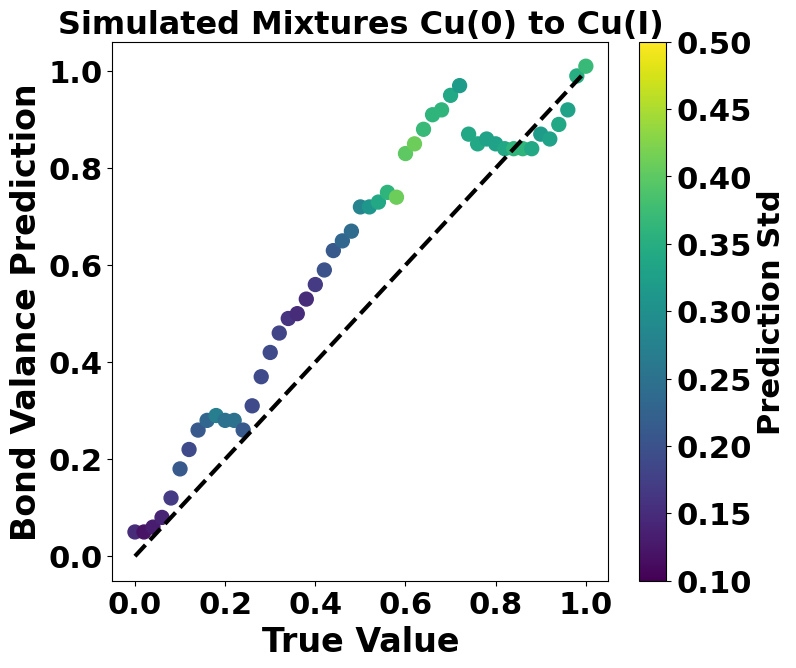

In [25]:
test_rf_obj.simulated_mixed_valent()

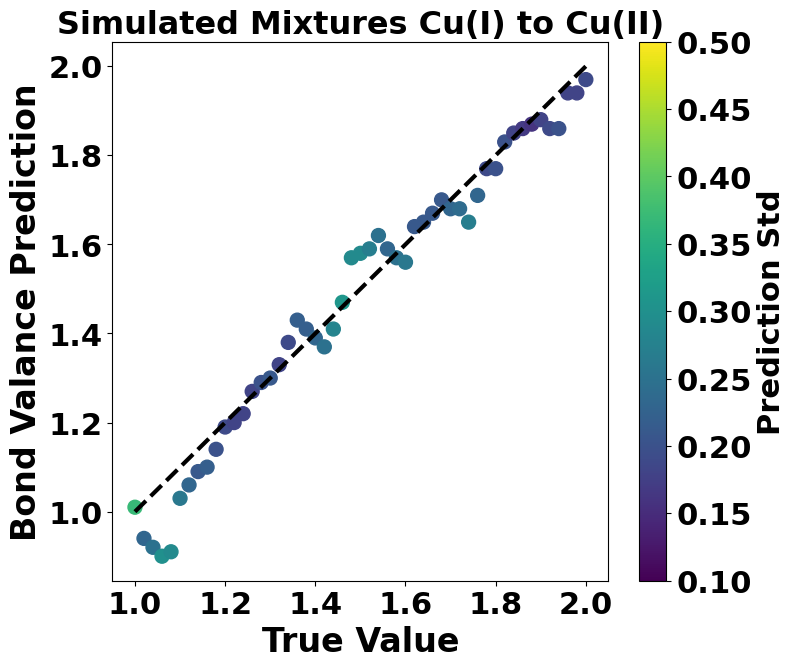

In [26]:
test_rf_obj.simulated_mixed_valent(catagory = '1-2')

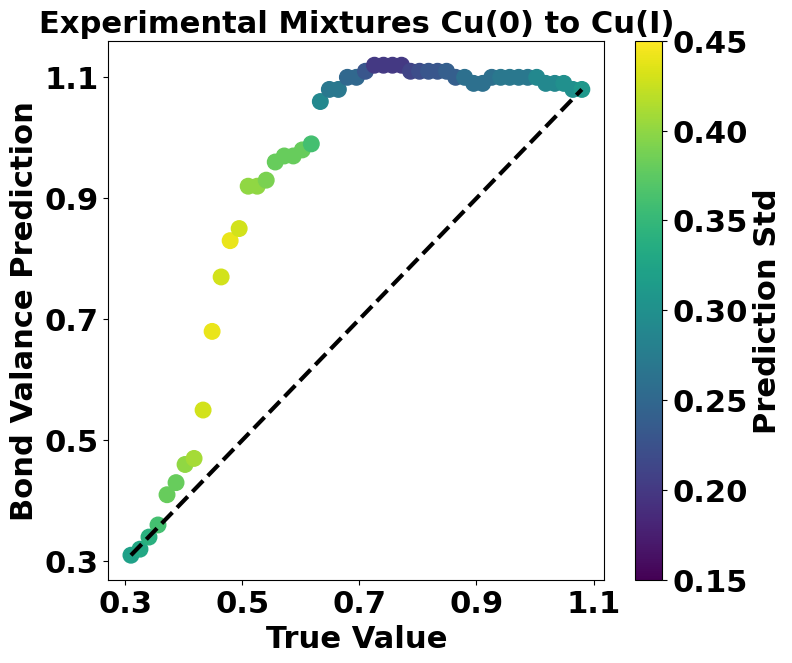

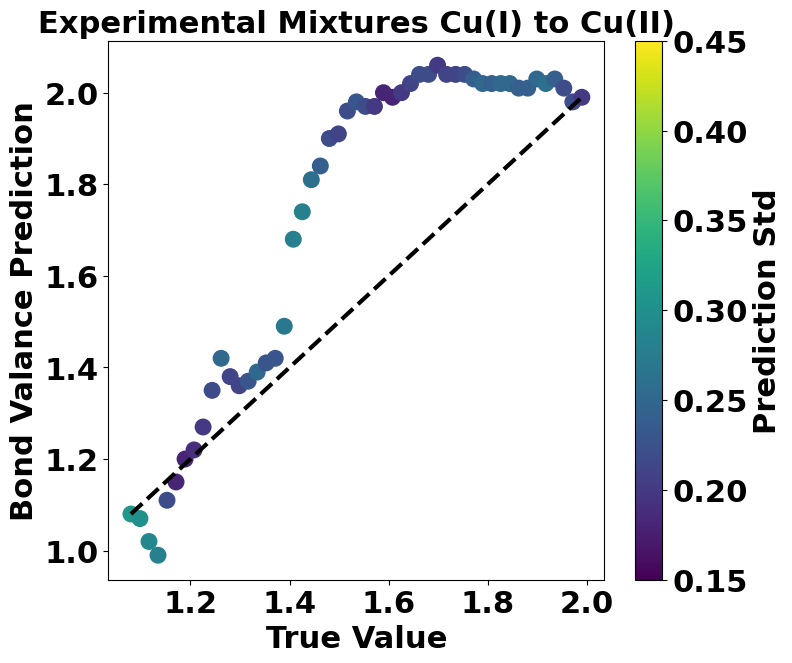

In [28]:
test_rf_obj.experimental_mixed_valent(catagory = '1-2', colorbar_range = [0.15, 0.45])

In [70]:
unstable_slice = test_rf_obj.spectra_df.loc[test_rf_obj.spectra_df['is_stable'] == False]

In [72]:
unstable_and_no_exp = unstable_slice.loc[unstable_slice['is_theoretical'] == True] 

In [21]:
len(test_rf_obj.spectra_df.loc[(test_rf_obj.spectra_df.theoretical == False) & (test_rf_obj.spectra_df.is_stable == True)])

1215

clean
['C:/Users/smgls/Materials_database/xas paper\\Cu Metal XAS.csv', 'C:/Users/smgls/Materials_database/xas paper\\Cu2O XAS.csv', 'C:/Users/smgls/Materials_database/xas paper\\CuO XAS.csv']
0.0 [51, 3] 10
C:/Users/smgls/Materials_database/xas paper\Cu Metal XAS.csv
Cu Metal
True
31


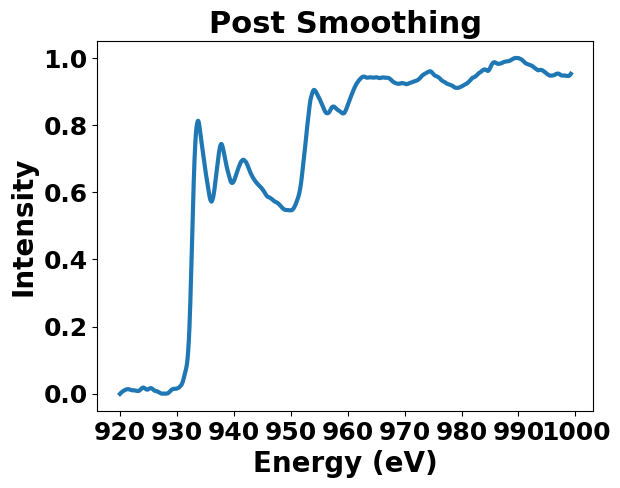

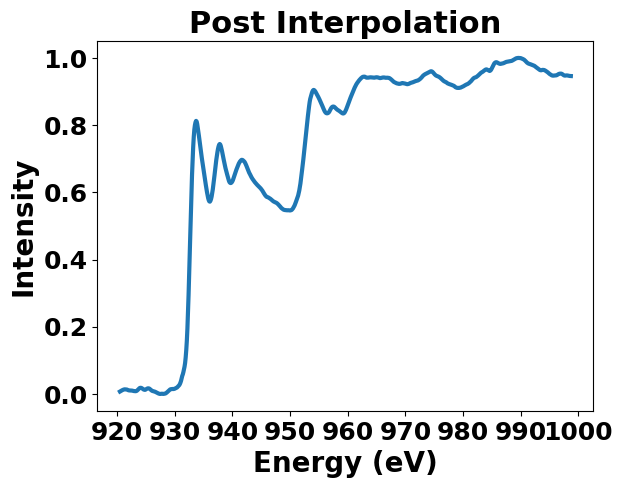

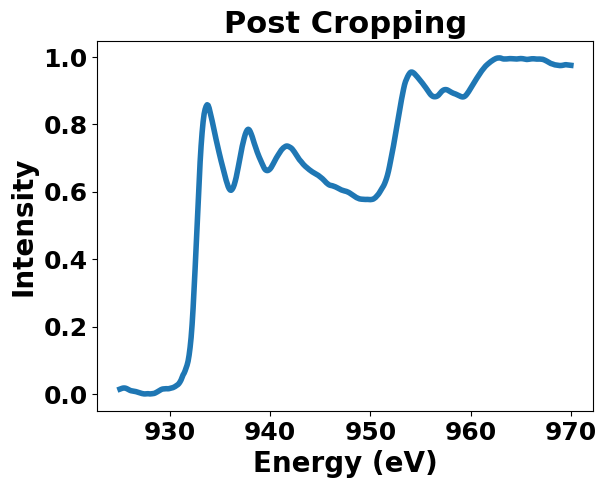

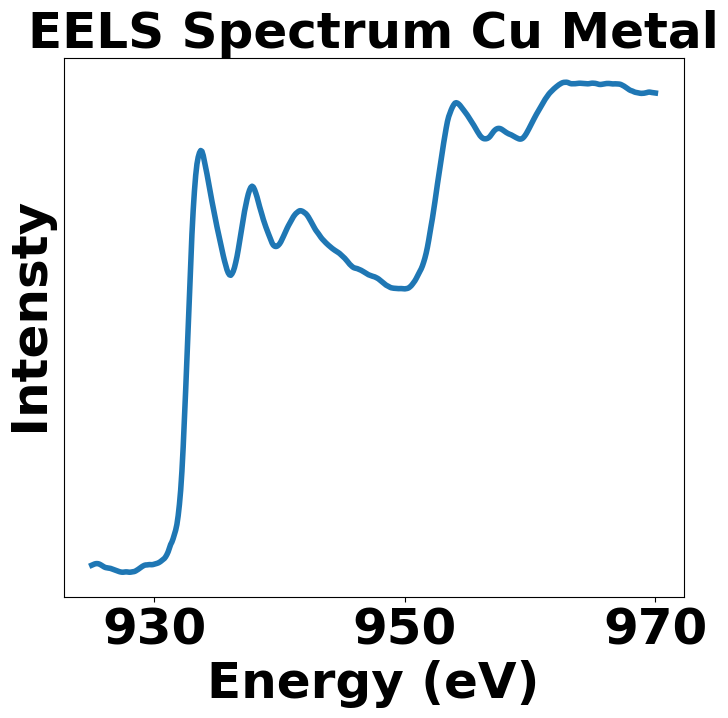

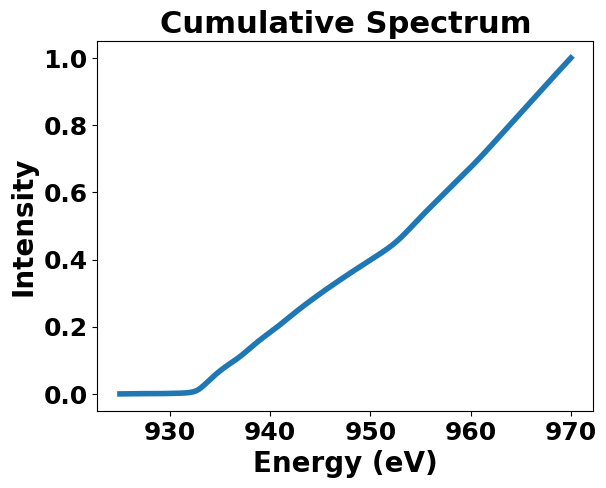

prediction = 0.42
prediction std = 0.37


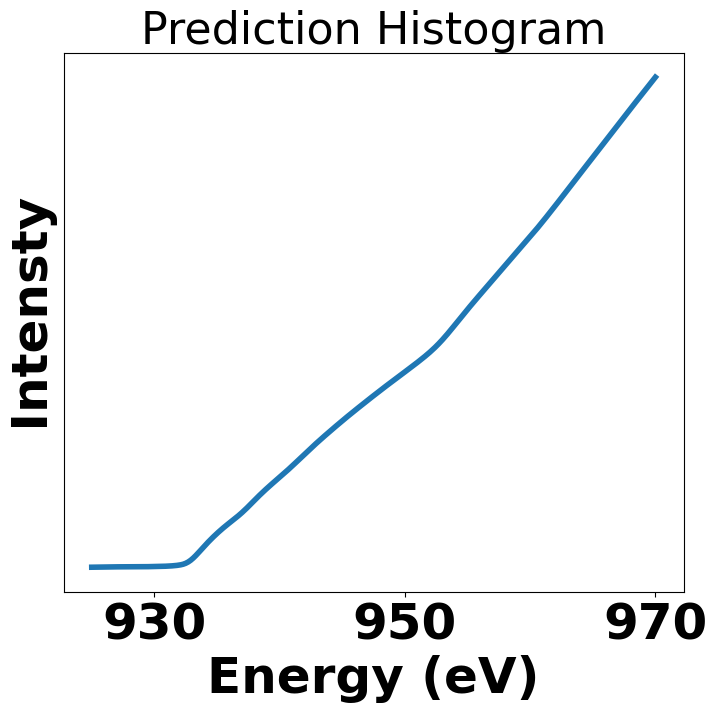

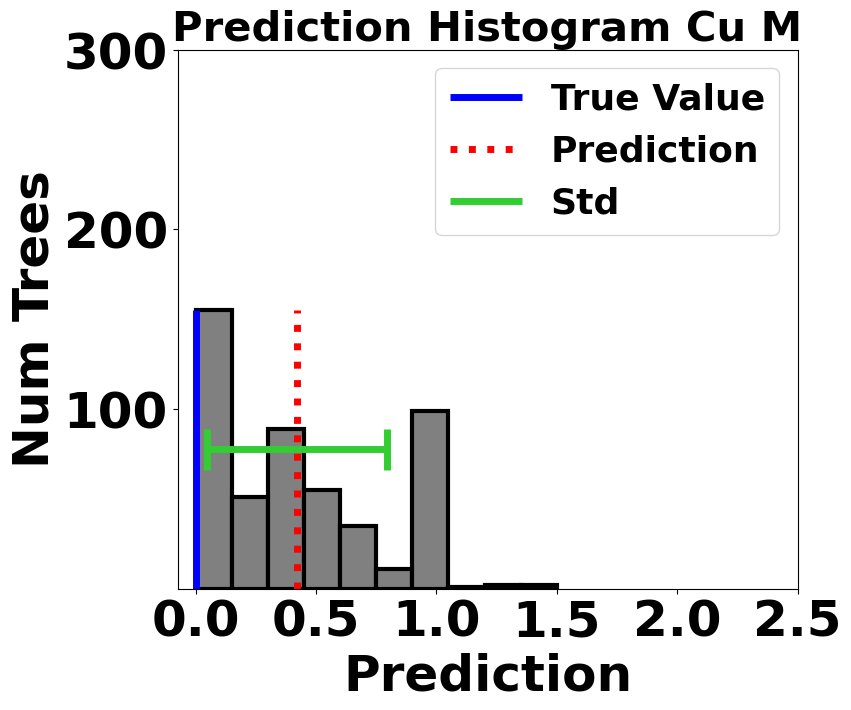

0.0 [51, 3] 10
C:/Users/smgls/Materials_database/xas paper\Cu2O XAS.csv
Cu2O
False
51


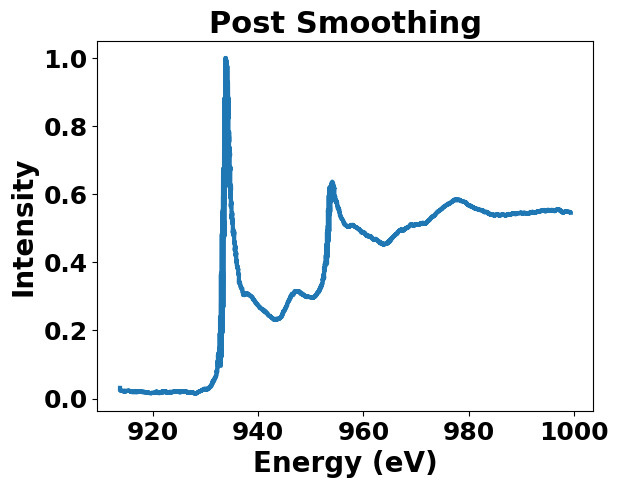

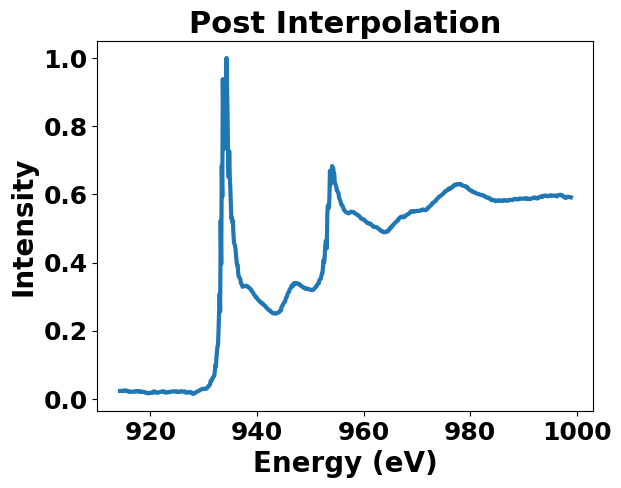

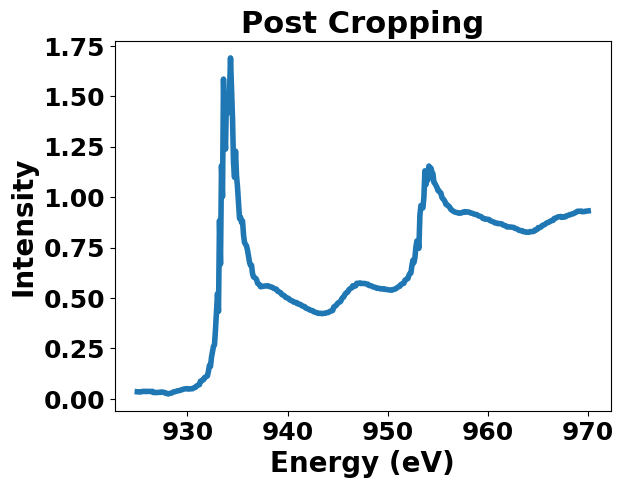

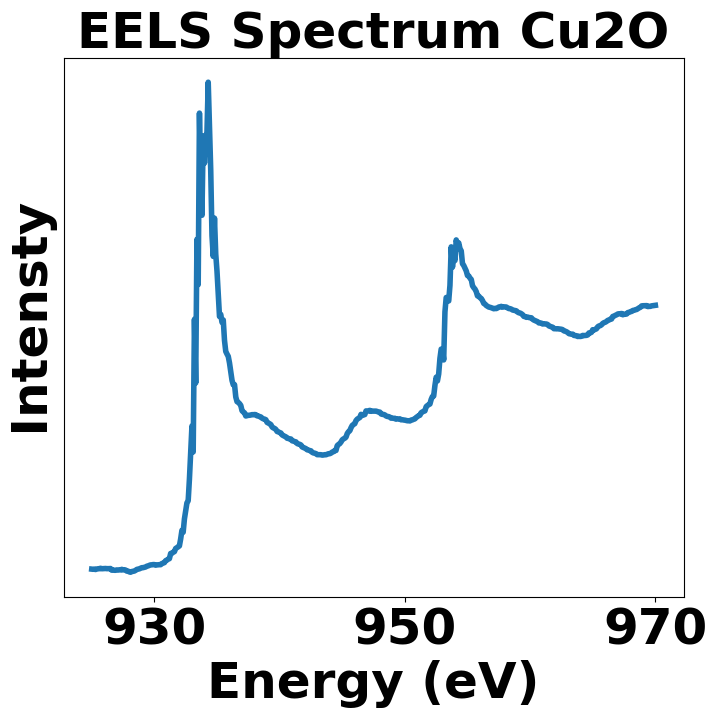

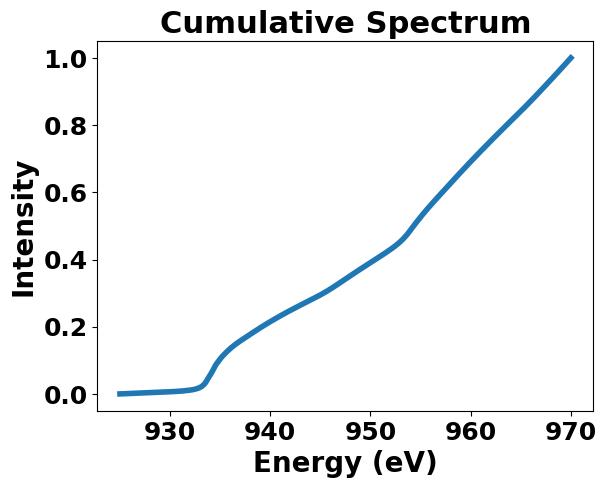

prediction = 1.0
prediction std = 0.53


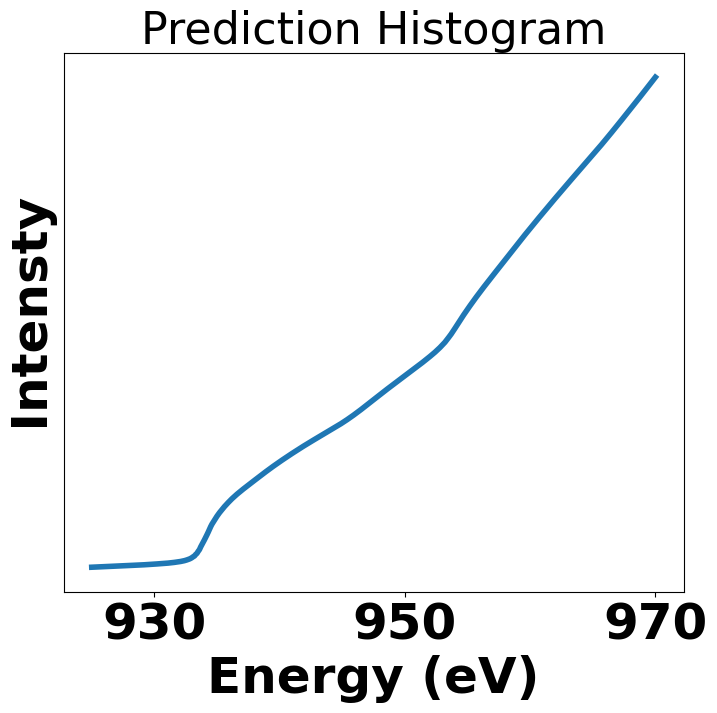

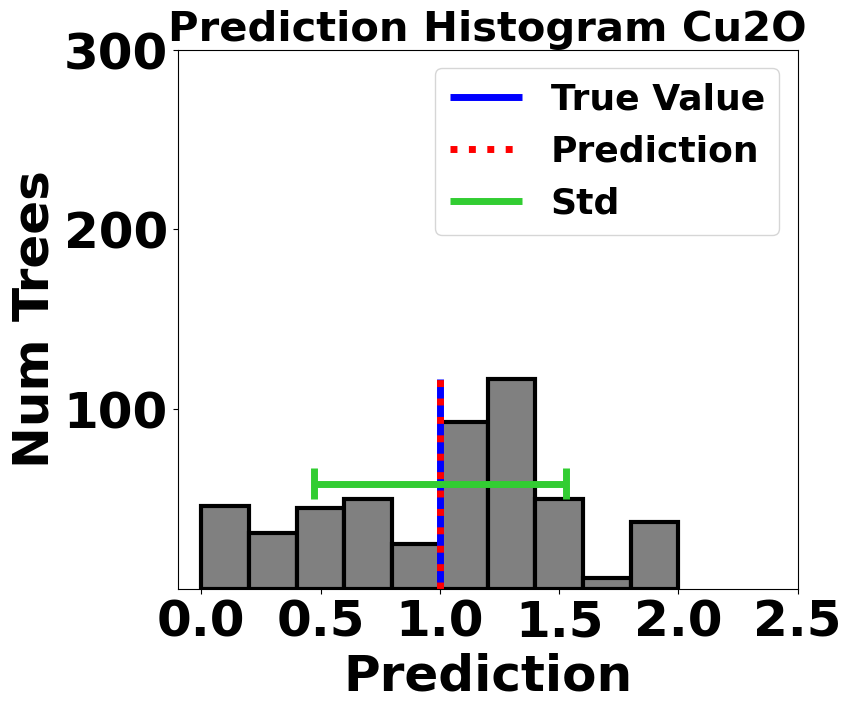

0.0 [51, 3] 10
C:/Users/smgls/Materials_database/xas paper\CuO XAS.csv
CuO
False
51


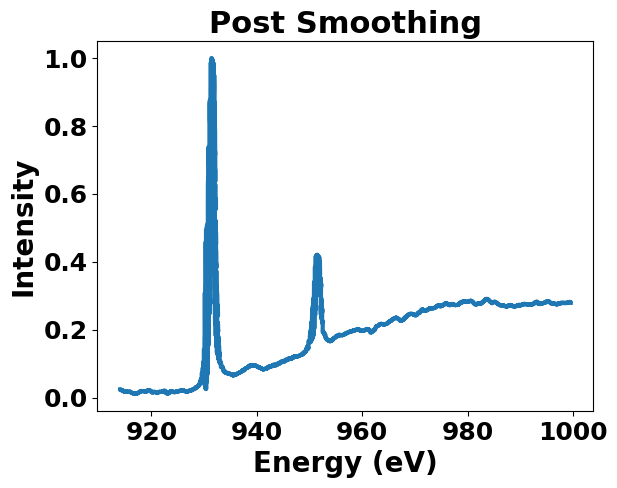

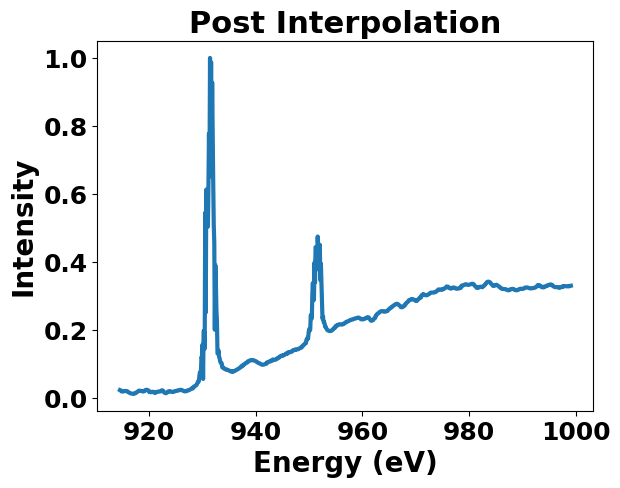

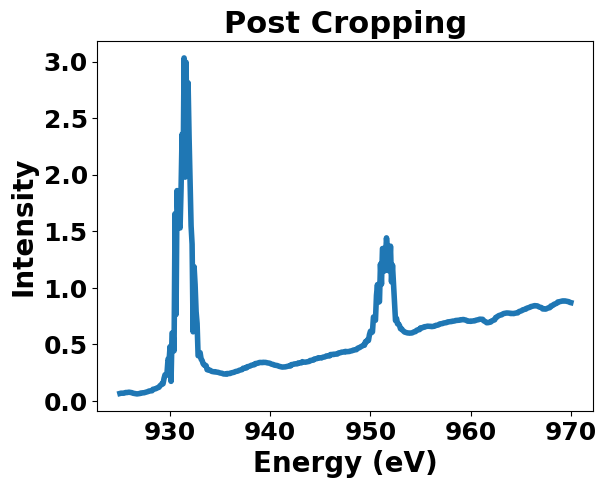

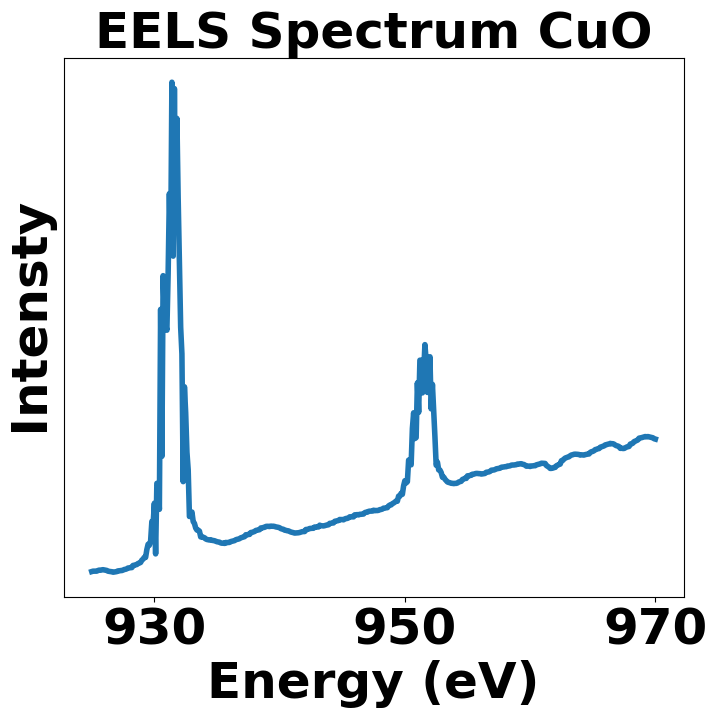

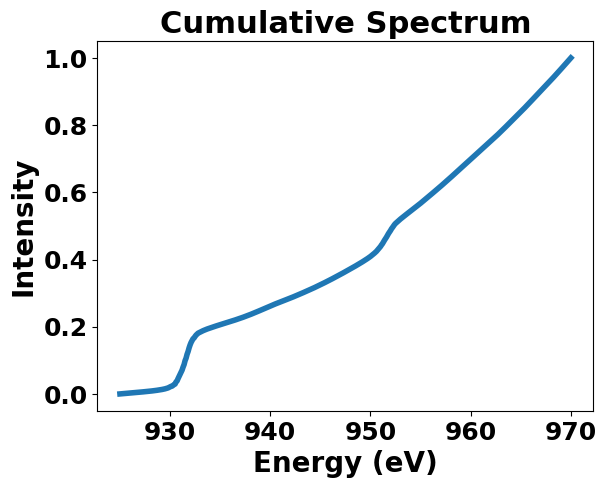

prediction = 2.05
prediction std = 0.25


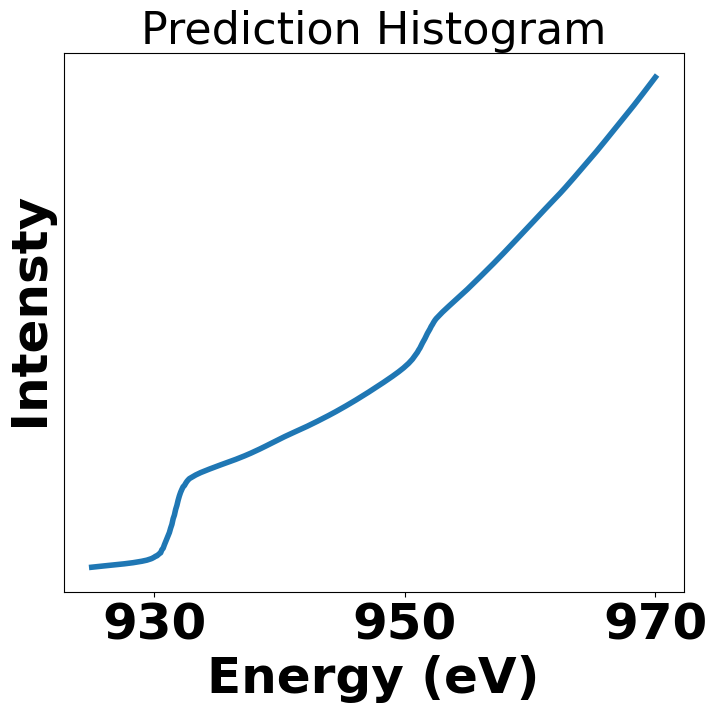

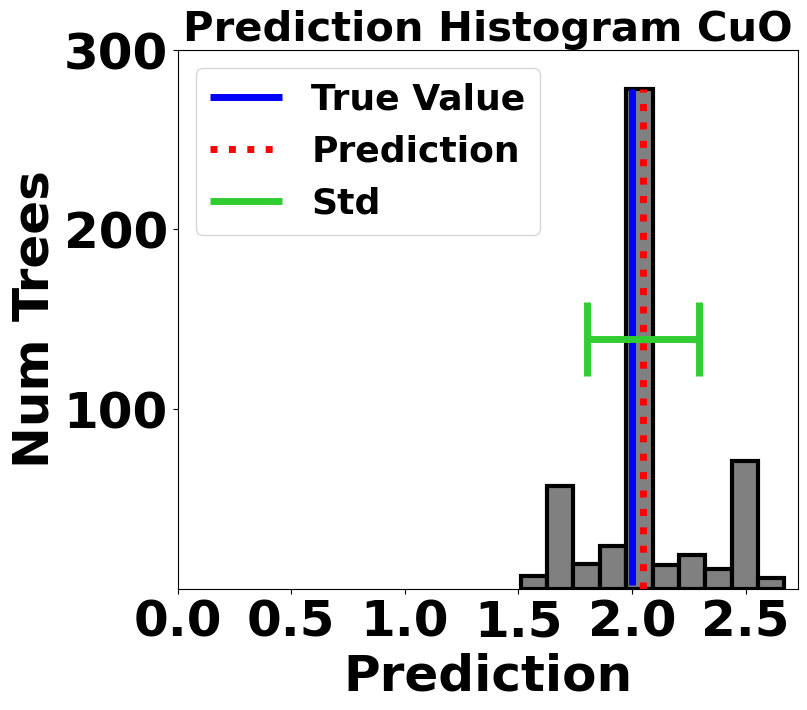

In [29]:
test_rf_obj.predict_experiment_folder('C:/Users/smgls/Materials_database/xas paper/', spectra_type = 'csv', 
                                      shifts = [0.0], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[51,3]])

clean
['C:/Users/smgls/Materials_database/Cu_deconvolved_spectra\\Cu Metal Deconvolved Spectrum.dm4', 'C:/Users/smgls/Materials_database/Cu_deconvolved_spectra\\Cu2O Deconvolved Spectrum.dm4', 'C:/Users/smgls/Materials_database/Cu_deconvolved_spectra\\CuO Deconvolved Spectrum.dm4']
0.0 [51, 3] 10
C:/Users/smgls/Materials_database/Cu_deconvolved_spectra\Cu Metal Deconvolved Spectrum.dm4


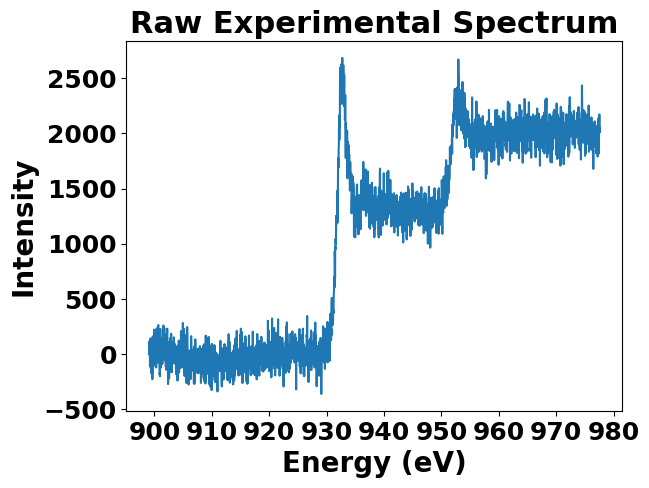

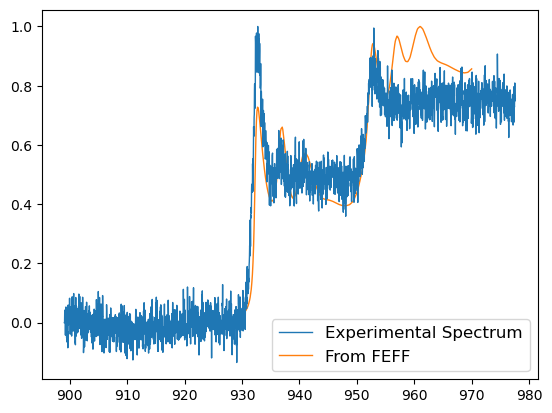

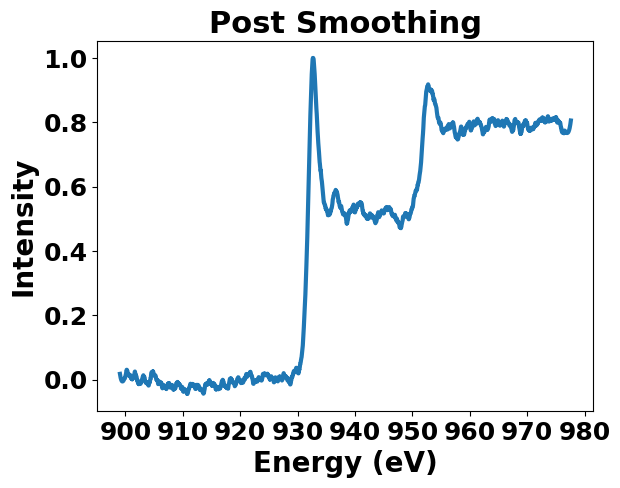

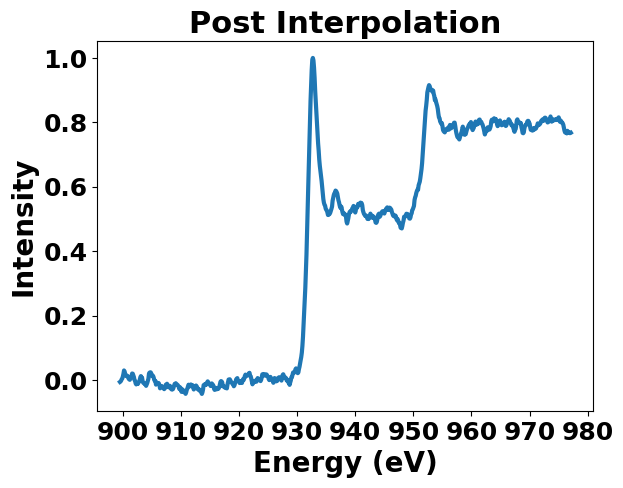

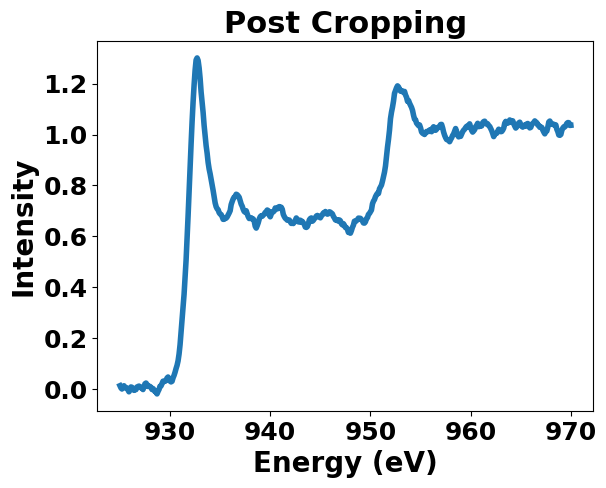

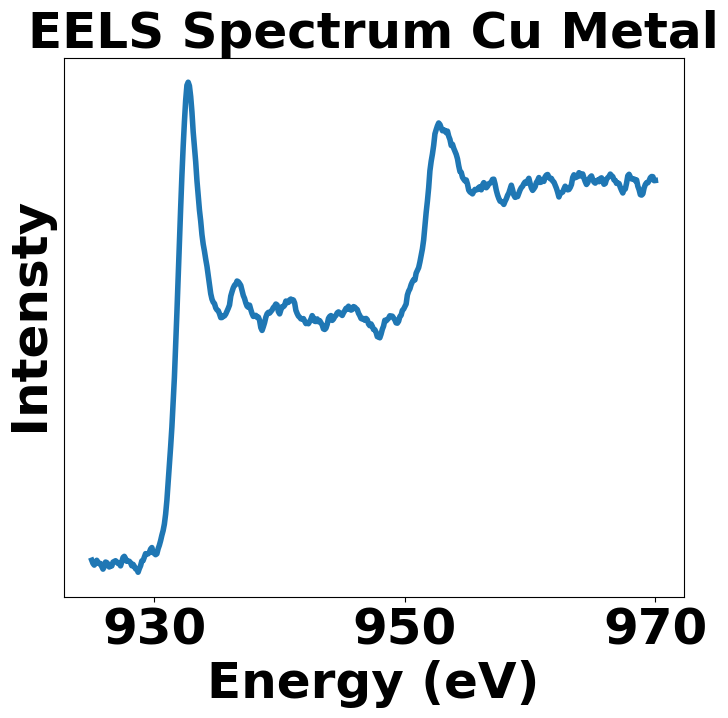

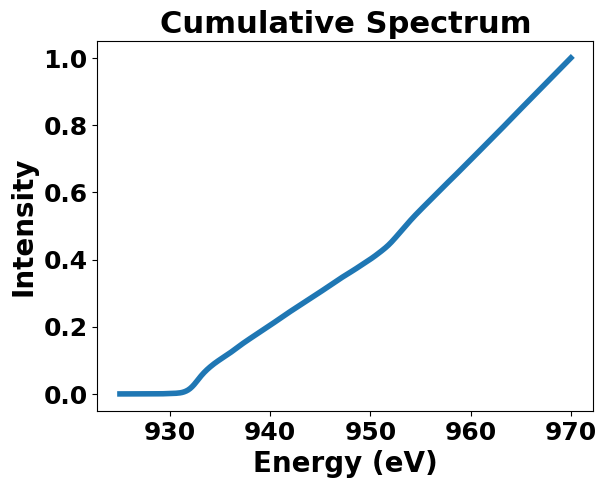

prediction = 0.31
prediction std = 0.32


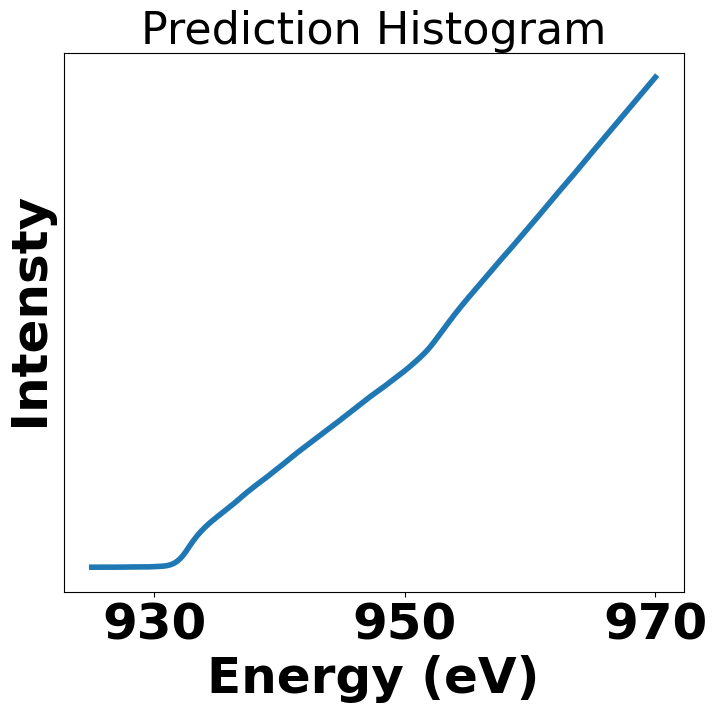

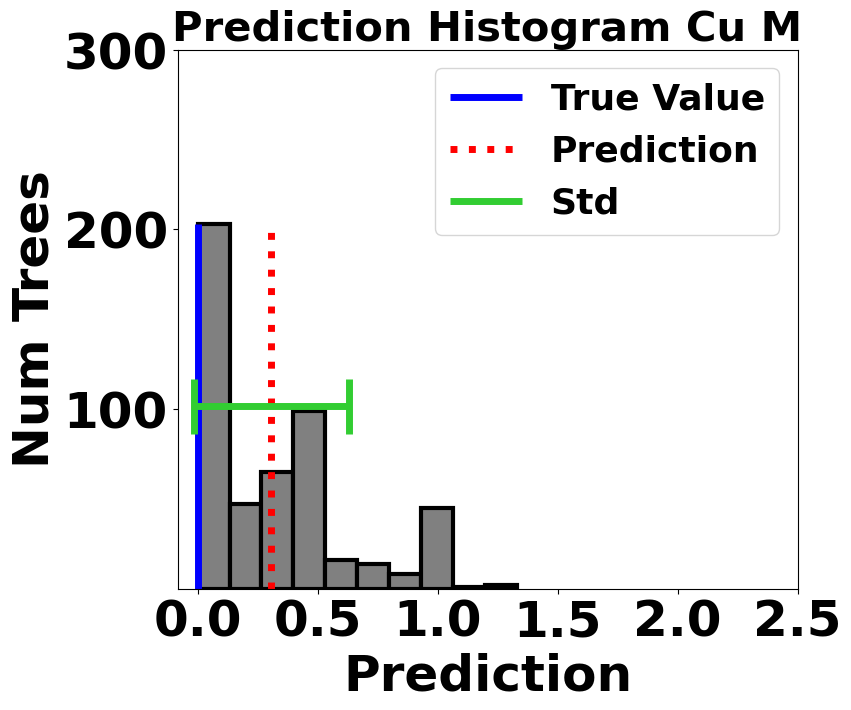

0.0 [51, 3] 10
C:/Users/smgls/Materials_database/Cu_deconvolved_spectra\Cu2O Deconvolved Spectrum.dm4


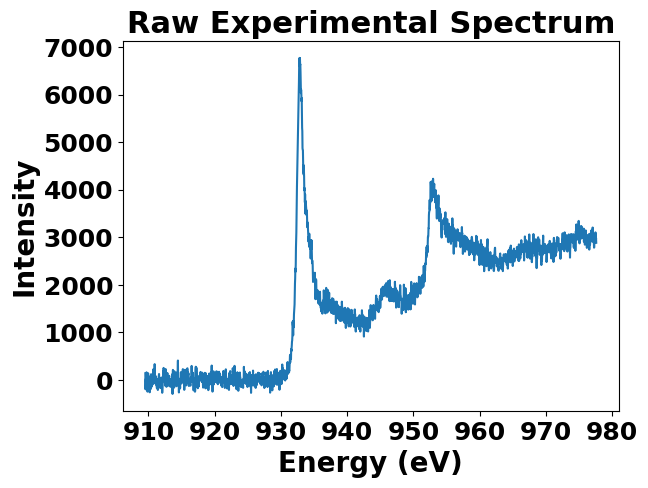

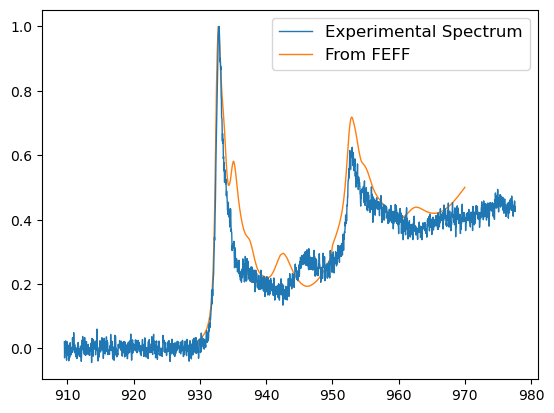

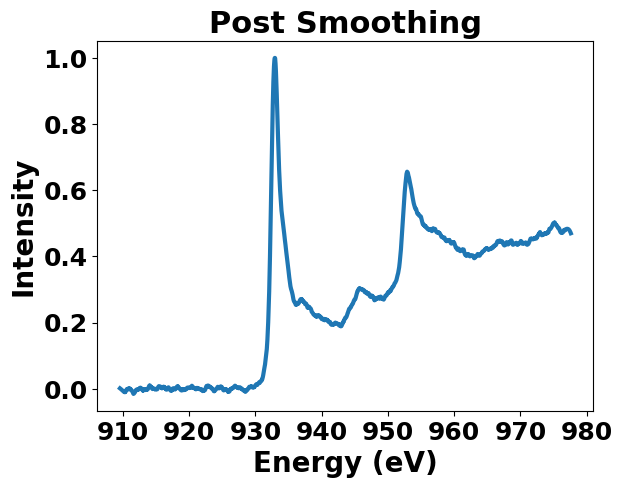

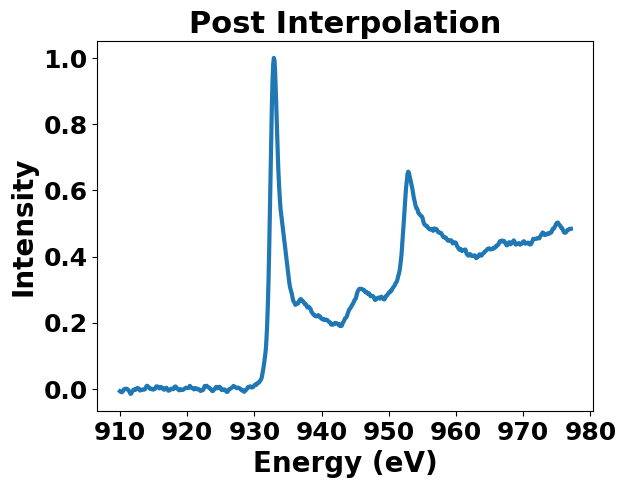

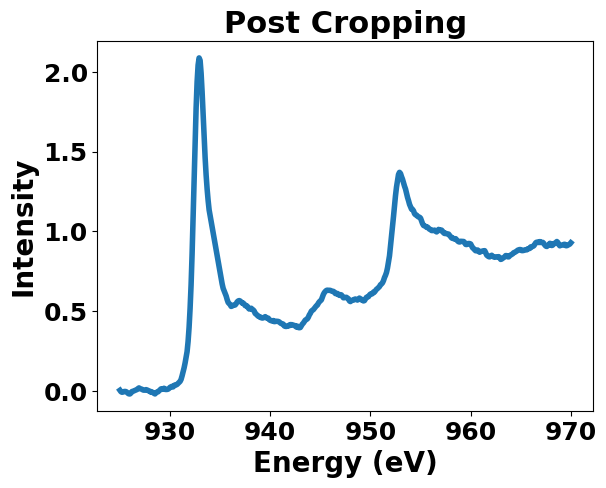

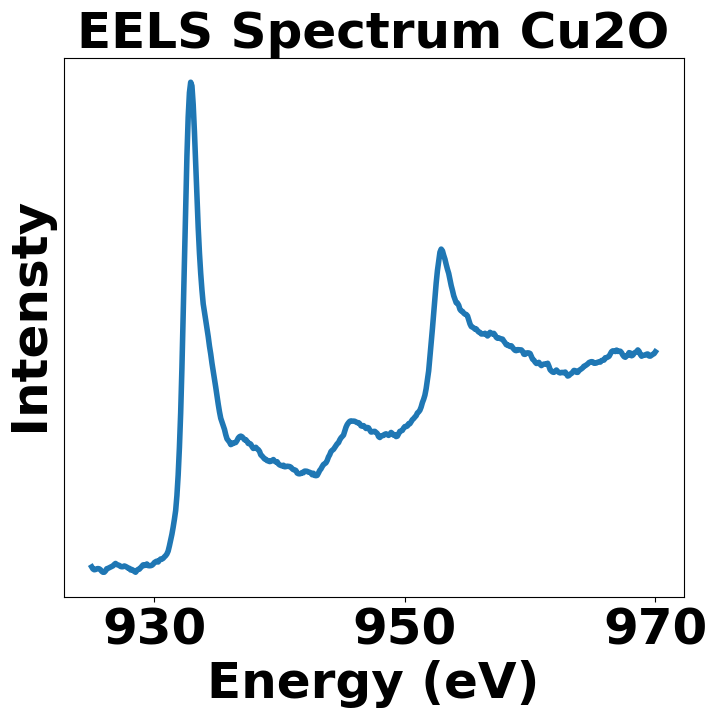

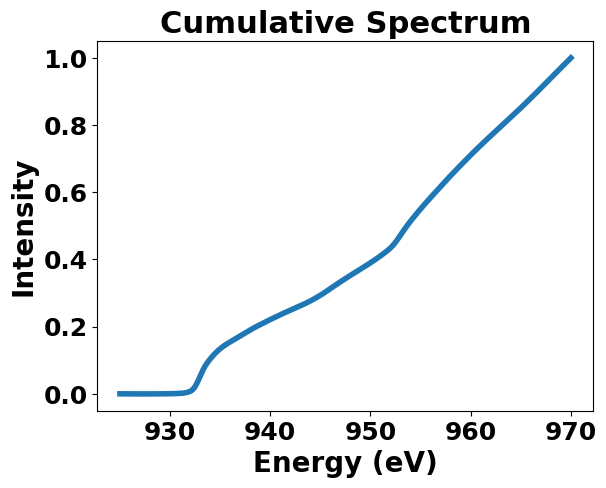

prediction = 1.08
prediction std = 0.31


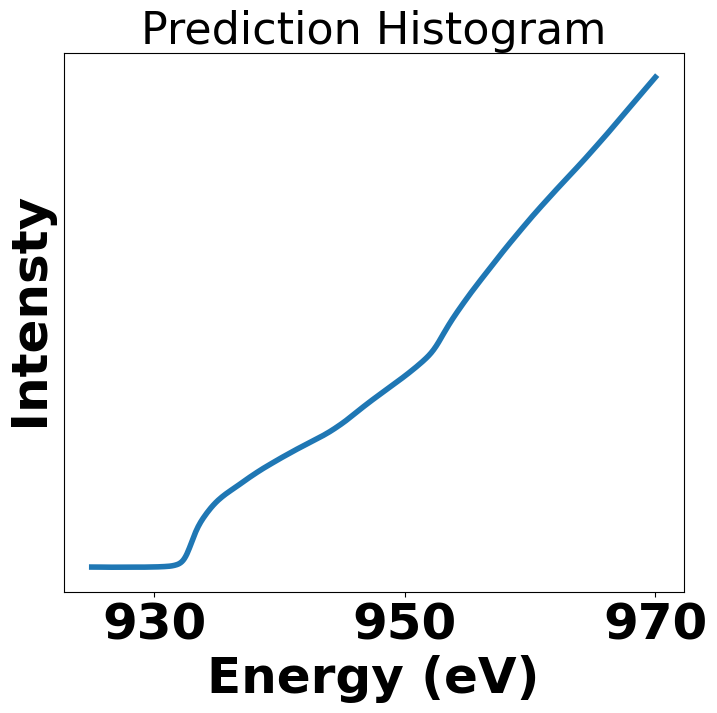

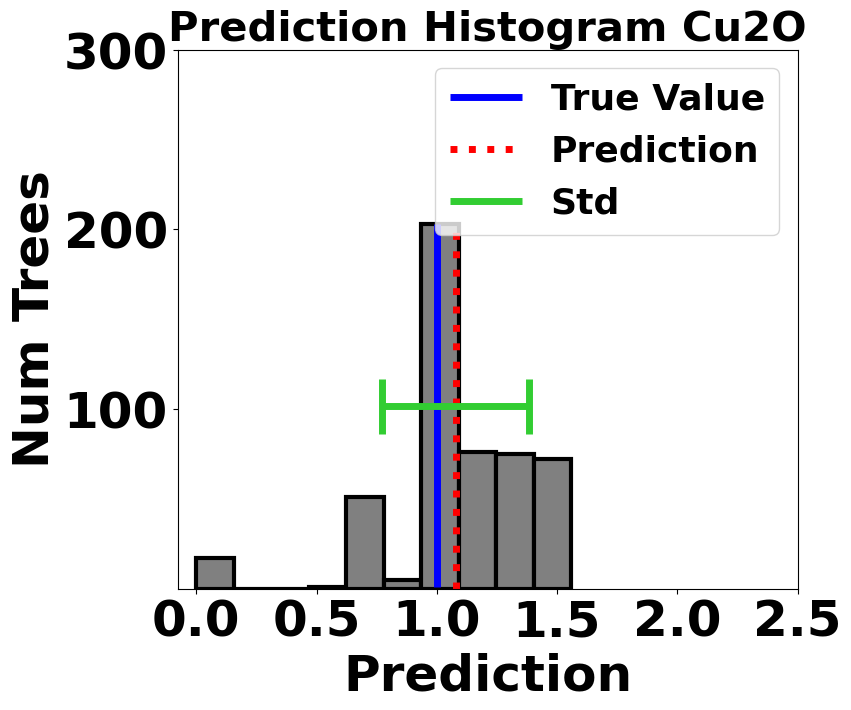

0.0 [51, 3] 10
C:/Users/smgls/Materials_database/Cu_deconvolved_spectra\CuO Deconvolved Spectrum.dm4


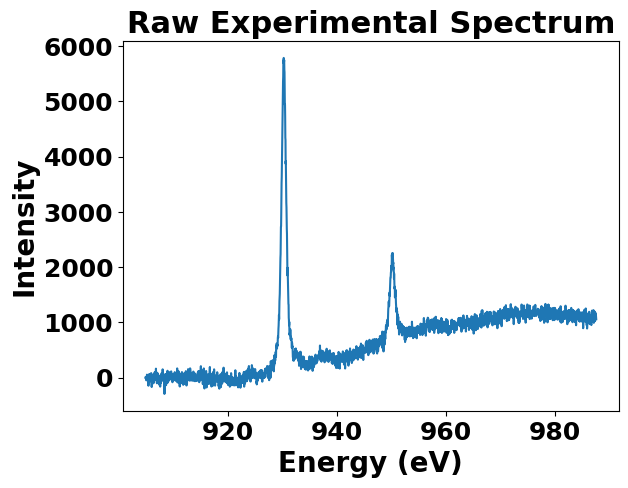

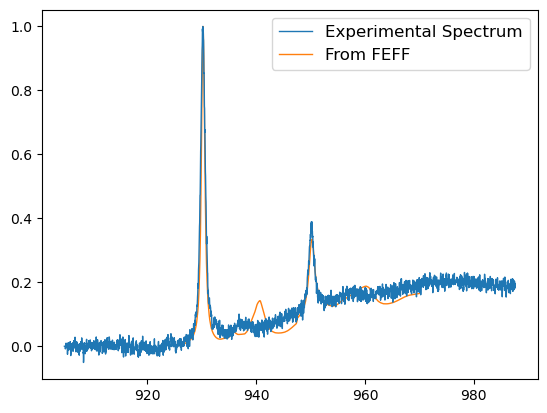

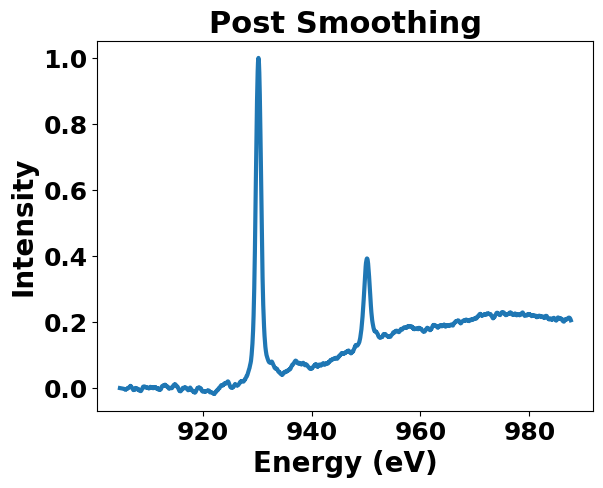

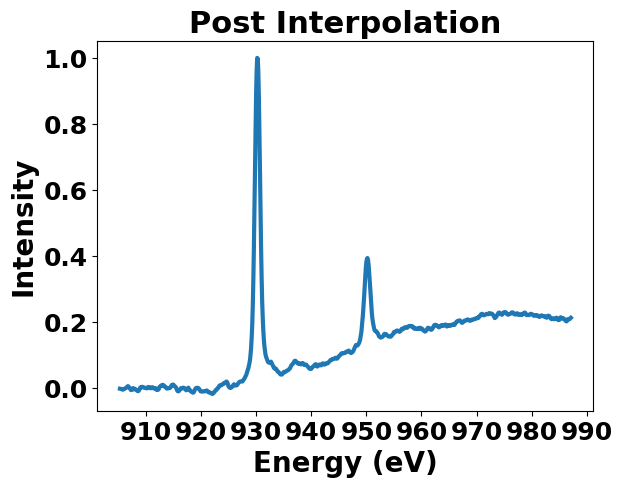

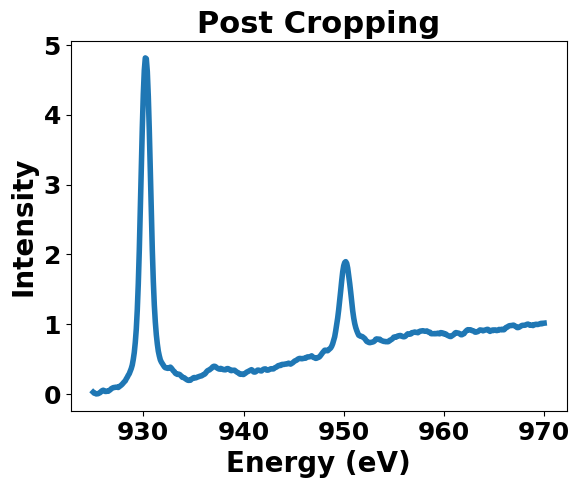

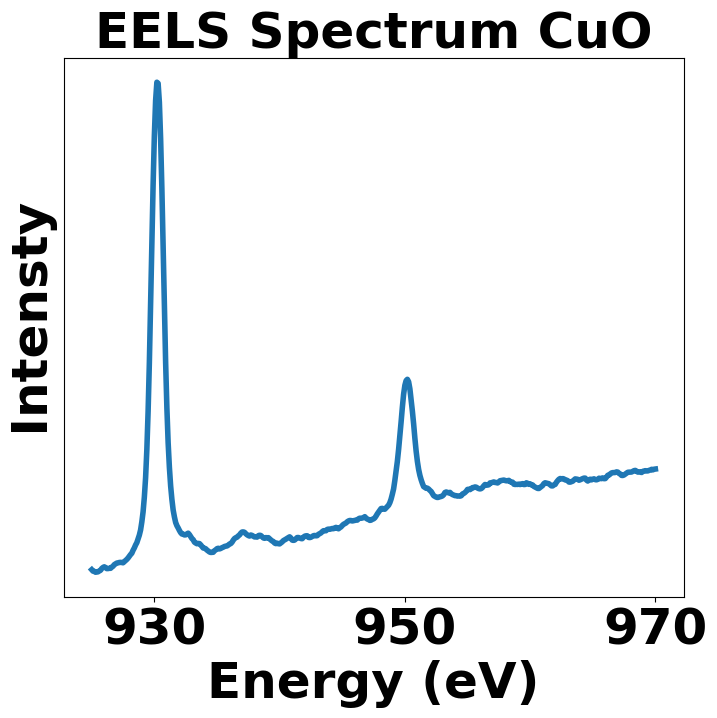

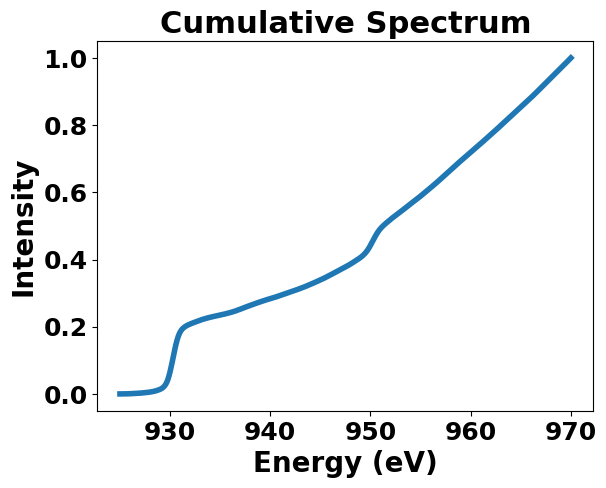

prediction = 1.99
prediction std = 0.2


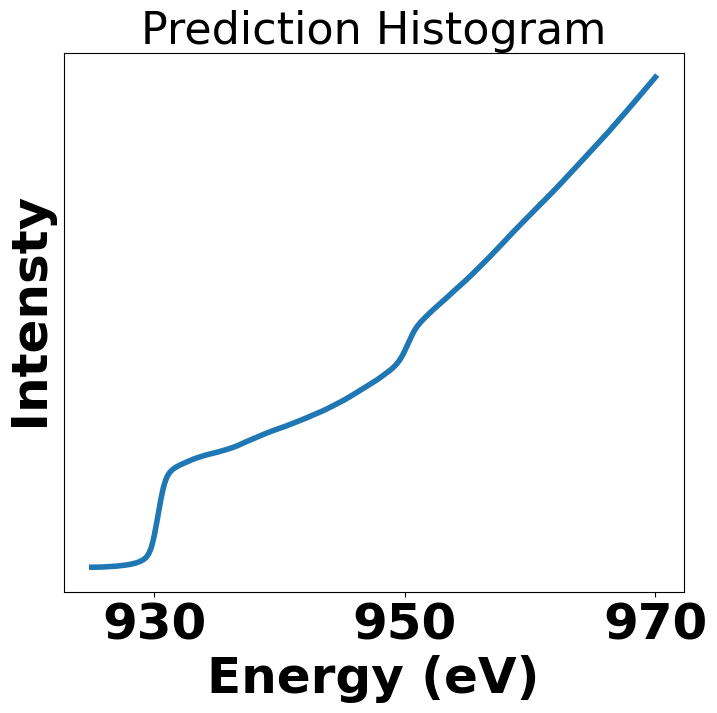

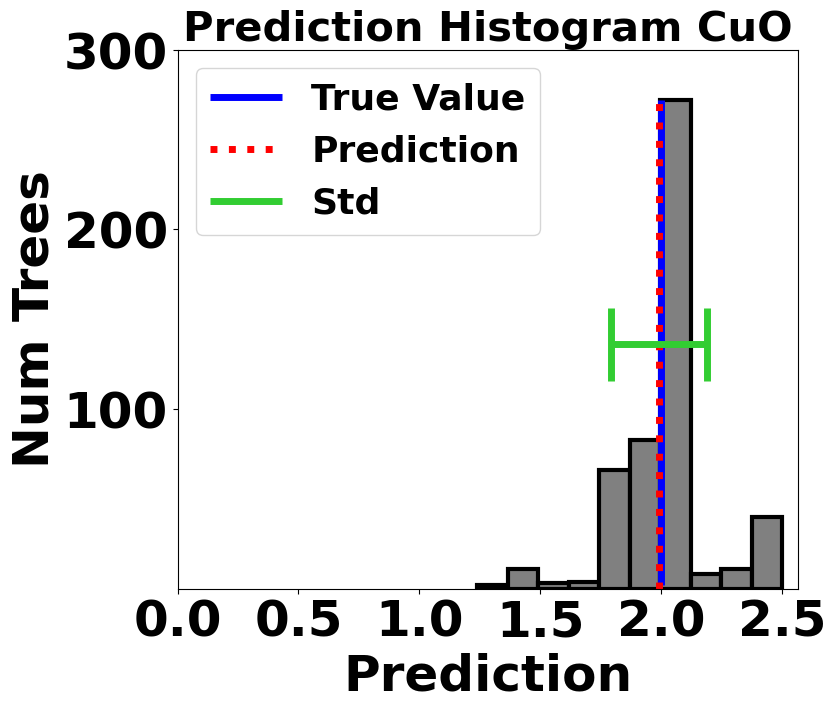

In [30]:
test_rf_obj.predict_experiment_folder('C:/Users/smgls/Materials_database/Cu_deconvolved_spectra/', spectra_type = 'TEAM I', 
                                      shifts = [0.0], theory_column = 'TEAM_1_aligned_925_970', smoothings = [[51,3]])

In [21]:
test_rf_obj.random_forest_train_bond_valance(bv_column='BV Used For Alignment',
                           spectra_to_predict = 'Cumulative_Spectra_TEAM_1_aligned_925_970',
                        energy_col = 'new Scaled Energies use', 
                                             max_features = 'auto')

len training data = 7067
Using column: Cumulative_Spectra_TEAM_1_aligned_925_970 to predict: BV Used For Alignment
model accuracy (R^2) on simulated test data 0.8889127604122083


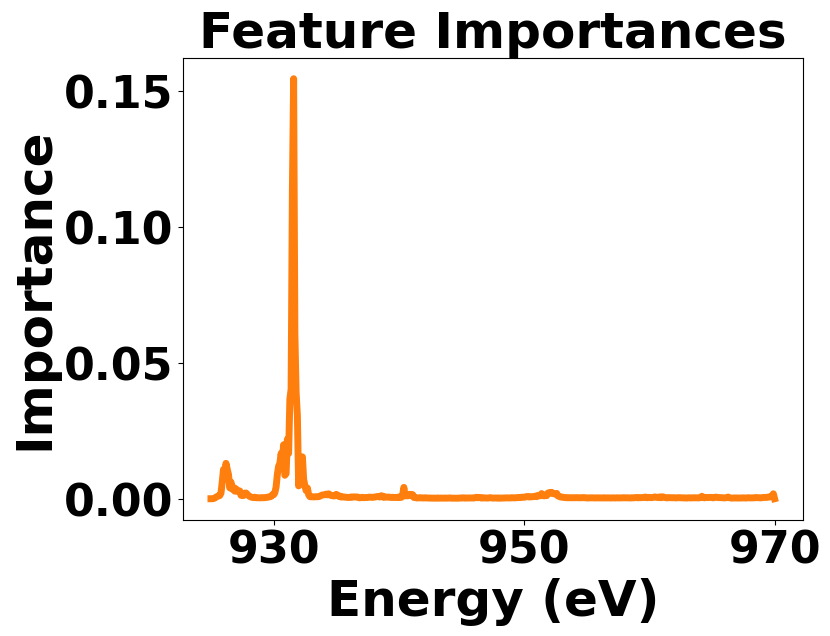

In [22]:
test_rf_obj.show_feature_importances('Cu', savefigure=True)

num spectra = 2356
model accuracy (R^2) on simulated test data 0.8889127604122083
Text(0, 0.5, 'Num Predictions')


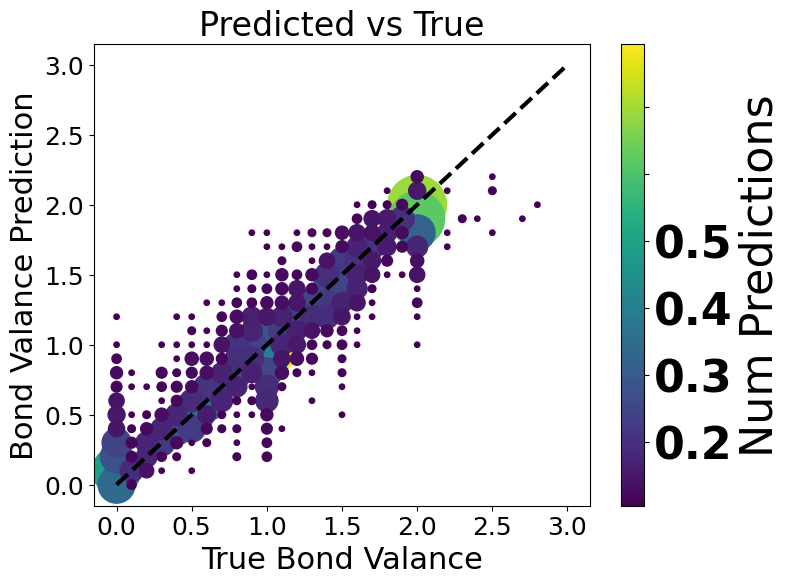

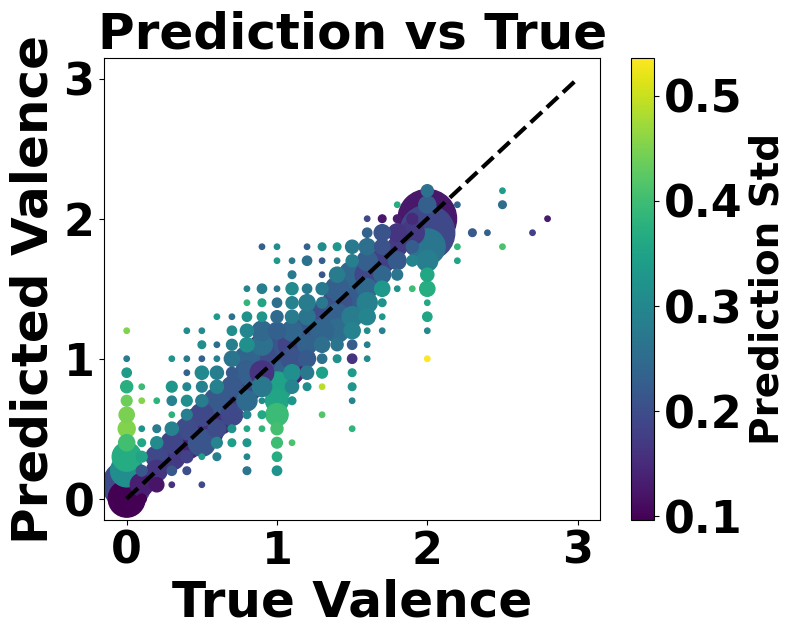

In [23]:
test_rf_obj.show_feature_importances('Cu', savefigure=True)
test_rf_obj.show_r2(savefigure=True)
test_rf_obj.show_errors_histogram(nbins=25, savefigure=True)

RMSE 0.20825025504909622


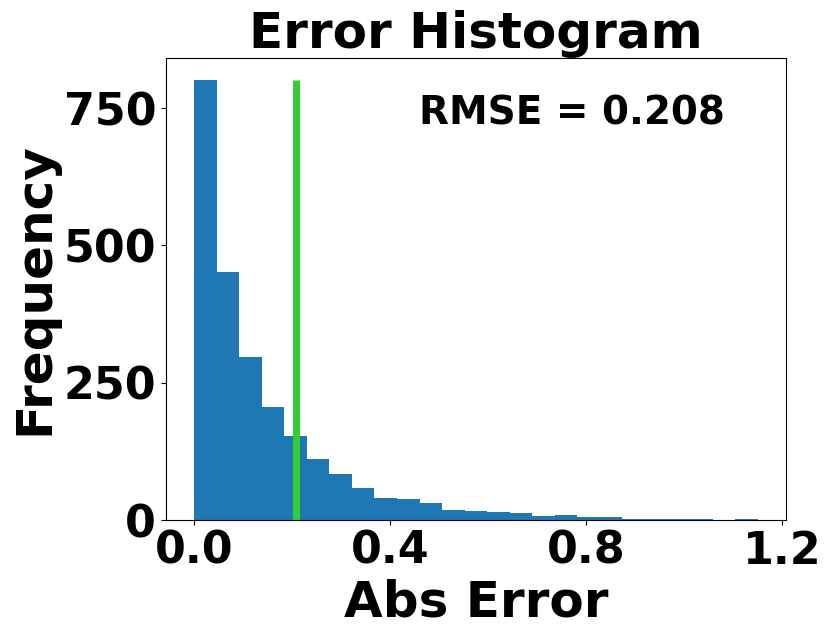

In [24]:
test_rf_obj.show_errors_histogram(nbins=25, savefigure=True)

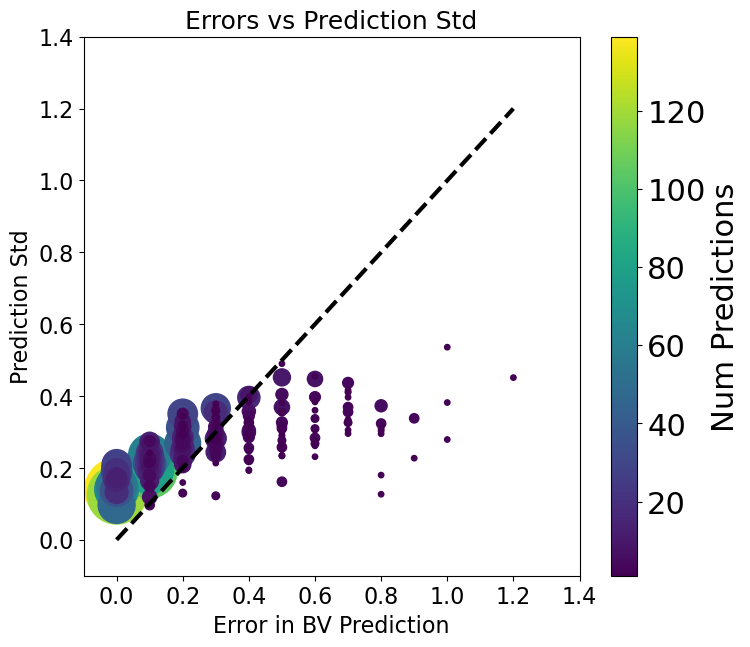

<Figure size 800x700 with 0 Axes>

In [14]:
test_rf_obj.plot_errors_vs_std()

In [ ]:
test_rf_obj.show_errors_histogram(nbins=25, savefigure=True)

In [38]:
thresholds = np.arange(0.1, 0.65, 0.05)

In [39]:
thresholds

array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 ])

0.9932401465631612
0.990779653622904
0.9830561091779874
0.9679025114342286
0.9412864056710952
0.9211968111593422
0.9039644821595803
0.895983489787829
0.891602089655927
0.8893775837175253
0.8889127604122083


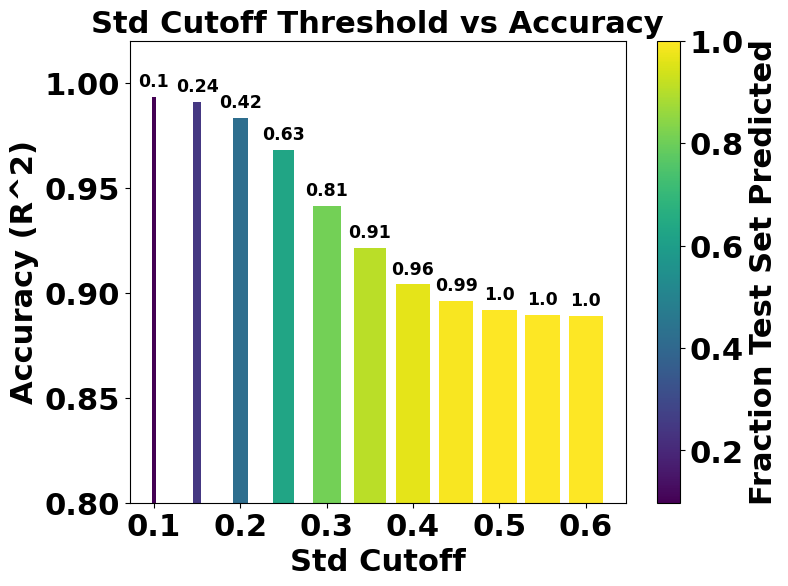

In [46]:
test_rf_obj.visualize_all_thresholds(thresholds, ylims = [0.8, 1.02], text_fontsize = 12.5, show_type = 'percentage_predicted', 
                                    color_scheme = 'viridis', yticks_to_use = [0.8, 0.85, 0.9, 0.95, 1.0])

In [46]:
r2s = []
percentage_predicted = []
rmse = []
for thresh in thresholds:
    output = test_rf_obj.predictions_from_threshold(thresh, show_plot = False)
    print(output[0])
    # print(thresh)
    r2s.append(output[0])
    # print(output[1])
    percentage_predicted.append(output[1]/len(test_rf_obj.rf_error_df))
    rmse.append(output[2])

0.9932401465631612
0.990779653622904
0.9830561091779874
0.9679025114342286
0.9412864056710952
0.9211968111593422
0.9039644821595803
0.895983489787829
0.891602089655927
0.8893775837175253
0.8889127604122083


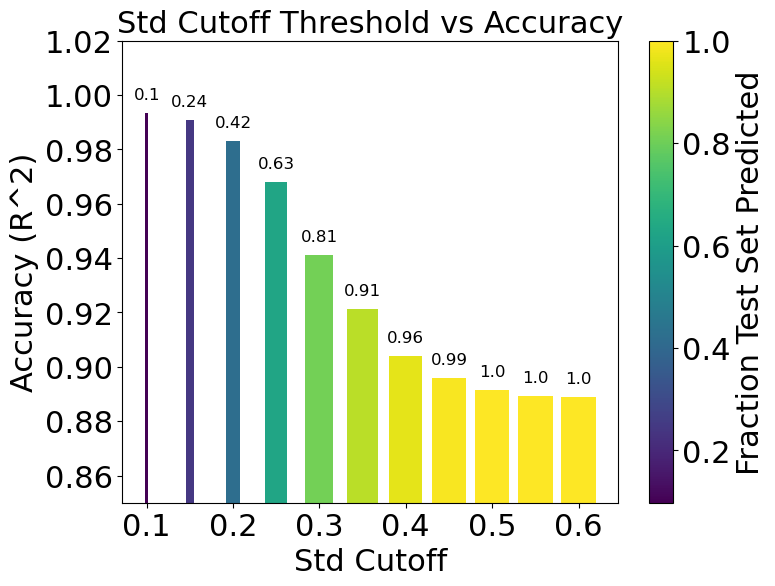

In [59]:
rmse_size = 12

data_x = thresholds
data_hight = np.asarray(r2s)
data_color = percentage_predicted
data_color_temp = np.asarray(data_color) - min(data_color)
data_color_normalized = [x / max(data_color_temp) for x in data_color_temp]

fig, ax = plt.subplots(figsize=(8, 6))

my_cmap = plt.cm.get_cmap('viridis')
colors = my_cmap(data_color_normalized)

plt.bar(data_x, data_hight, color=colors, width = np.asarray(data_color)*0.04)

sm = ScalarMappable(cmap=my_cmap, norm=plt.Normalize(min(data_color),max(data_color)))

sm.set_array([])

cb = plt.colorbar(sm, label='Fraction Test Set Predicted')
ax = cb.ax
text = ax.yaxis.label
font = matplotlib.font_manager.FontProperties(size=22)
text.set_font_properties(font)
for t in cb.ax.get_yticklabels():
    t.set_fontsize(22)

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.xlabel('Std Cutoff', fontsize=22)
plt.ylabel('Accuracy (R^2)', fontsize=22)
plt.title('Std Cutoff Threshold vs Accuracy', fontsize=22)
plt.ylim([0.85, 1.02])
plt.text(thresholds[0], r2s[0] + 0.005, str(round(percentage_predicted[0], 2)), horizontalalignment='center', fontsize = rmse_size)
plt.text(thresholds[1], r2s[1] + 0.005, str(round(percentage_predicted[1], 2)), horizontalalignment='center', fontsize = rmse_size)
plt.text(thresholds[2], r2s[2] + 0.005, str(round(percentage_predicted[2], 2)), horizontalalignment='center', fontsize = rmse_size)
plt.text(thresholds[3], r2s[3] + 0.005, str(round(percentage_predicted[3], 2)), horizontalalignment='center', fontsize = rmse_size)
plt.text(thresholds[4], r2s[4] + 0.005, str(round(percentage_predicted[4], 2)), horizontalalignment='center', fontsize = rmse_size)
plt.text(thresholds[5], r2s[5] + 0.005, str(round(percentage_predicted[5], 2)), horizontalalignment='center', fontsize = rmse_size)

plt.text(thresholds[6], r2s[6] + 0.005, str(round(percentage_predicted[6], 2)), horizontalalignment='center', fontsize = rmse_size)
plt.text(thresholds[7], r2s[7] + 0.005, str(round(percentage_predicted[7], 2)), horizontalalignment='center', fontsize = rmse_size)
plt.text(thresholds[8], r2s[8] + 0.005, str(round(percentage_predicted[8], 2)), horizontalalignment='center', fontsize = rmse_size)
plt.text(thresholds[9], r2s[9] + 0.005, str(round(percentage_predicted[9], 2)), horizontalalignment='center', fontsize = rmse_size)
plt.text(thresholds[10], r2s[10] + 0.005, str(round(percentage_predicted[10], 2)), horizontalalignment='center', fontsize = rmse_size)
# plt.text(thresholds[11], r2s[11] + 0.005, str(round(rmse[11], 2)), horizontalalignment='center', fontsize = rmse_size)
# plt.text(thresholds[12], r2s[12] + 0.005, str(round(rmse[12], 2)), horizontalalignment='center', fontsize = rmse_size)
# plt.text(thresholds[13], r2s[13] + 0.005, str(round(rmse[13], 2)), horizontalalignment='center', fontsize = rmse_size)
# plt.text(thresholds[10], 0.98, 'Text = RMSE', horizontalalignment='center', fontsize = 20)

# plt.savefig("bar_chart_with_colorbar_01.png", bbox_inches='tight')

plt.show()

In [15]:
test_rf_obj.rf_error_df.sort_values('Errors Rounded', ascending = False)

,Labels Test,Labels Test Rounded,Predictions,Predictions Rounded,Errors,Errors Rounded,Predictions Std,Full Predictions,Materials Ids,Pretty Formula,Energies,Spectrum,XAS Spectrum,is_stable,is_theoretical
1312,0,0,1.15002,1.2,1.15002,1.2,0.451351,"[1.0, 0.95, 0.0, 1.2, 1.0, 2.0, 1.2, 2.0, 0.94...",mp-1147553,KCuIO6,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 1.0444521436877612e-06, 3.199069914...","[0.0, 0.0002586538254054947, 0.000533581296237...",True,True
1115,0,0,0.97946,1.0,0.97946,1.0,0.279021,"[1.0, 1.0, 1.0, 1.0, 1.33, 0.73, 1.0, 1.25, 0....",mp-1198330,CuC32(NF2)8,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.432771020911678e-07, 7.6362811182...","[0.0, 8.239717957070416e-05, 0.000176241229528...",False,False
1494,1.5,1.5,0.45588,0.5,1.04412,1.0,0.381958,"[1.0, 1.0, 0.46, 0.3, 0.62, 0.56, 0.34, 1.0, 0...",mp-1220674,Nb3(CuSe3)2,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 5.41355193552874e-07, 1.65793416700...","[0.0, 0.0001574884553482583, 0.000324829797327...",True,True
1106,2.0,2.0,1.00234,1.0,0.99766,1.0,0.535996,"[1.12, 0.0, 1.12, 1.42, 1.42, 2.0, 0.74, 1.29,...",mp-1192723,Cs2CuBr4,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 8.210059849042157e-07, 2.5018537939...","[0.0, 0.0002186577695574126, 0.000447658652500...",True,False
501,0,0,0.86644,0.9,0.86644,0.9,0.279518,"[1.0, 0.0, 0.84, 1.0, 1.0, 0.59, 1.2, 0.44, 1....",mp-1105864,Cu11PdN4,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.9627438133351647e-07, 9.244071284...","[0.0, 0.00010885770697124732, 0.00023078975042...",False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1627,1.5,1.5,1.51274,1.5,0.01274,0.0,0.108107,"[1.5, 1.51, 1.5, 2.0, 1.5, 1.5, 2.0, 1.39, 1.5...","[mp-31194, mp-1216184, mp-541136]","[Li13(Ga7Cu2)3, Y(CuS)3, KCrCuF6]","[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 2.2710267506185685e-06, 6.925359482...","[0.0, 0.0006422144447682289, 0.001316205169033...","[True, True, False]","[False, True, False]"
1628,1.0,1.0,0.98302,1.0,0.01698,0.0,0.091507,"[1.0, 0.8, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",mp-7050,ZrTlCuSe3,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 1.9231187413203552e-07, 6.003000261...","[0.0, 5.953784023456512e-05, 0.000126309067091...",True,False
1629,2.0,2.0,1.95128,2.0,0.04872,0.0,0.253682,"[2.0, 2.0, 1.61, 2.0, 2.0, 2.0, 2.67, 2.0, 2.0...",mp-721604,CuH4C2S2N2Cl,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 1.8057535202797996e-06, 5.507051199...","[0.0, 0.0006015825442825566, 0.001233078628976...",False,False
671,0,0,0.02042,0.0,0.02042,0.0,0.075602,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0,...",mp-1140,NdCu5,"[925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...","[0.0, 0.0, 6.940866147250076e-07, 2.1183018330...","[0.0, 0.00020407046082534342, 0.00041873773352...",True,False


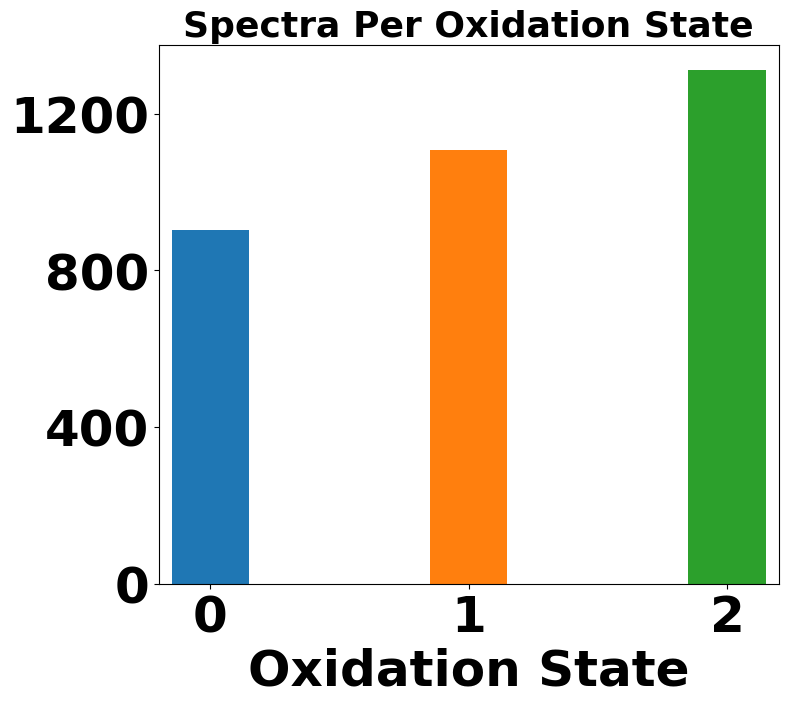

In [86]:
visualize_mixture_addition(test_rf_obj, False)

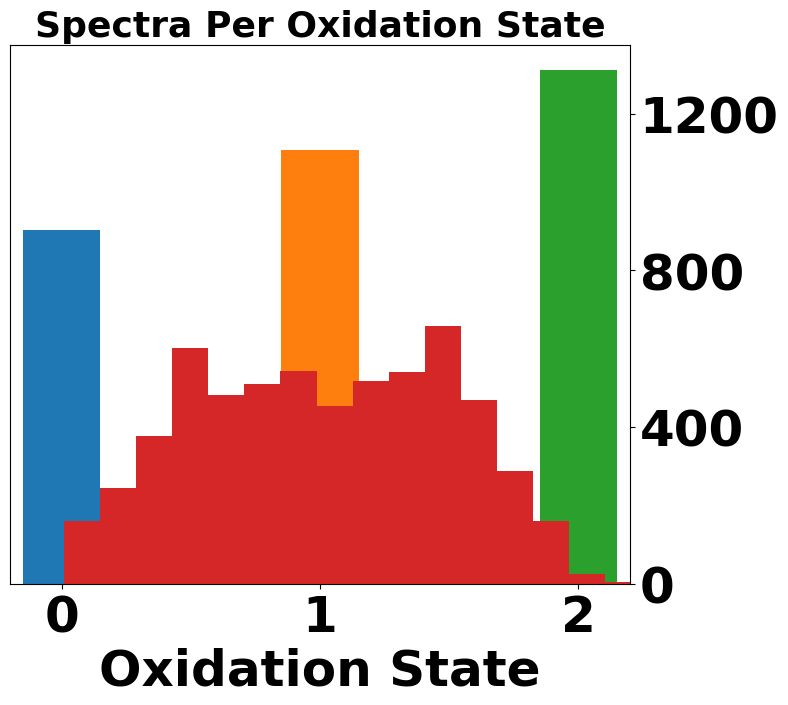

In [89]:
visualize_mixture_addition(test_rf_obj, True)

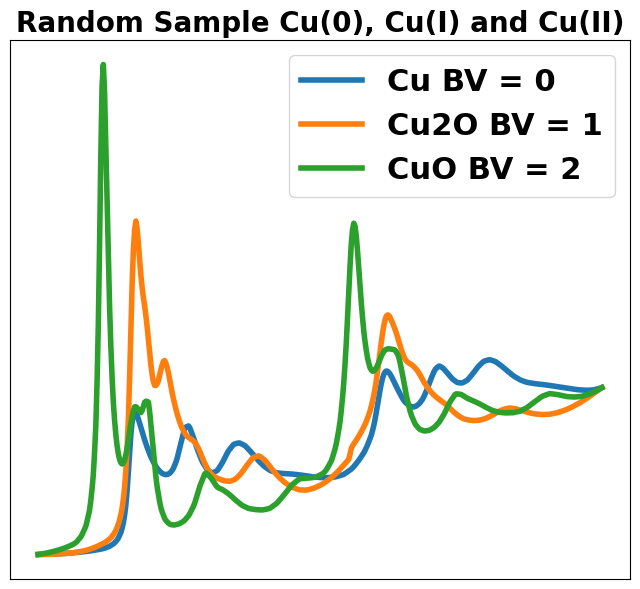

In [78]:
visualize_mixture_components('mp-30', 'mp-361', 'mp-704645', include_title=True, include_ticks = False)

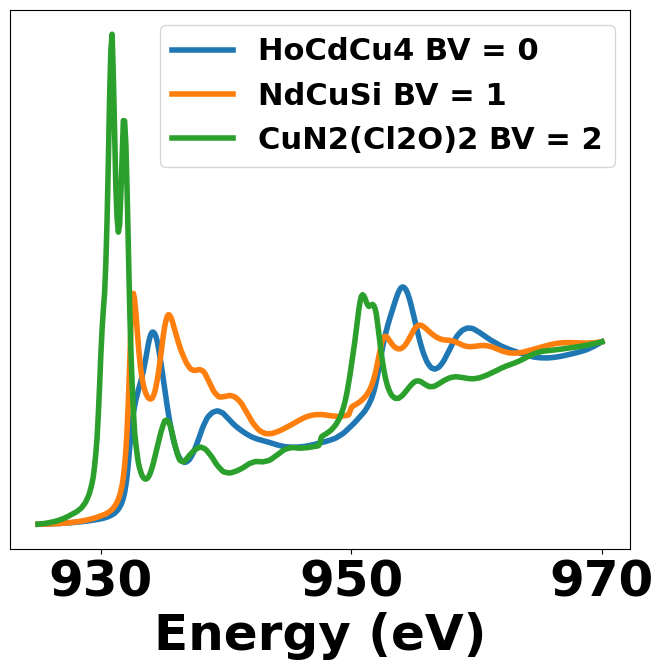

In [71]:
visualize_mixture_components('mp-12007', 'mp-8120', 'mp-1188453', include_title=False)

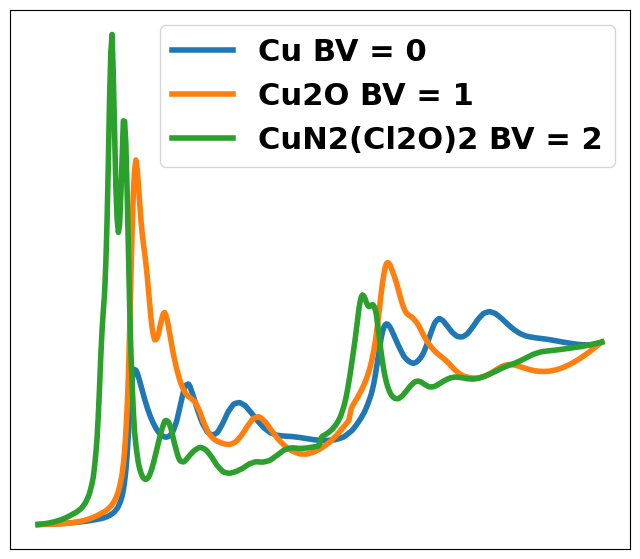

In [82]:
visualize_mixture_components('mp-30', 'mp-361', 'mp-1188453', include_title=False, include_ticks = False)

In [15]:
test_rf_obj.spectra_df.iloc[824]

index                                                                                      824
mpid_string                                                                          mp-704645
pretty_formula                                                                             CuO
L3_Fermis                                                                            [934.985]
BV Used For Alignment                                                                      2.0
TEAM_1_aligned_925_970                       [0.0, 0.0011345925801553344, 0.002324733565968...
new Scaled Energies use                      [925.0, 925.1, 925.2, 925.3, 925.4, 925.5, 925...
Cumulative_Spectra_TEAM_1_aligned_925_970    [0.0, 0.0, 3.5793219811095177e-06, 1.091320561...
Mixture Components                                                                         NaN
Name: 824, dtype: object

False
False
True


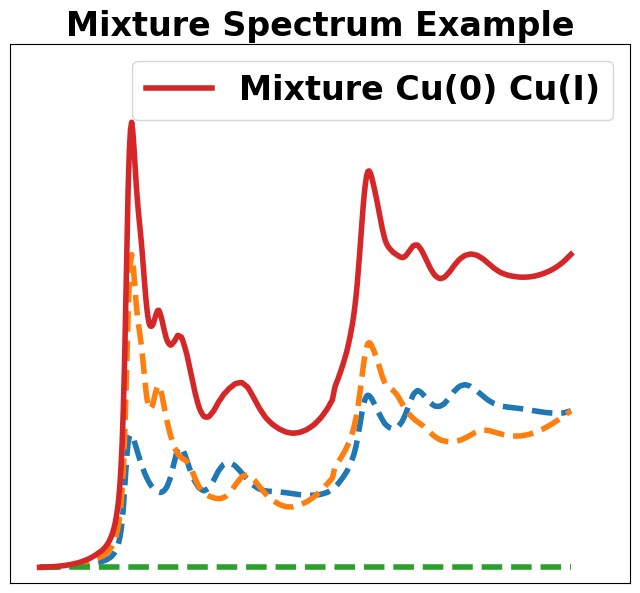

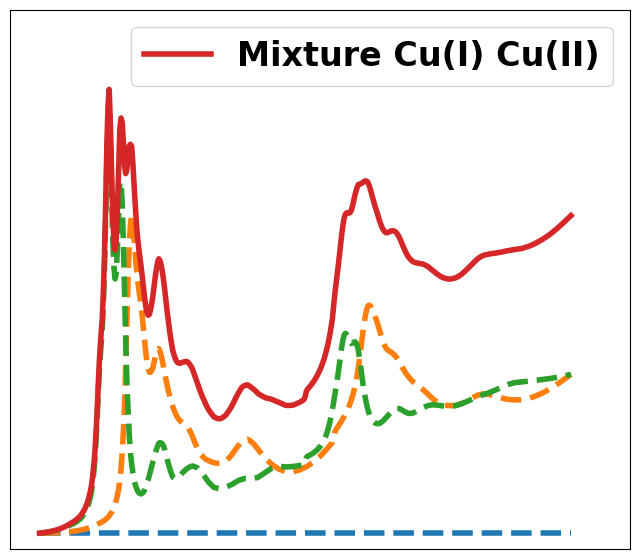

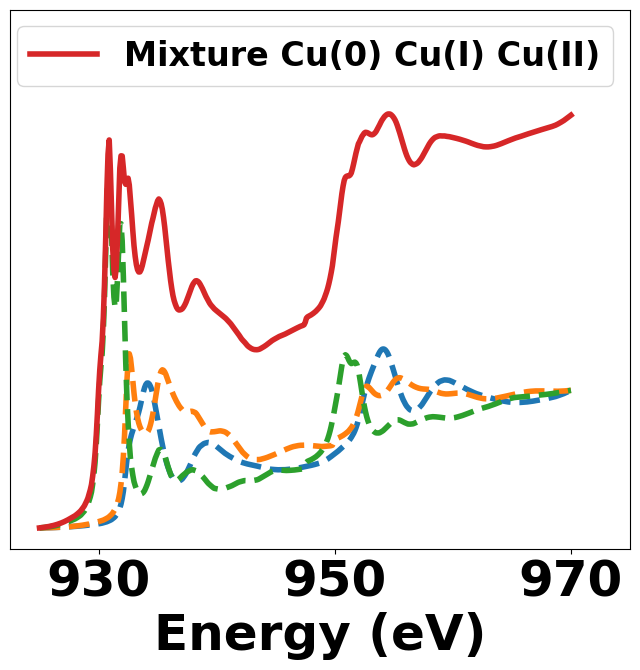

In [84]:
visualize_mixtures('mp-30', 'mp-361', 'mp-1188453', 0.5, 0.5, 0.0, include_title = True)
visualize_mixtures('mp-30', 'mp-361', 'mp-1188453', 0.0, 0.5, 0.5, include_title = False)
visualize_mixtures('mp-12007', 'mp-8120', 'mp-1188453', 0.33, 0.33, 0.33, include_ticks = True, include_title = False)